In [1]:
import os
os.environ["CC"] = "gcc"
os.environ["CXX"] = "gcc"
import sys
sys.path.append('/usr/lib/python3/dist-packages')
print(sys.path)
import os
os.environ["OMP_PROC_BIND"] = os.environ.get("OMP_PROC_BIND", "true")

import numpy as np
import matplotlib.pyplot as plt
import scipy.interpolate
%matplotlib inline

from pix_transform.pix_transform import PixTransform
from baselines.baselines import bicubic
from utils.utils import downsample,align_images
from prox_tv import tvgen
from utils.plots import plot_result

import imageio
import torch
torch.cuda.empty_cache()

['/home/beast2020/Desktop/mingchi/PixTransform-save_params', '/home/beast2020/anaconda3/lib/python38.zip', '/home/beast2020/anaconda3/lib/python3.8', '/home/beast2020/anaconda3/lib/python3.8/lib-dynload', '', '/home/beast2020/.local/lib/python3.8/site-packages', '/home/beast2020/anaconda3/lib/python3.8/site-packages', '/home/beast2020/.local/lib/python3.8/site-packages/IPython/extensions', '/home/beast2020/.ipython', '/usr/lib/python3/dist-packages']


## comballaz nadir

In [2]:
directory = os.path.dirname(os.getcwd())
directory

'/home/beast2020/Desktop/mingchi'

In [3]:
rgb_dir = directory+'/comballaz_nadir/rgb/'
_files = os.listdir(rgb_dir)
_files.sort()
_rgb_files = [rgb_dir + f for f in _files]
_rgb_files.sort()
print(len(_rgb_files))

dist_dir = directory+'/comballaz_nadir/dist/'
_files = os.listdir(dist_dir)
_files.sort()
_dist_files = [dist_dir + f for f in _files]
_dist_files.sort()
print(len(_dist_files))

25
25


In [4]:
guide_imgs = []
target_imgs= []

for num in range(len(_rgb_files)):
    rgb_img = imageio.imread(_rgb_files[num])
    guide_imgs.append(rgb_img)
    dist_img = torch.load(_dist_files[num])
    dist_img = dist_img.detach().cpu().numpy()
    target_imgs.append(dist_img)
        
guide_imgs = np.asarray(guide_imgs)
guide_imgs = np.einsum('ijkl->iljk', guide_imgs)        
target_imgs = np.asarray(target_imgs)

In [5]:
print(guide_imgs.shape)
print('max value in the image is: ' + str(guide_imgs.max()))
print('min value in the image is: ' + str(guide_imgs.min()))

(25, 3, 480, 720)
max value in the image is: 255
min value in the image is: 0


In [6]:
print(target_imgs.shape)
print('max value in the image is: ' + str(target_imgs.max()))
print('min value in the image is: ' + str(target_imgs.min()))

(25, 480, 720)
max value in the image is: 1051.2339
min value in the image is: 100.33856


In [7]:
# for i in range(25):
#     f, axarr = plt.subplots(1, 2)
#     guide_img = np.rollaxis(guide_imgs[i], 0, 3)
#     axarr[0].imshow(guide_img)
#     axarr[1].imshow(target_imgs[i])


### Change upsampling to 40

In [8]:
torch.cuda.empty_cache()

####### image 1/25 - image idx 0 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3300.5874     88.08347    67.92173    67.11958    56.61331    67.5764
   60.9871     59.832882   53.314972   52.25102    54.64487    50.483997
   49.780346   50.418953   50.09923    51.931053]
----------MAE----------
(16,)
[36.915874   6.6059823  5.205036   5.4987016  4.646054   5.0331073
  4.751666   4.4951634  4.437502   4.3783627  4.503361   4.3486834
  4.2561927  4.182873   4.294727   4.4749517]


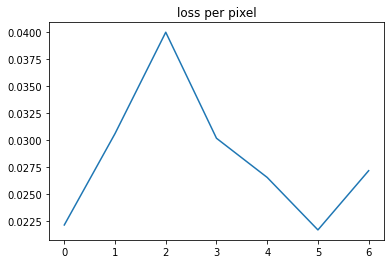

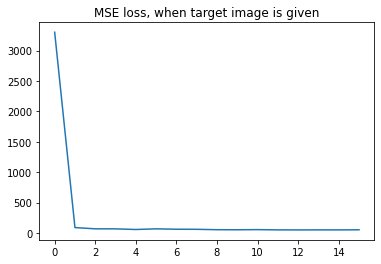

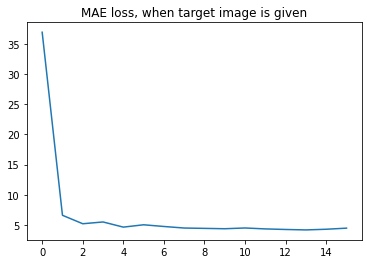

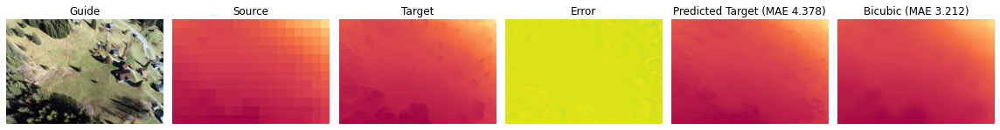

MSE: 51.648  ---  MAE: 4.378  ---  PBP: 0.757



####### image 2/25 - image idx 1 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2733.7366     93.864716   84.30383    80.23889    79.278854   76.7235
   77.788475   76.18044    75.5224     72.65125    76.632484   74.35385
   72.78718    73.45537    71.66774    75.40247 ]
----------MAE----------
(16,)
[30.180277   5.364783   4.752764   4.7779555  4.406761   4.3363194
  4.1300735  4.241619   4.1686587  3.9435468  4.3852696  4.151889
  3.9485173  3.8950875  3.8292336  4.0136313]


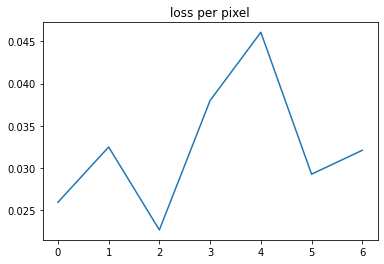

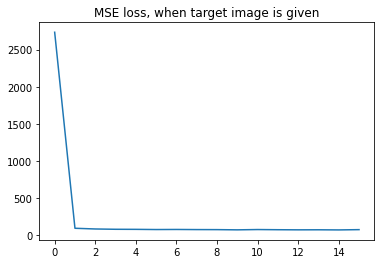

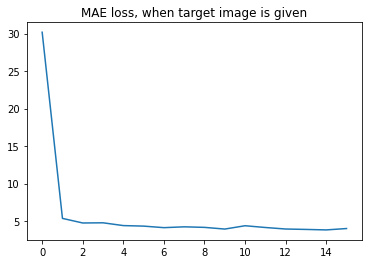

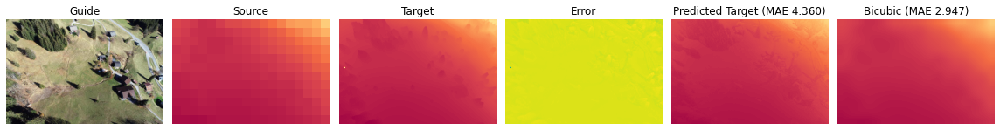

MSE: 77.370  ---  MAE: 4.360  ---  PBP: 0.790



####### image 3/25 - image idx 2 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2872.3813     66.68147    49.530453   48.300568   47.621395   42.547573
   46.823563   46.23922    44.9499     43.905178   46.55119    43.467224
   43.437172   42.79154    43.029686   44.277966]
----------MAE----------
(16,)
[34.93927    5.61138    4.332601   4.375469   4.228531   3.9366488
  4.1083274  4.0183587  3.9323921  3.9138734  3.9814937  3.9675732
  3.9512784  3.8283546  3.7383358  4.029979 ]


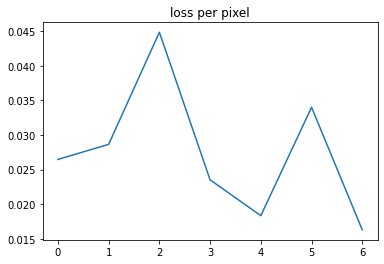

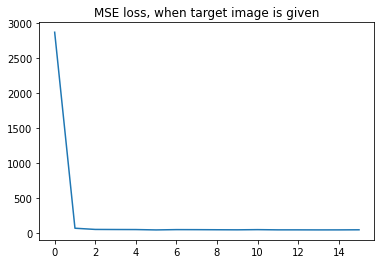

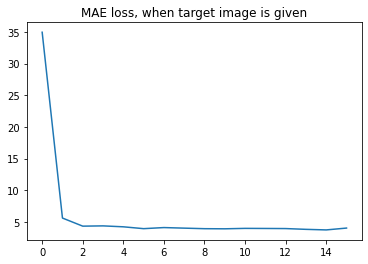

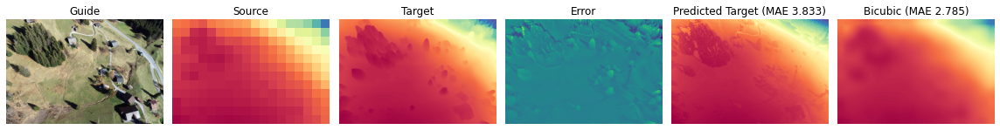

MSE: 42.876  ---  MAE: 3.833  ---  PBP: 0.686



####### image 4/25 - image idx 3 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[944.44916    32.62664    12.163603   13.477822   13.448197   12.656107
   8.6233635   8.147209    8.667209    9.071801    8.420663    8.171328
   8.211712    7.93277     8.692309    8.588171 ]
----------MAE----------
(16,)
[23.848043   3.0644093  1.699715   1.809989   1.6888571  1.9370244
  1.4631772  1.2725644  1.4261384  1.5578679  1.4500674  1.5858628
  1.4980085  1.5868343  1.402906   1.4037853]


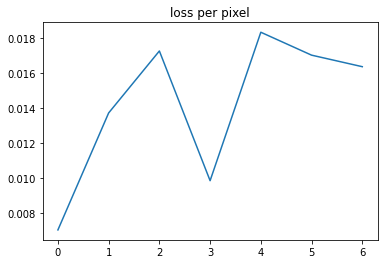

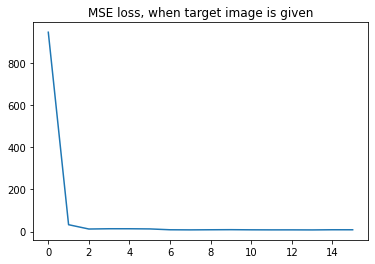

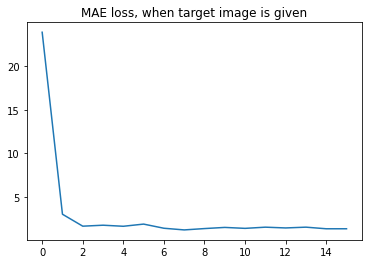

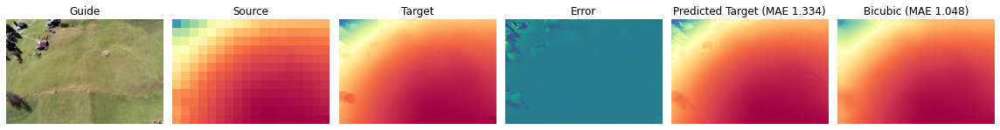

MSE: 8.338  ---  MAE: 1.334  ---  PBP: 0.329



####### image 5/25 - image idx 4 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1744.3395    892.50446   719.49084    51.636784   39.448112   34.53474
   33.982845   33.347073   34.45958    33.69465    35.53388    34.768208
   34.04621    33.231266   33.61749    33.79601 ]
----------MAE----------
(16,)
[26.29697   12.48123    9.924684   3.2819614  2.4973438  1.3567106
  1.324544   1.3127958  1.6348927  1.3659409  1.9872127  1.4770333
  1.4289485  1.2649448  1.3826947  1.2546268]


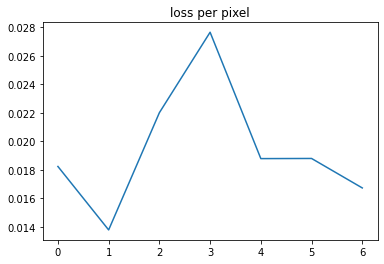

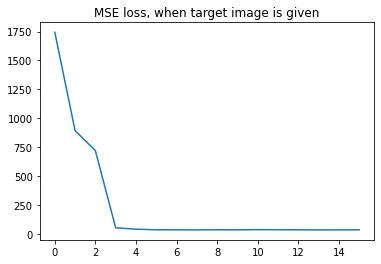

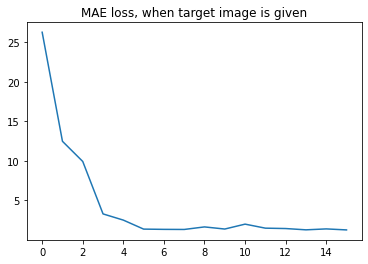

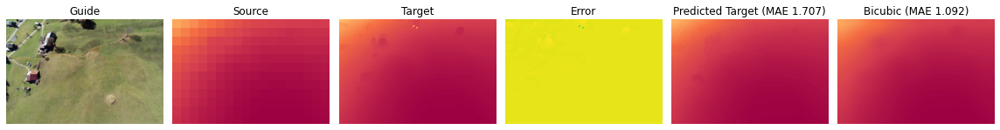

MSE: 34.314  ---  MAE: 1.707  ---  PBP: 0.666



####### image 6/25 - image idx 5 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1102.7356     51.515995   42.79327    37.657375   38.28924    37.330917
   37.044662   37.09123    36.700596   36.973976   36.033436   36.146126
   36.36935    37.671574   36.191864   35.66234 ]
----------MAE----------
(16,)
[19.846796   3.2557118  2.2976954  1.699842   2.074321   1.7038325
  1.7424917  1.6693571  1.7278872  1.6028833  1.5037277  1.5258509
  1.5973614  1.6864668  1.5719708  1.4130136]


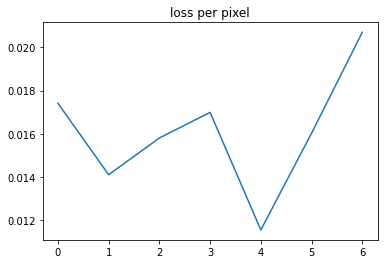

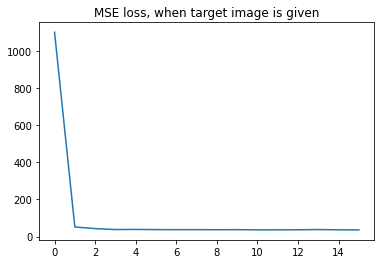

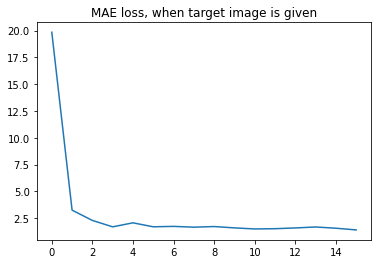

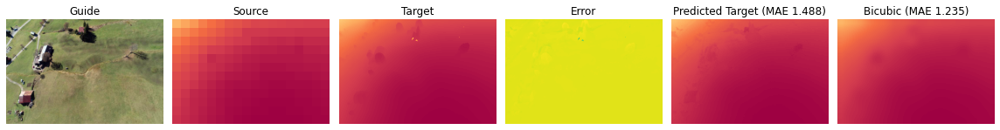

MSE: 35.873  ---  MAE: 1.488  ---  PBP: 0.390



####### image 7/25 - image idx 6 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1225.1014     40.048073   36.014027   35.154877   35.453743   33.713364
   34.434658   35.723484   33.572594   34.82498    33.06114    32.594112
   38.252216   32.75758    32.101406   33.18682 ]
----------MAE----------
(16,)
[21.9635     2.6829212  2.1917582  2.1409552  2.1397812  1.7819762
  1.8862995  2.4887946  1.7482032  1.982962   1.7513393  1.7296642
  2.4935584  1.8336015  1.6404456  1.7477741]


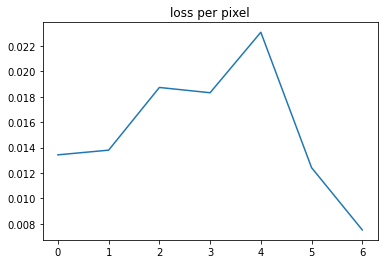

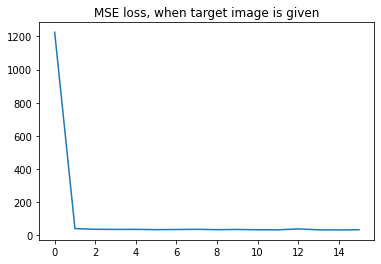

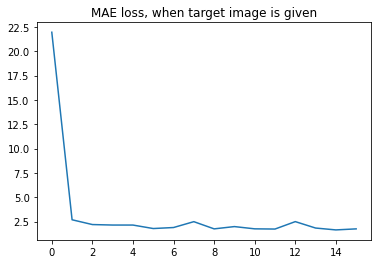

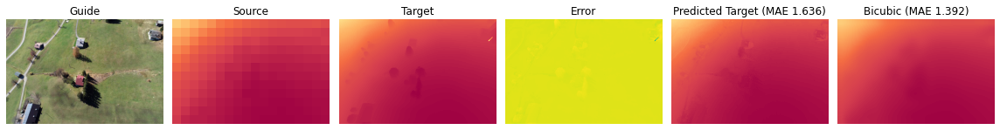

MSE: 32.351  ---  MAE: 1.636  ---  PBP: 0.385



####### image 8/25 - image idx 7 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1265.8348     38.857502   26.554688   22.08752    23.964008   18.823196
   20.710735   18.141111   17.46379    18.315044   19.176342   18.09946
   18.406971   18.496082   17.966099   18.283348]
----------MAE----------
(16,)
[27.714277   3.4655433  3.2631922  2.6978981  2.9042192  2.4023845
  2.6872618  2.4551654  2.2469857  2.3053718  2.3243449  2.3254573
  2.3873415  2.2388709  2.2510793  2.271741 ]


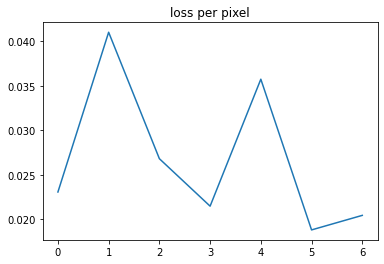

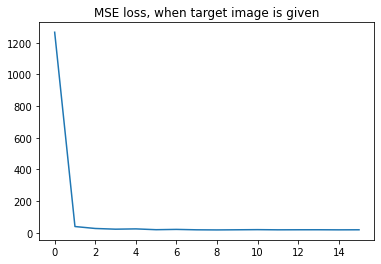

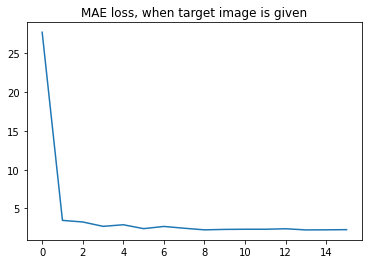

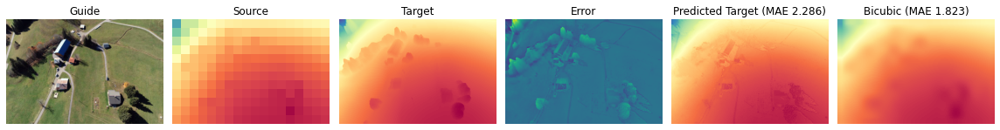

MSE: 17.794  ---  MAE: 2.286  ---  PBP: 0.526



####### image 9/25 - image idx 8 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1510.7489     18.968878   19.991386   24.097893   17.66077    16.264708
   15.606079   14.912182   14.783659   12.696302   13.871218   15.033973
   14.412647   15.847682   13.922817   14.475276]
----------MAE----------
(16,)
[26.187449   3.1424305  2.8425055  3.582257   2.8384614  2.6951241
  2.695065   2.3926108  2.39267    2.2077453  2.2987428  2.4690948
  2.3696737  2.629684   2.3366623  2.4561265]


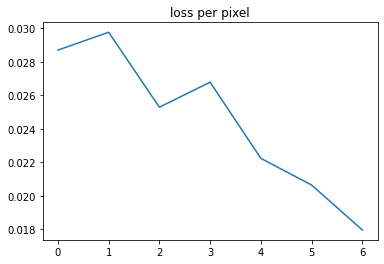

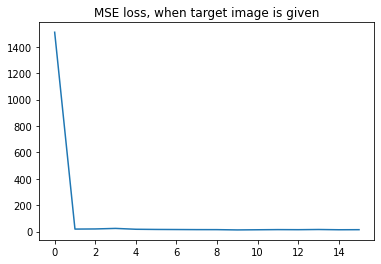

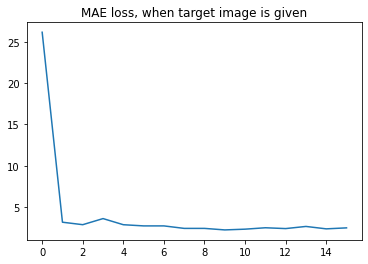

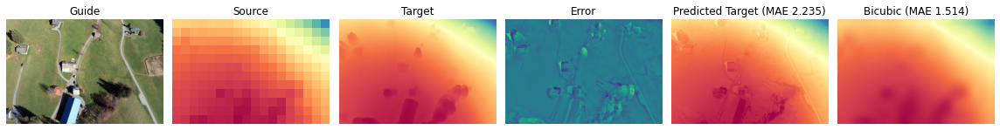

MSE: 13.344  ---  MAE: 2.235  ---  PBP: 0.596



####### image 10/25 - image idx 9 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1722.9711     29.625309   25.92079    25.009665   27.413889   25.319109
   23.905718   24.254597   23.728231   23.15831    22.559458   22.4957
   22.6501     26.670769   24.753067   22.688654]
----------MAE----------
(16,)
[26.199821   2.844038   2.5074928  2.292355   2.730578   2.1956913
  2.1016247  2.28396    2.0735536  1.9787236  1.9317487  1.9630984
  2.0353642  2.7232618  2.533792   2.032755 ]


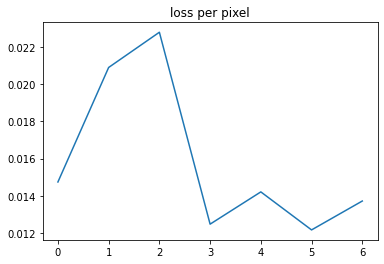

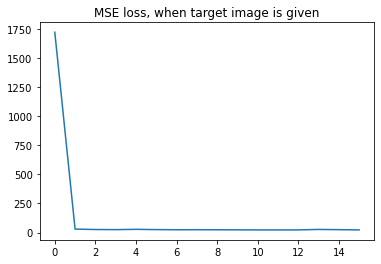

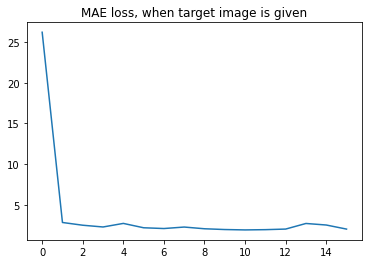

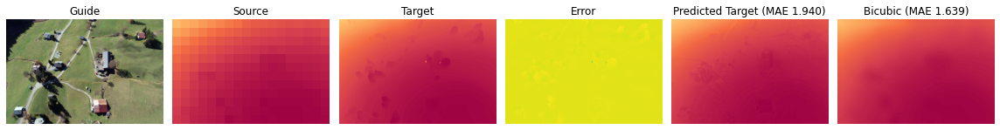

MSE: 22.622  ---  MAE: 1.940  ---  PBP: 0.497



####### image 11/25 - image idx 10 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2070.2522     80.7658     57.04041    54.101353   53.47813    57.367348
   53.190117   52.08127    52.563263   51.149086   51.058815   52.579388
   50.99363    51.16041    51.215927   51.686558]
----------MAE----------
(16,)
[30.789892   3.9569678  2.6372147  2.414128   2.441754   3.1442444
  2.3787816  2.3294666  2.228877   2.033658   2.0668616  2.5232131
  2.0272288  2.0489354  2.0181334  2.3027358]


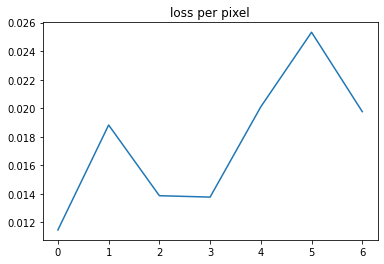

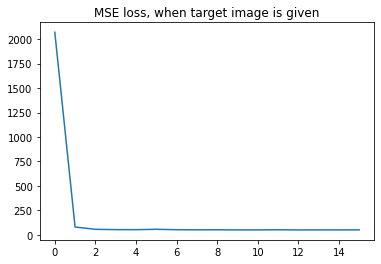

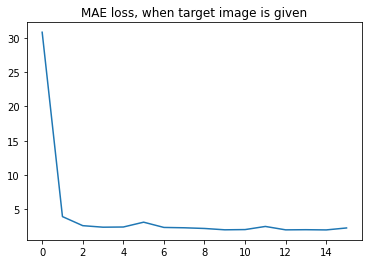

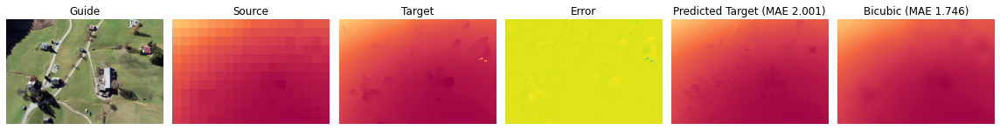

MSE: 50.980  ---  MAE: 2.001  ---  PBP: 0.465



####### image 12/25 - image idx 11 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1099.3004     52.286488   55.607517   49.775146   51.952778   50.359264
   50.62301    48.831974   49.64013    55.344086   49.926052   50.690468
   48.559402   51.22132    50.26137    48.689423]
----------MAE----------
(16,)
[23.96293    2.5111372  3.0686517  2.1992984  2.6120389  2.441021
  2.5358052  2.0765383  2.2274725  3.009477   2.288341   2.4262695
  2.1111815  2.5425432  2.3802862  2.147414 ]


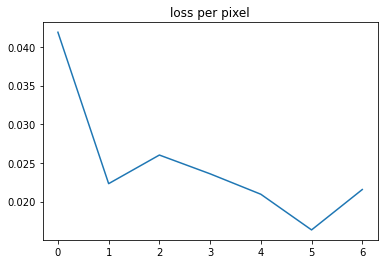

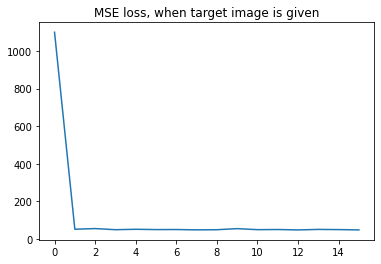

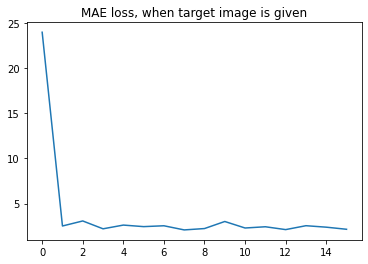

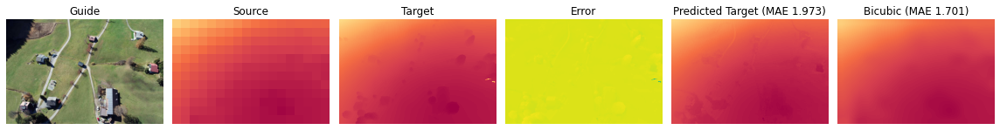

MSE: 47.906  ---  MAE: 1.973  ---  PBP: 0.493



####### image 13/25 - image idx 12 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[4952.379     144.35562   114.854515  117.89007   112.77062   107.32059
  118.65255   111.41196   121.10869   104.966805  109.366554  120.29399
  112.43737   111.533806  112.52113   121.76882 ]
----------MAE----------
(16,)
[43.321762   7.9831705  5.2463236  5.9994764  4.8157077  4.702804
  5.438172   4.868033   5.23965    4.5101643  4.6103597  4.9173408
  4.827246   5.093796   4.6091437  4.901853 ]


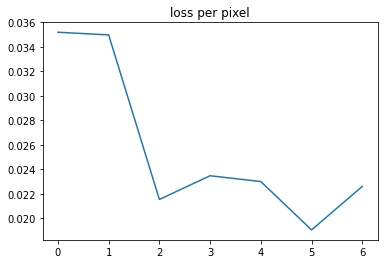

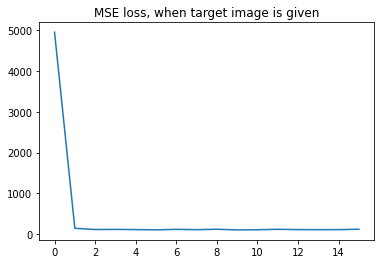

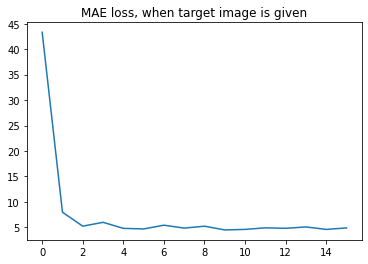

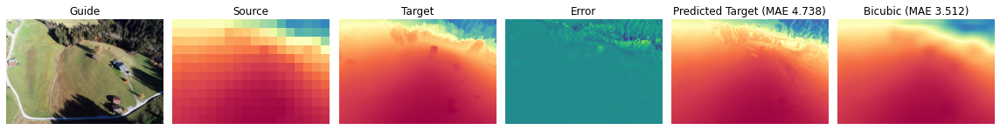

MSE: 117.884  ---  MAE: 4.738  ---  PBP: 0.520



####### image 14/25 - image idx 13 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2805.0977    108.08403    98.2365     95.7886    108.060646   94.8578
   90.82822    95.307526   90.48863    90.44053    99.12453    90.22678
   95.67624    94.840126   91.2608     89.45405 ]
----------MAE----------
(16,)
[35.120304   6.0949364  5.2594857  4.8357487  5.6013193  5.0527606
  5.0303597  4.978765   4.602244   5.2193513  5.3357067  5.0486
  4.894098   5.2679396  5.0497026  4.672893 ]


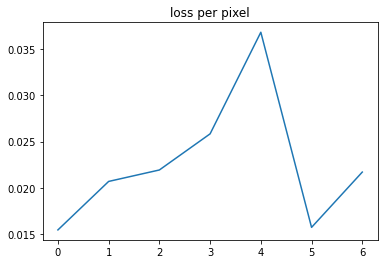

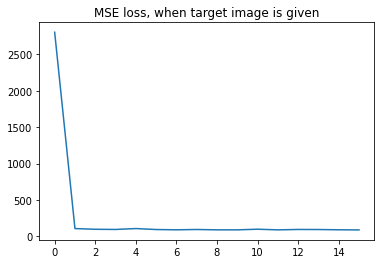

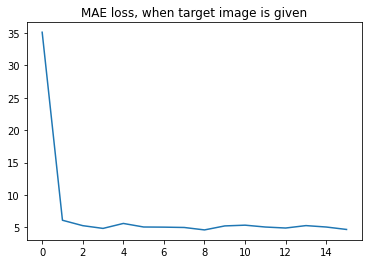

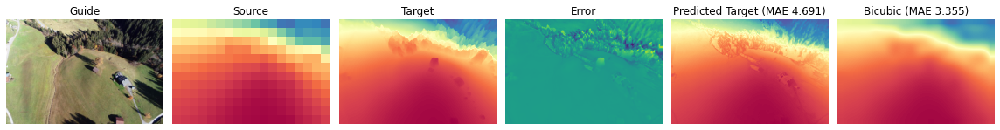

MSE: 94.626  ---  MAE: 4.691  ---  PBP: 0.520



####### image 15/25 - image idx 14 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3140.394     129.02795   101.45978    89.273705   96.66446    79.94889
   73.79004    75.241554   71.831116   69.63496    66.88348    65.90463
   61.925583   60.635345   58.70732    62.45188 ]
----------MAE----------
(16,)
[39.79367    6.844226   5.989804   5.5103803  5.5434756  5.149431
  4.6685543  5.026289   5.285457   4.8791623  4.5020657  4.3138022
  4.750717   4.1705317  4.053451   4.8541155]


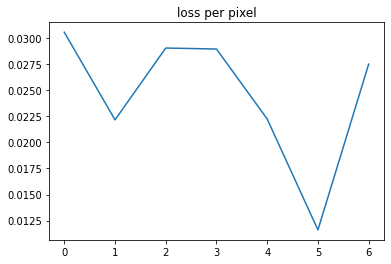

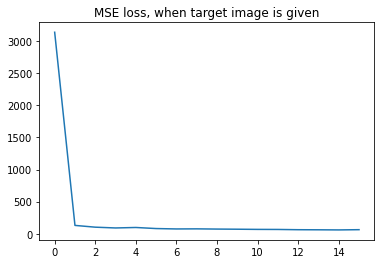

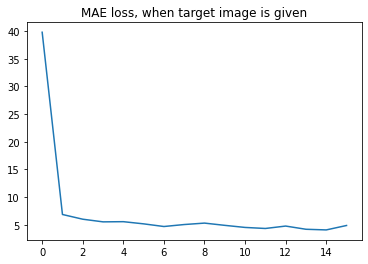

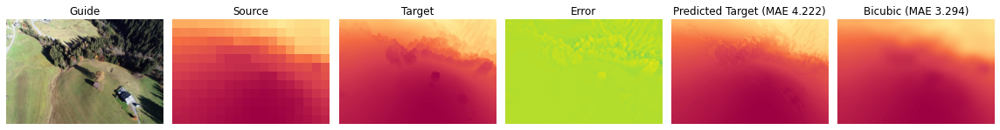

MSE: 61.347  ---  MAE: 4.222  ---  PBP: 0.611



####### image 16/25 - image idx 15 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1021.515       23.44692     16.872946    14.88394     14.24024
   10.361019    10.340685    10.186025    11.826782    11.3241415
   10.247367     9.658562     8.816412     9.335871     8.157947
    8.04758  ]
----------MAE----------
(16,)
[21.188974   3.0315464  2.6359189  2.3290083  2.366472   1.8763957
  1.9623022  1.7526382  1.8041517  1.8612777  1.815714   1.802309
  1.510223   1.7598763  1.4223899  1.387988 ]


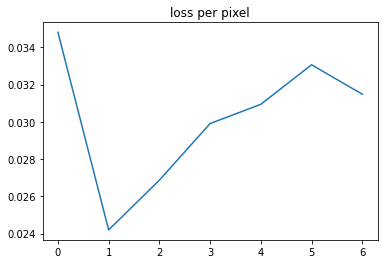

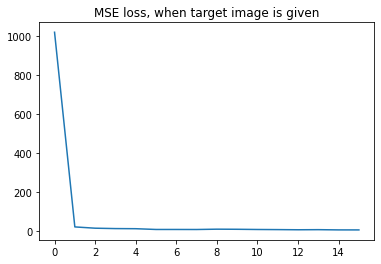

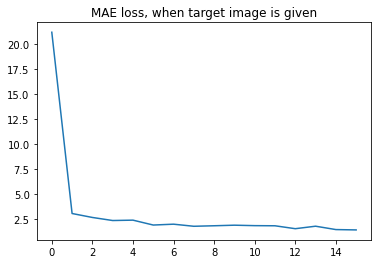

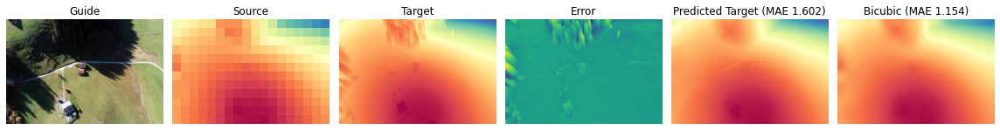

MSE: 8.373  ---  MAE: 1.602  ---  PBP: 0.455



####### image 17/25 - image idx 16 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1083.1776     40.33229    31.927456   31.836563   29.168959   29.105484
   24.432302   24.432842   24.066895   22.922886   24.62006    23.237347
   23.58737    23.225332   21.495136   22.289341]
----------MAE----------
(16,)
[22.532265   3.6240683  2.9903195  2.9629009  2.7159932  3.1505885
  2.3237686  2.2837985  2.380087   2.2240794  2.4898899  2.0216346
  2.4102008  2.5968978  2.031439   2.0940049]


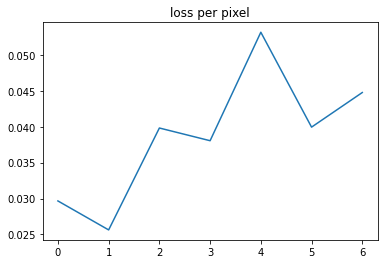

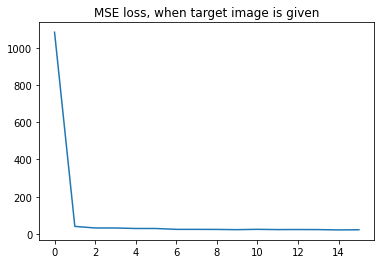

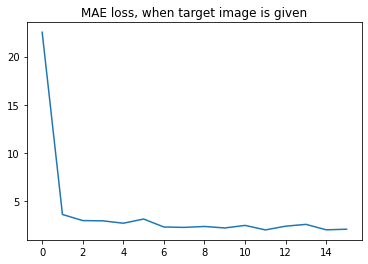

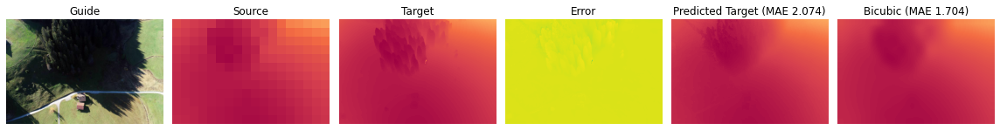

MSE: 21.943  ---  MAE: 2.074  ---  PBP: 0.466



####### image 18/25 - image idx 17 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1426.7518    103.32192    60.793205   58.351643   55.009357   50.55793
   51.3702     50.146366   48.192608   47.976337   48.922043   51.435696
   47.693417   47.89099    46.142414   46.168774]
----------MAE----------
(16,)
[27.595003   8.162081   5.9424057  5.3640065  5.1435256  4.6607356
  4.8338404  4.6887245  4.5101614  4.7615623  4.6040397  4.5925946
  4.4509954  4.5319104  4.4084663  4.347088 ]


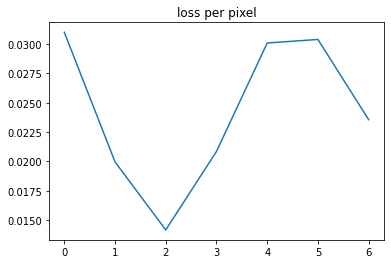

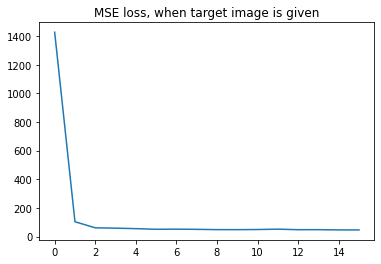

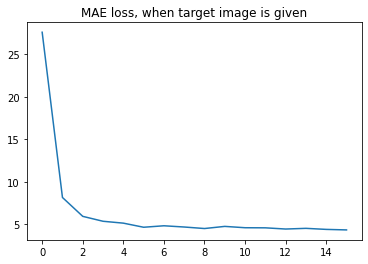

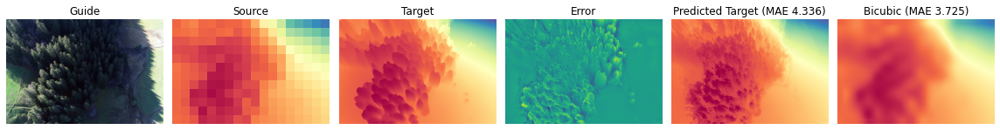

MSE: 45.419  ---  MAE: 4.336  ---  PBP: 0.710



####### image 19/25 - image idx 18 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1430.6666    124.08981    95.38092    92.83567    75.72474    69.54696
   67.13008    62.50235    68.055984   60.31749    57.456642   57.1292
   59.315983   55.261868   55.861927   56.509506]
----------MAE----------
(16,)
[27.46299    7.501802   6.6706715  6.4840364  5.7768664  5.4539013
  5.499629   5.2813377  5.6694074  5.1615148  4.995545   4.953063
  5.333543   4.833089   4.937024   4.9047303]


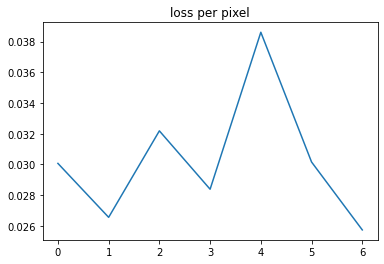

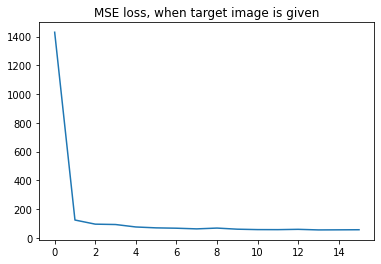

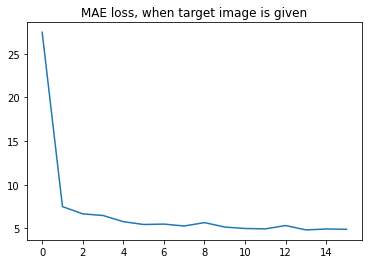

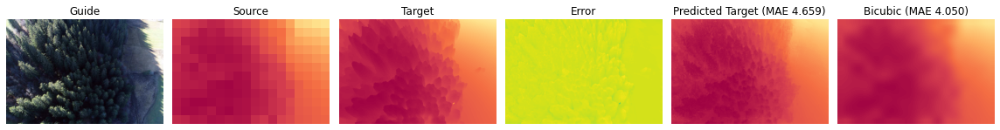

MSE: 51.977  ---  MAE: 4.659  ---  PBP: 0.777



####### image 20/25 - image idx 19 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[5015.7046    149.49667   125.70792   124.0706    119.02673   111.807526
  136.81044   112.99752   112.751816  107.86669   121.39495   109.9972
  105.73632   112.188065  105.36454   104.99548 ]
----------MAE----------
(16,)
[57.2342     7.9903502  7.3349233  7.1864223  6.979087   6.669713
  8.889443   6.804639   6.635819   6.4085     7.0957017  6.5585837
  6.447077   7.0904555  6.3309927  6.5390077]


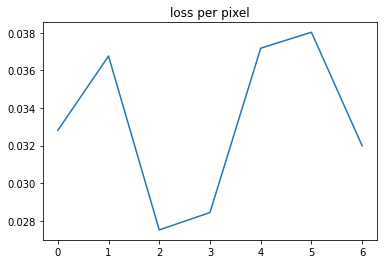

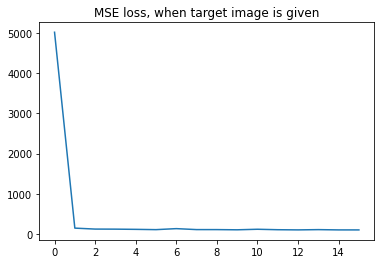

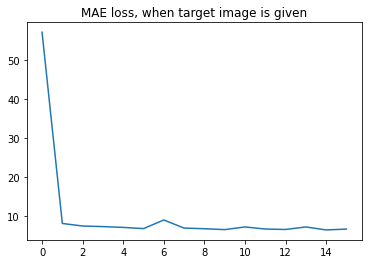

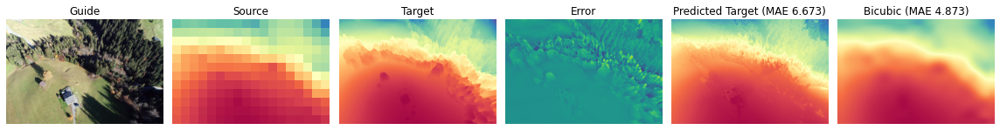

MSE: 104.700  ---  MAE: 6.673  ---  PBP: 0.845



####### image 21/25 - image idx 20 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[613.4187     17.844854   16.556097   12.796017   11.639648   11.225517
  12.0025625  11.10395    10.01568    10.250205   10.279221    9.622571
   9.960341    9.858862    9.416052    9.358732 ]
----------MAE----------
(16,)
[19.69953    2.7134228  2.8557353  2.0834343  1.8747293  1.8516766
  2.1860049  1.8033903  1.6830935  1.7100253  1.7789485  1.569904
  1.7605147  1.6370723  1.6278632  1.5741616]


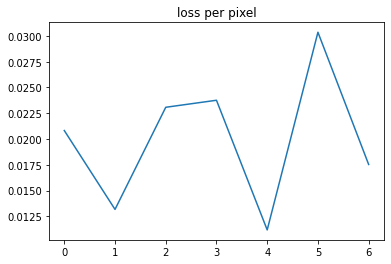

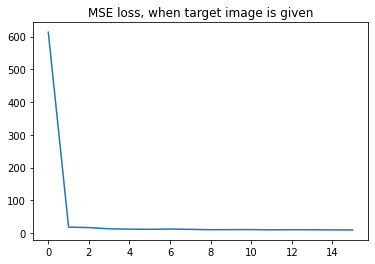

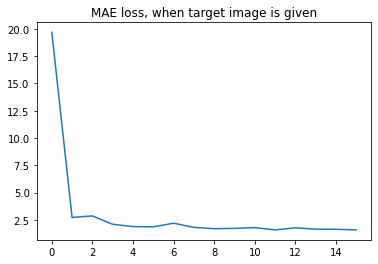

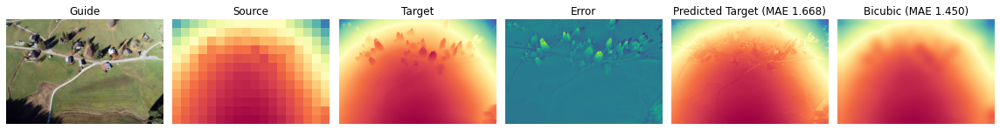

MSE: 9.551  ---  MAE: 1.668  ---  PBP: 0.420



####### image 22/25 - image idx 21 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[747.82404   24.432407  13.342899  12.92037   14.817736  12.567112
  11.248869  12.182828  10.981538  12.828757  11.321346  11.12523
  11.125321  11.010475  11.331697  10.405245]
----------MAE----------
(16,)
[21.155645   3.2100875  2.1414623  2.1236453  2.495119   2.1255805
  1.8579668  2.0322464  1.7576603  2.2756824  1.8385476  1.8055811
  1.7406068  1.7758814  1.9023615  1.6303211]


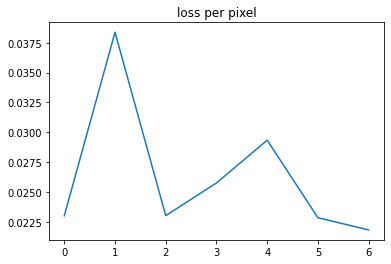

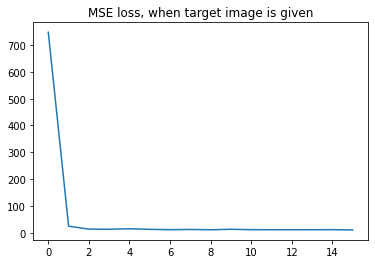

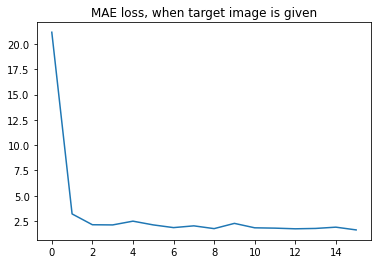

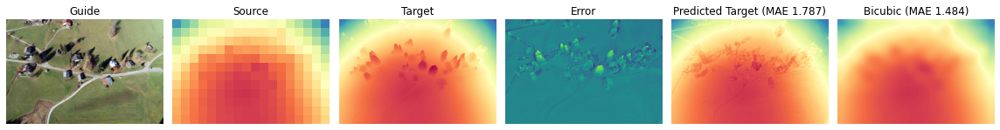

MSE: 10.807  ---  MAE: 1.787  ---  PBP: 0.433



####### image 23/25 - image idx 22 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[685.75543   18.26581   15.17072   12.588403  13.310208  11.582126
  11.984926  12.035705  12.219093  11.60567   11.177232  10.687604
  10.847767  10.552936  11.293524  10.560405]
----------MAE----------
(16,)
[19.726278   2.7597923  2.542373   2.1926978  2.3749995  1.9411473
  2.1752222  2.129204   2.1704311  2.0374353  1.9424419  1.8245623
  1.8231143  1.8557191  1.966038   1.8113531]


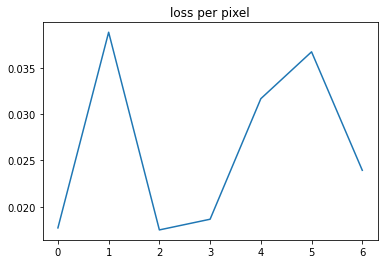

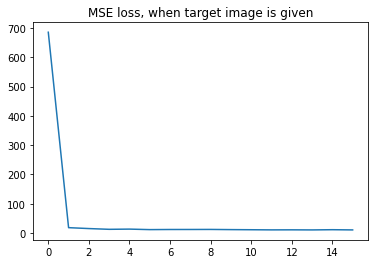

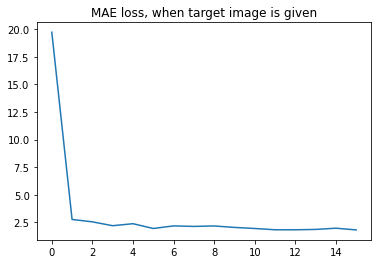

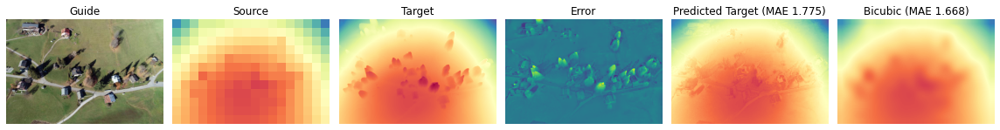

MSE: 10.494  ---  MAE: 1.775  ---  PBP: 0.446



####### image 24/25 - image idx 23 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[508.25574    17.347025   16.290365   16.356304   15.249267   15.817758
  18.014387   14.676836   15.641325   14.606638   16.251072   14.693581
  15.037896   14.4755945  14.964226   14.659778 ]
----------MAE----------
(16,)
[17.400156   2.5795934  2.6399357  2.662596   2.5127423  2.533501
  2.7113955  2.3642573  2.4480567  2.329792   2.5637174  2.2946744
  2.3810532  2.2590935  2.2923548  2.3078613]


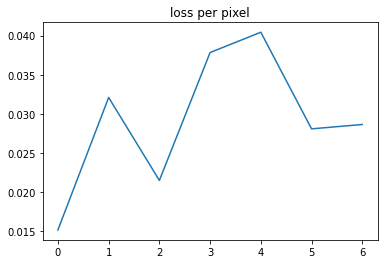

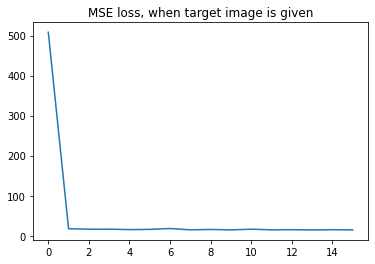

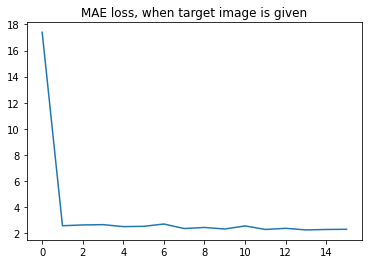

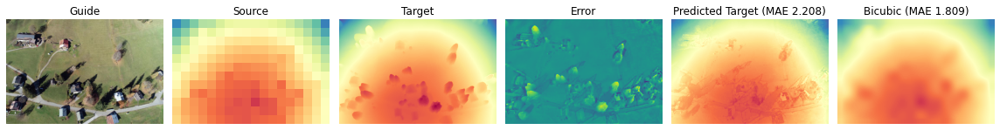

MSE: 14.285  ---  MAE: 2.208  ---  PBP: 0.490



####### image 25/25 - image idx 24 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[307.53845   21.251152  19.32179   16.90134   15.928961  15.808501
  16.28729   15.552474  15.489745  16.691189  16.377964  15.313191
  15.434508  15.295297  15.274904  15.150069]
----------MAE----------
(16,)
[13.600696   2.234629   2.0574882  1.5170112  1.3023181  1.2298801
  1.4817804  1.1581333  1.2109915  1.4365227  1.2987878  1.1321177
  1.1214354  1.1520238  1.049393   1.1139203]


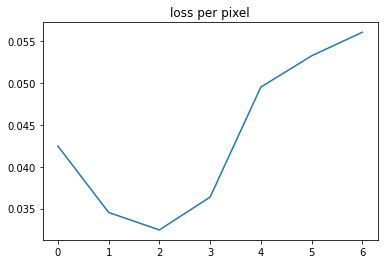

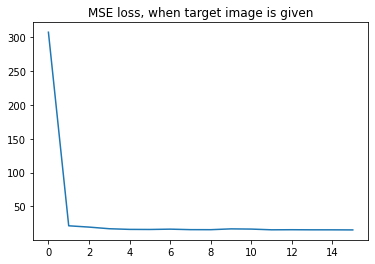

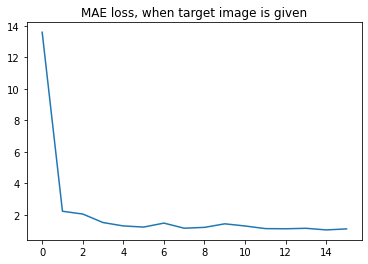

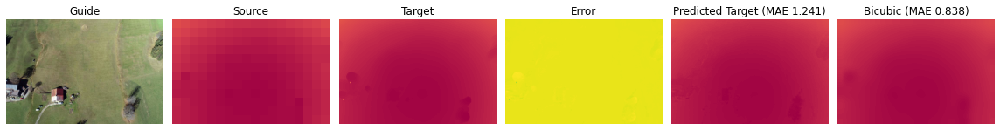

MSE: 15.490  ---  MAE: 1.241  ---  PBP: 0.377





In [9]:
####  define parameters  ########################################################
params = {'img_idxs' : [], # idx images to process, if empty then all of them
            
          'scaling': 40,
          'greyscale': False, # Turn image into grey-scale
          'channels': -1,
          
          'spatial_features_input': True,
          'weights_regularizer': [0.0001, 0.001, 0.0001], # spatial color head
          'loss': 'l1',
 
          'optim': 'adam',
          'lr': 0.001,
                  
          'batch_size': 32,
          'iteration': 1024*12*18//32,
                  
          'logstep': 64,
          
          'final_TGV' : False, # Total Generalized Variation in post-processing
          'align': False, # Move image around for evaluation in case guide image and target image are not perfectly aligned
          'delta_PBP': 1, # Delta for percentage of bad pixels 
         }

#### train and plot the results ################################################
if len(params['img_idxs'])==0:
    idxs = np.array(range(0,target_imgs.shape[0]))
else:
    idxs = params['img_idxs']

constant = 0
    
for n_image,idx in enumerate(idxs):
    
    print("####### image {}/{} - image idx {} ########".format(n_image+1,len(idxs),idx))
    
    guide_img = guide_imgs[idx]
    target_img = target_imgs[idx]
    source_img = downsample(target_img,params['scaling'])
    save_path = directory+'/saved_model_comballaz_nadir/model'+str(constant + idx)+'.pt'
    # check if the directory exist
    os.makedirs(os.path.dirname(save_path),exist_ok=True)
    
    bicubic_target_img = bicubic(source_img=source_img, scaling_factor=params['scaling'])
    
    predicted_target_img = PixTransform(guide_img=guide_img,source_img=source_img,params=params,target_img=target_img, path = save_path)
    


    if params['final_TGV'] :
        print("applying TGV...")
        predicted_target_img = tvgen(predicted_target_img,[0.1, 0.1],[1, 2],[1, 1])
        
    if params['align'] :
        print("aligning...")
        target_img,predicted_target_img = align_images(target_img,predicted_target_img)

    f, ax = plot_result(guide_img,source_img,predicted_target_img,bicubic_target_img,target_img)
    plt.show()
    
    if target_img is not None:
        # compute metrics and plot results
        MSE = np.mean((predicted_target_img - target_img) ** 2)
        MAE = np.mean(np.abs(predicted_target_img - target_img))
        PBP = np.mean(np.abs(predicted_target_img - target_img) > params["delta_PBP"])

        print("MSE: {:.3f}  ---  MAE: {:.3f}  ---  PBP: {:.3f}".format(MSE,MAE,PBP))
        print("\n\n")
 


### Change upsampling to 90， here first try crop the image to 450x720

In [10]:

torch.cuda.empty_cache()

In [11]:
guide_imgs = []
target_imgs= []

for num in range(len(_rgb_files)):
    rgb_img = imageio.imread(_rgb_files[num])
    guide_imgs.append(rgb_img)
    dist_img = torch.load(_dist_files[num])
    dist_img = dist_img.detach().cpu().numpy()
    target_imgs.append(dist_img)
        
guide_imgs = np.asarray(guide_imgs)
guide_imgs = np.einsum('ijkl->iljk', guide_imgs)        
target_imgs = np.asarray(target_imgs)

In [12]:
## crop images
new_guide_imgs = guide_imgs[:,:,15:465,:]
new_target_imgs = target_imgs[:,15:465,:]
print(new_guide_imgs.shape)
print(new_target_imgs.shape)

(25, 3, 450, 720)
(25, 450, 720)


####### image 1/25 - image idx 0 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2616.5496   542.041    145.05602  150.41467  205.8146   156.56593
  158.96484  154.34892  147.46863  143.40758  154.6678   140.5586
  132.47356  138.81517  135.55399  128.74557]
----------MAE----------
(16,)
[34.731495  13.621182   8.209974   8.446261  10.431312   8.238602
  8.288054   7.864411   8.015557   7.781741   8.05716    7.7043905
  7.629361   7.5956173  7.660999   7.538954 ]


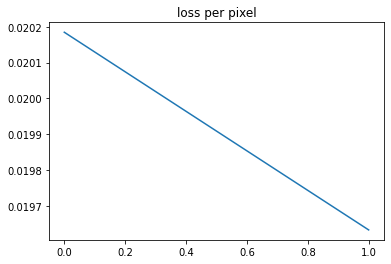

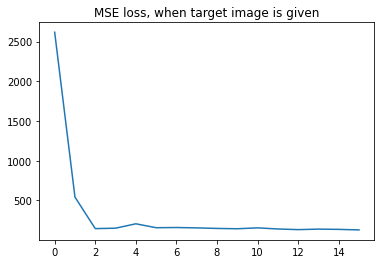

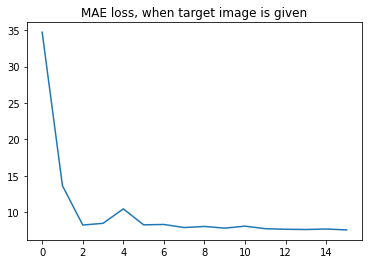

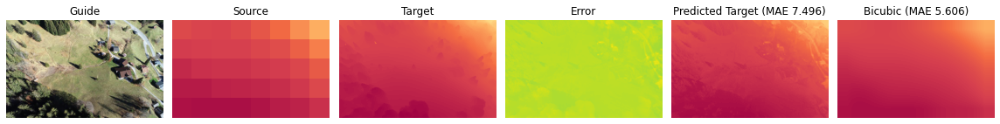

MSE: 130.558  ---  MAE: 7.496  ---  PBP: 0.872



####### image 2/25 - image idx 1 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2942.826     307.29517   148.9679    130.22491   122.16983   127.96373
  133.06207   133.19876   121.02009   126.92197   116.19373   112.00288
  119.59354   118.61578   115.148346  120.6326  ]
----------MAE----------
(16,)
[32.46372   11.48389    7.3538766  6.984185   5.9430027  5.98949
  6.3722086  6.4925156  5.961364   5.9659243  5.8382273  5.728999
  5.818831   5.9303074  5.7864847  5.892442 ]


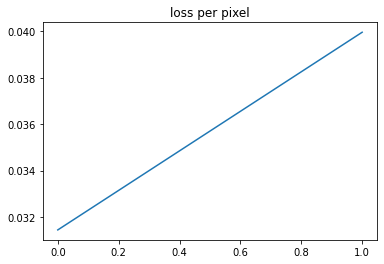

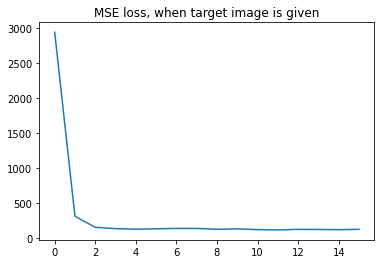

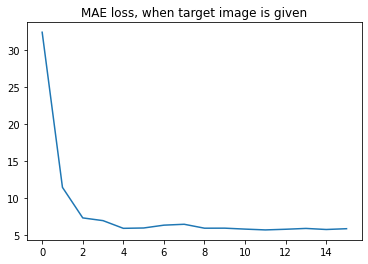

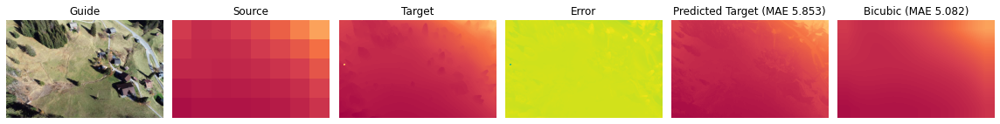

MSE: 114.692  ---  MAE: 5.853  ---  PBP: 0.851



####### image 3/25 - image idx 2 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3427.0112   286.33383  160.95363  150.8814   160.29166  140.09482
  131.35924  120.73855  129.35527  122.52959  106.02072  115.70316
  101.38241  102.91519  100.22918  102.88463]
----------MAE----------
(16,)
[35.56709   11.687555   7.926153   7.9964924  8.210701   7.7541575
  7.740579   7.0969043  7.441786   7.4417596  6.6369452  7.286588
  6.634797   6.647535   6.5077524  6.7451468]


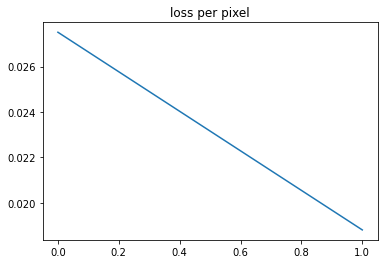

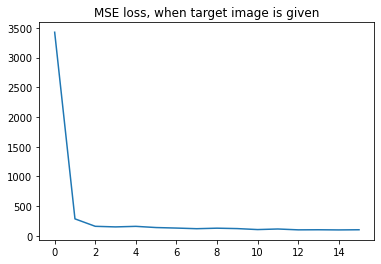

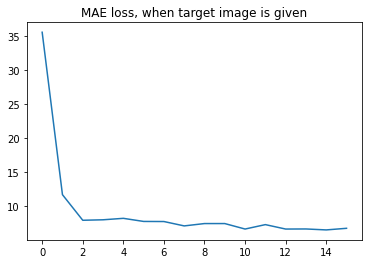

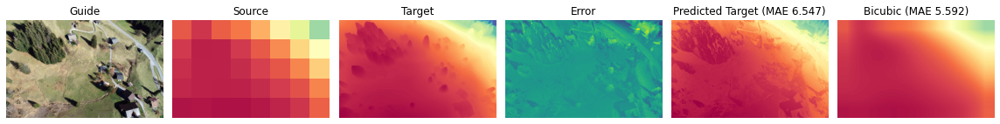

MSE: 96.829  ---  MAE: 6.547  ---  PBP: 0.846



####### image 4/25 - image idx 3 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1490.984     342.78043   267.24884   175.4615    166.45386   118.579636
  104.78948    98.1324    101.12154    91.06162    88.803345   81.31957
   72.40275    71.95142    72.16406    63.06204 ]
----------MAE----------
(16,)
[29.143198   6.849228   5.4544373  5.233214   5.0179286  4.5724893
  4.6309395  4.1491256  3.8276398  4.0179815  3.7015522  3.4846287
  3.6233635  3.3651989  3.5630217  3.3243484]


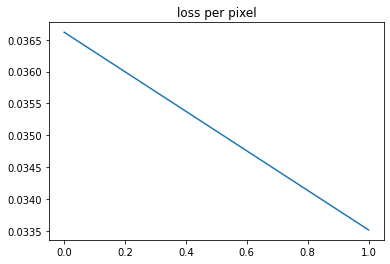

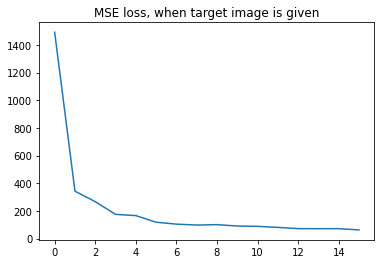

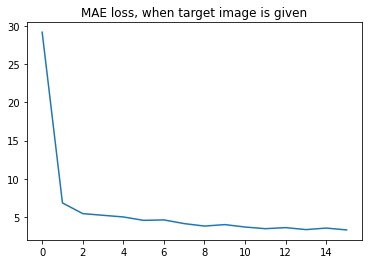

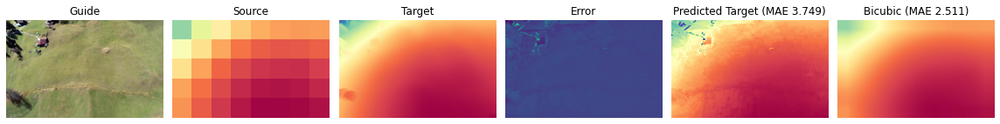

MSE: 82.131  ---  MAE: 3.749  ---  PBP: 0.727



####### image 5/25 - image idx 4 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1629.718    548.05444  490.1873   390.8149   308.61688  288.55832
  227.792    217.65161  228.15591  216.59818  231.27327  251.91704
  232.5442   209.32632  172.88177  182.83028]
----------MAE----------
(16,)
[26.562489  12.467238   9.78214    9.299601   7.9445806  7.6396885
  7.174069   6.823352   6.9210424  6.5344763  6.517999   6.4237866
  6.276837   5.967539   5.6696973  5.7966514]


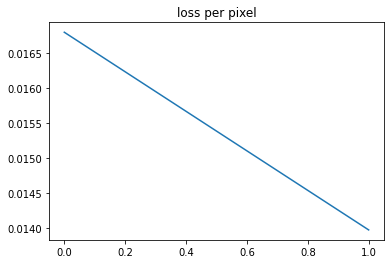

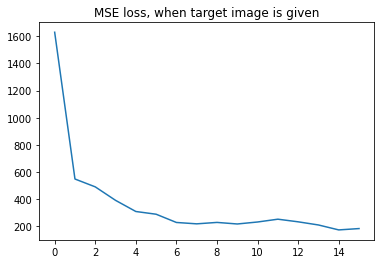

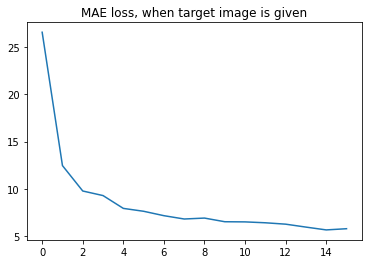

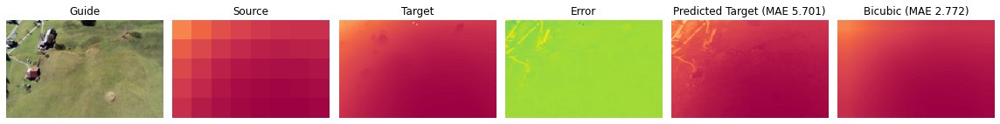

MSE: 190.049  ---  MAE: 5.701  ---  PBP: 0.736



####### image 6/25 - image idx 5 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1740.547     249.78757   141.29951   151.02043   114.161064   99.661995
   94.47908    85.59773    87.22797    77.122086   76.00607    72.33441
   70.32422    66.79637    61.38535    60.526417]
----------MAE----------
(16,)
[28.740723   8.105848   6.2910247  6.786607   5.6187353  5.035656
  4.614632   4.2812905  4.459589   3.963602   3.9230433  3.9878998
  3.7106733  3.434674   3.2952857  3.334465 ]


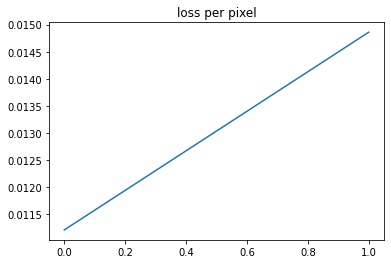

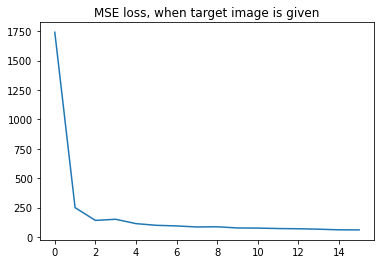

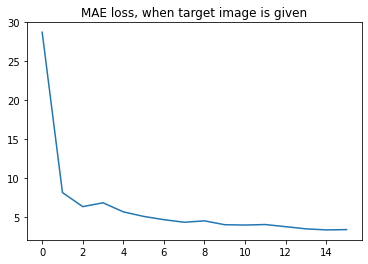

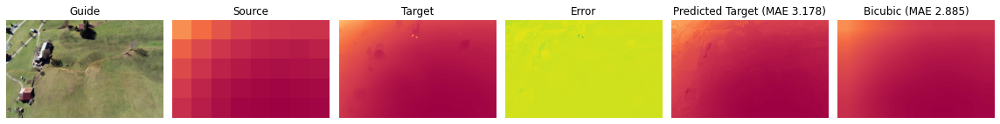

MSE: 57.299  ---  MAE: 3.178  ---  PBP: 0.701



####### image 7/25 - image idx 6 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1768.9628    233.48042   166.80156   147.44678   130.30016   117.83637
  143.37514   122.19086   116.83597   123.706154  111.60978   111.10842
  127.9846    108.33222   115.44746   112.80911 ]
----------MAE----------
(16,)
[30.062378   9.527191   7.6873426  6.9079294  6.9863653  6.142674
  6.576011   6.3497276  6.037579   6.3759537  5.8973475  5.926812
  6.083522   5.768053   5.9026995  5.774076 ]


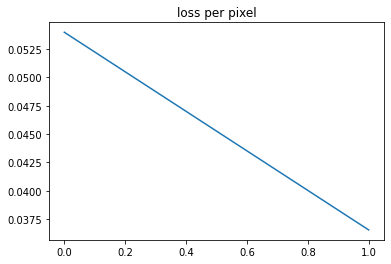

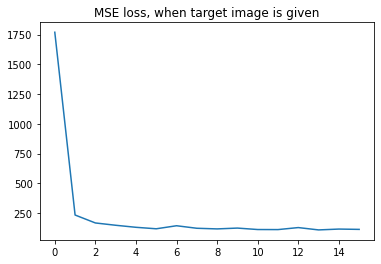

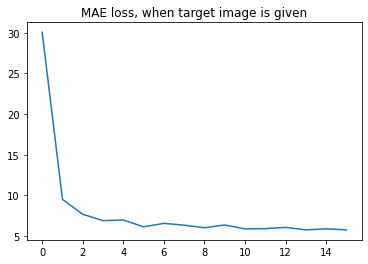

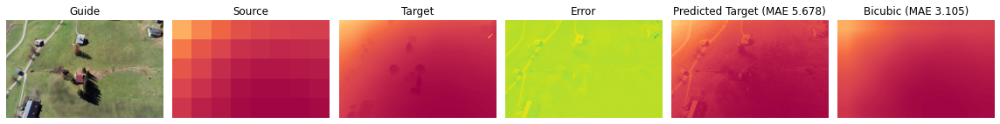

MSE: 109.328  ---  MAE: 5.678  ---  PBP: 0.820



####### image 8/25 - image idx 7 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1376.7489    128.13585    96.81792    81.54264    77.352295   84.36905
   74.59053    74.6689     66.07191    66.50257    65.22413    60.586975
   61.664608   59.959137   57.5673     55.349842]
----------MAE----------
(16,)
[29.662735   8.048408   6.9314446  6.148996   6.01303    5.9069834
  5.732934   5.6260147  5.3428807  5.361403   5.284568   5.2095203
  5.4644523  4.967003   4.8758717  4.7918344]


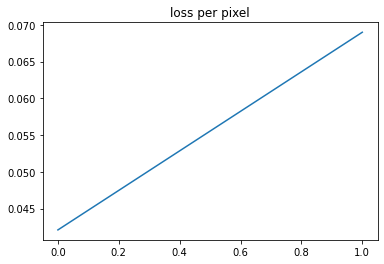

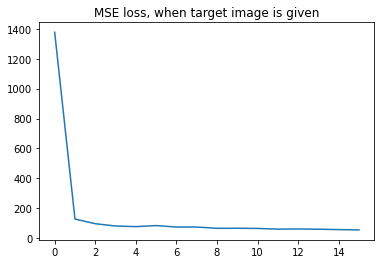

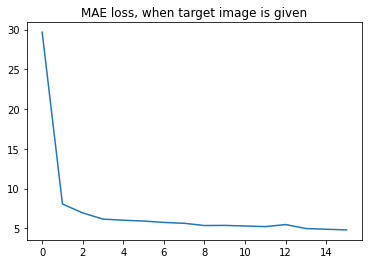

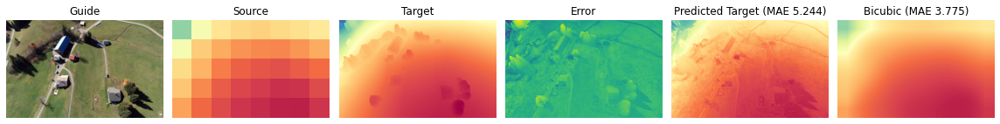

MSE: 56.738  ---  MAE: 5.244  ---  PBP: 0.869



####### image 9/25 - image idx 8 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1925.8428    100.59767    60.03325    56.495605   53.63439    46.224686
   37.35482    40.95105    36.74797    33.590855   34.274815   36.57412
   34.409676   28.239338   27.74242    28.81192 ]
----------MAE----------
(16,)
[30.379492   7.316272   5.3339815  5.235934   4.593942   4.329424
  4.007056   4.098472   4.0804224  3.7728271  3.7219827  3.8120873
  3.7055864  3.4379334  3.4030914  3.4669793]


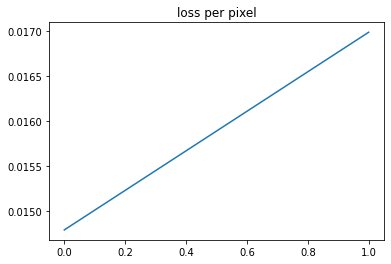

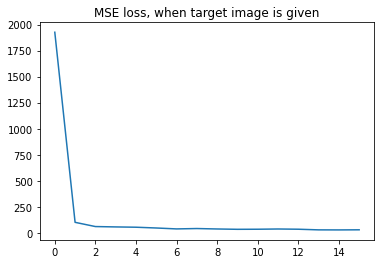

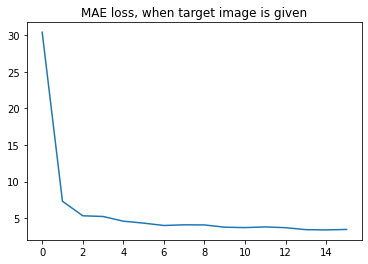

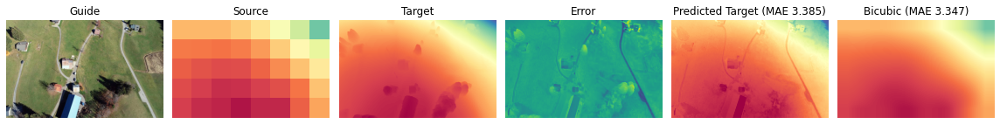

MSE: 29.329  ---  MAE: 3.385  ---  PBP: 0.716



####### image 10/25 - image idx 9 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1910.2811     50.926342   41.314873   39.511982   42.186127   34.108223
   33.969303   31.535067   30.67776    30.277958   31.167843   30.564028
   29.291403   28.59226    28.7398     27.811773]
----------MAE----------
(16,)
[32.509613   4.4354444  3.8714993  3.5512443  4.1526585  3.3423011
  3.2584028  2.931176   2.8679373  2.8641148  3.0825596  2.7709725
  2.7839391  2.709196   2.714816   2.5815961]


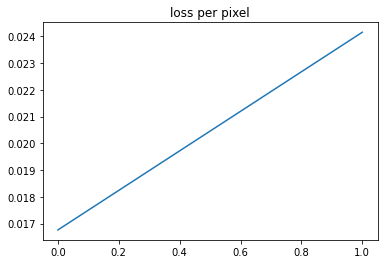

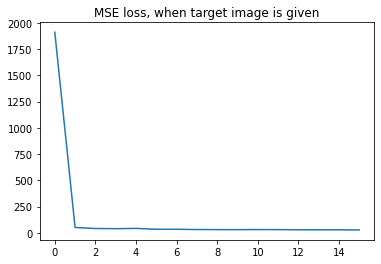

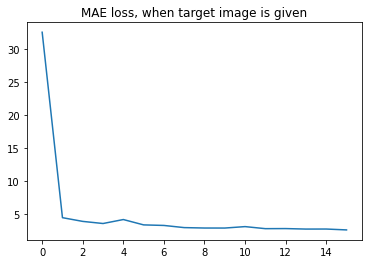

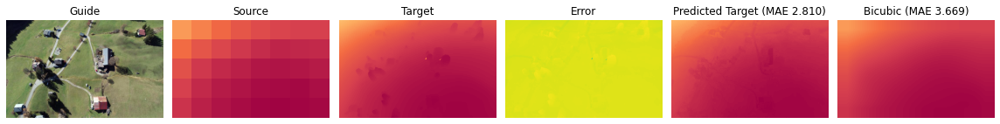

MSE: 29.992  ---  MAE: 2.810  ---  PBP: 0.725



####### image 11/25 - image idx 10 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2083.757     195.4766     74.427345   68.54252    63.51009    74.320076
   59.63661    60.44142    60.543587   60.033726   59.092854   60.980137
   58.35862    57.71977    61.410065   60.307133]
----------MAE----------
(16,)
[33.19286    7.9793196  4.109802   3.8039908  3.460845   4.1495767
  3.0401795  3.0293381  3.1677365  3.151412   2.9555712  3.148951
  2.7582016  2.7609584  3.1417403  3.0932012]


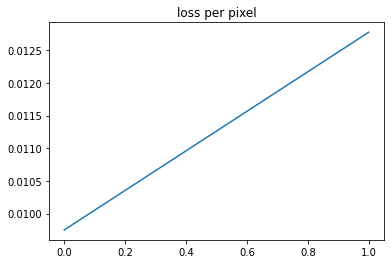

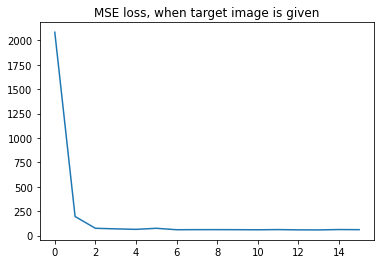

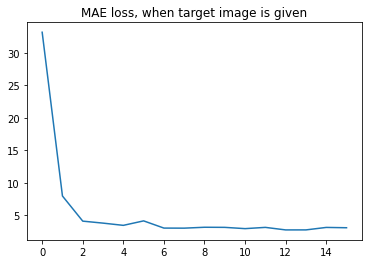

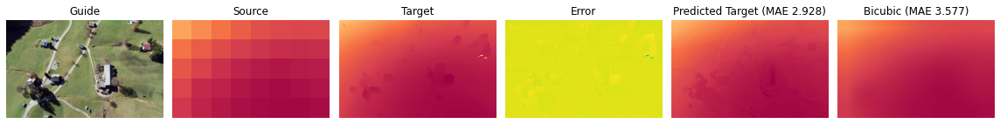

MSE: 58.542  ---  MAE: 2.928  ---  PBP: 0.742



####### image 12/25 - image idx 11 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1846.0619    105.45099    78.02251    81.06052    70.56392    67.198524
   68.754074   68.519035   63.36405    62.263855   68.08509    62.474796
   62.959534   61.7922     62.06741    62.88725 ]
----------MAE----------
(16,)
[34.351692   5.355201   4.3457637  4.3261976  3.9684677  3.553372
  3.707465   3.9855282  3.3414106  3.295712   3.7102172  3.2874203
  3.3535433  3.2880201  3.3062613  3.3028855]


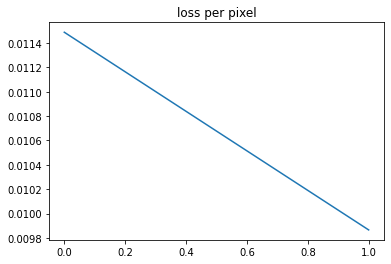

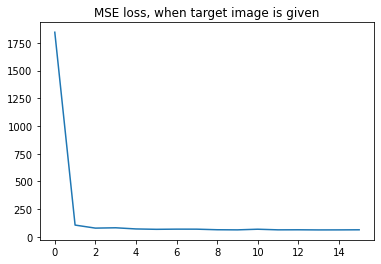

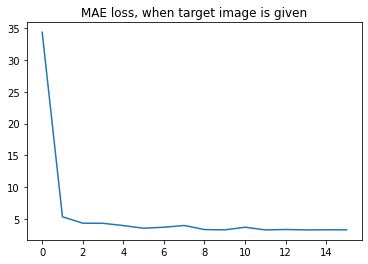

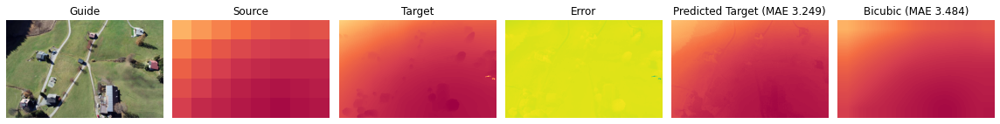

MSE: 60.984  ---  MAE: 3.249  ---  PBP: 0.733



####### image 13/25 - image idx 12 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[4548.684    704.8356   464.60464  352.48785  331.5725   328.94156
  291.44592  233.54759  282.89536  254.50084  240.08931  233.22786
  231.37462  218.04068  210.6755   215.46321]
----------MAE----------
(16,)
[46.54875   15.6036625 12.728603  11.272573  10.522671  11.120077
  9.731559   8.700057   9.632822   9.036537   8.427145   8.296474
  8.305035   8.054638   7.920798   7.8211756]


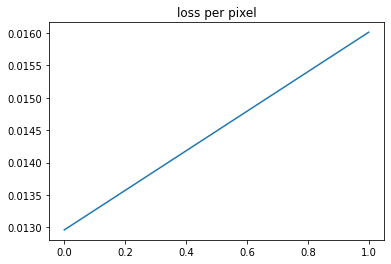

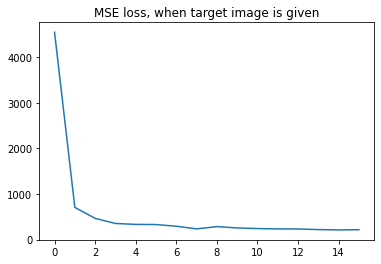

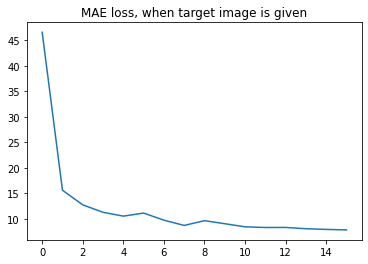

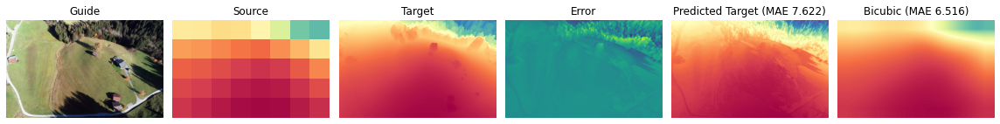

MSE: 200.247  ---  MAE: 7.622  ---  PBP: 0.811



####### image 14/25 - image idx 13 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3907.3455   442.3844   241.12717  227.463    212.55626  189.24918
  223.56215  198.59628  187.88687  188.853    179.42865  177.29074
  184.89961  203.77612  184.77261  180.52052]
----------MAE----------
(16,)
[49.00088   13.564347  10.056137   9.455614   9.315134   8.339598
  9.973585   8.324855   8.076397   8.142682   7.888275   8.075726
  7.899039   8.328933   7.6891108  7.774089 ]


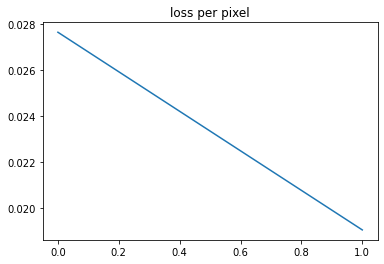

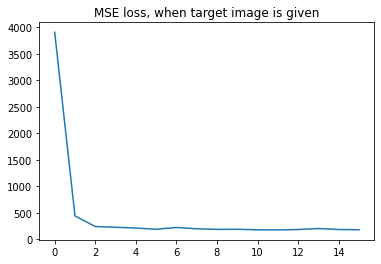

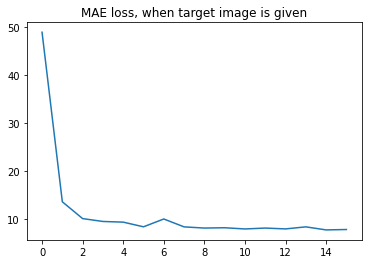

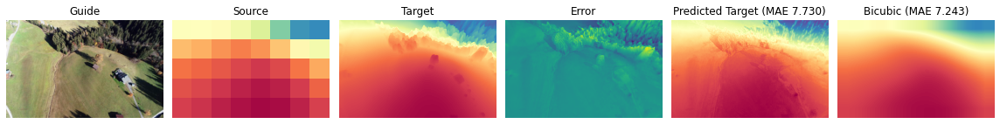

MSE: 170.202  ---  MAE: 7.730  ---  PBP: 0.842



####### image 15/25 - image idx 14 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[4722.9233   251.92169  228.24277  183.18141  176.00229  189.8505
  186.3594   182.4339   165.64972  161.29909  163.75063  151.03003
  150.10588  163.5202   149.29434  148.2873 ]
----------MAE----------
(16,)
[52.150513  11.171046  10.810932   9.171507   8.886825   9.5160675
  9.218677   9.034837   8.977504   8.672937   8.796959   8.2307825
  8.139849   8.694142   8.275096   8.3319645]


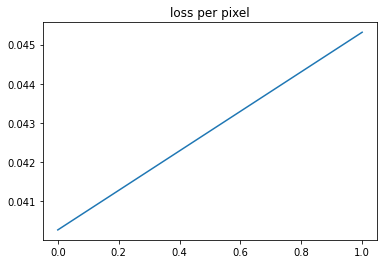

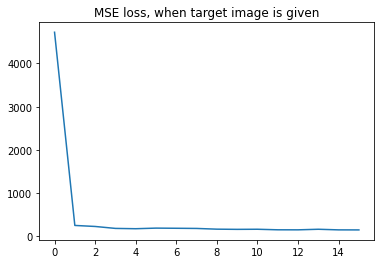

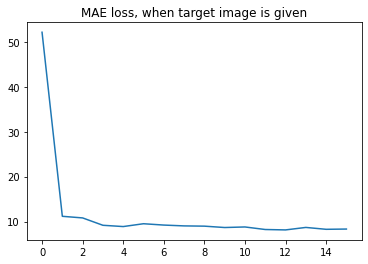

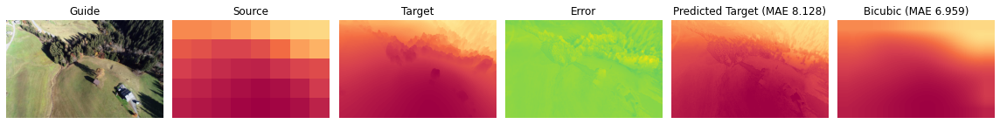

MSE: 150.024  ---  MAE: 8.128  ---  PBP: 0.886



####### image 16/25 - image idx 15 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1027.6455    126.80258    65.89857    46.78988    42.854877   42.92135
   37.03571    39.360367   36.166325   37.000137   29.899982   31.455008
   29.270655   27.635199   26.845802   26.861967]
----------MAE----------
(16,)
[23.713392   7.991624   5.4583097  4.611751   4.3695617  4.4470396
  4.17652    4.609091   4.16016    4.186334   3.6699913  3.6653636
  3.6282656  3.481796   3.3916907  3.4765697]


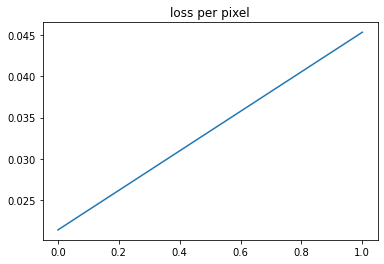

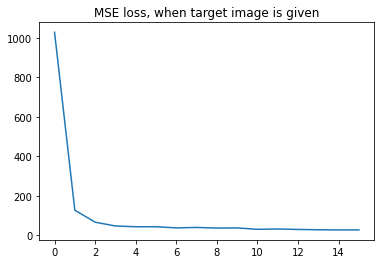

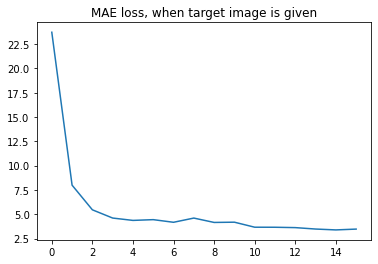

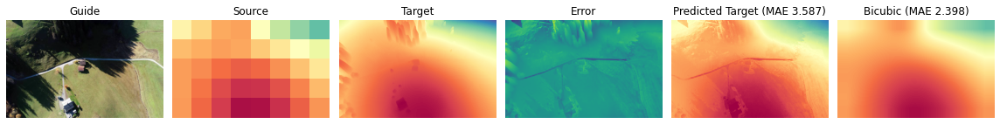

MSE: 27.345  ---  MAE: 3.587  ---  PBP: 0.793



####### image 17/25 - image idx 16 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1111.2888    120.42983    82.299385   75.08031    72.93607    64.26762
   65.92111    62.662964   63.55081    63.516872   62.451385   65.80779
   62.42209    62.398445   60.743076   62.292377]
----------MAE----------
(16,)
[22.322557   7.846251   5.7483616  5.2198853  5.0780396  4.6713676
  4.6493545  4.4690595  4.4053283  4.39127    4.3871226  4.6540084
  4.4085035  4.514896   4.304797   4.3893304]


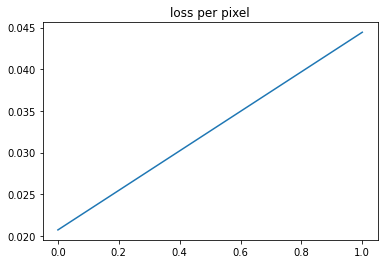

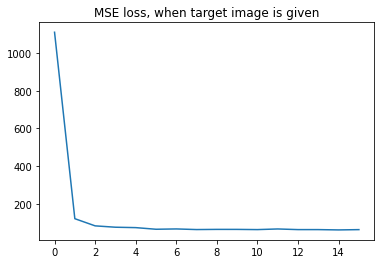

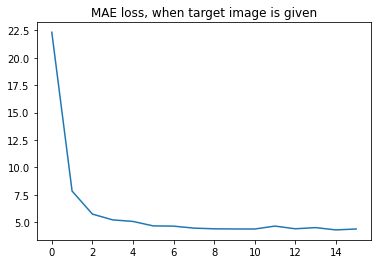

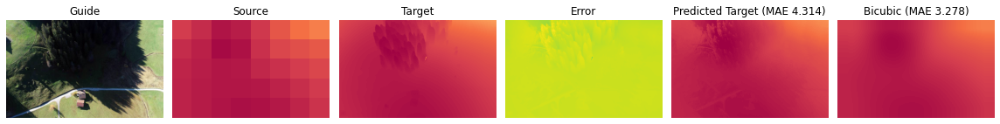

MSE: 61.306  ---  MAE: 4.314  ---  PBP: 0.742



####### image 18/25 - image idx 17 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2077.2812   325.45718  209.02899  116.48589   89.73907  108.24213
   84.44213   83.15507   73.78219   77.26765   73.7874    67.92317
   66.8554    71.32018   74.70185   62.76896]
----------MAE----------
(16,)
[35.628483  14.11593   11.402344   8.244785   7.0814214  7.95871
  6.851102   6.762173   6.3671284  6.4029574  6.58169    6.0332265
  5.9711547  6.192309   6.349194   5.800427 ]


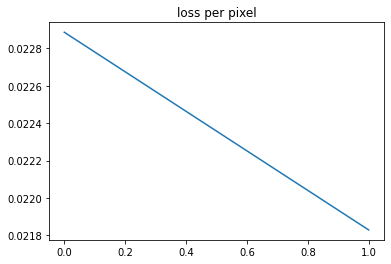

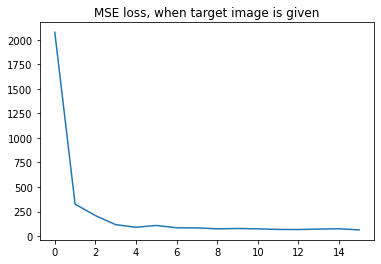

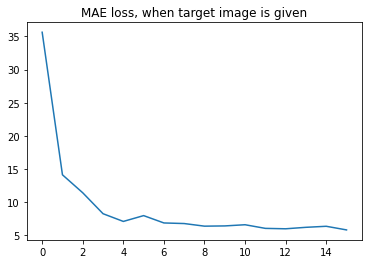

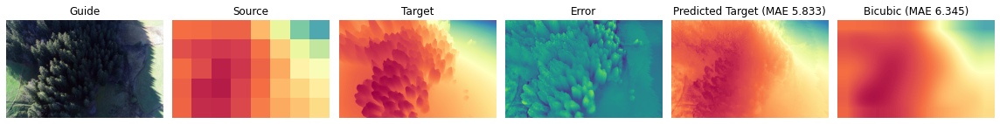

MSE: 61.968  ---  MAE: 5.833  ---  PBP: 0.845



####### image 19/25 - image idx 18 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3394.4138    323.36417   206.4863    174.14206   156.16504   154.72115
  142.9276    152.41411   133.85353   137.00273   135.41533   132.89671
  132.78827   129.41864   131.01648   124.335236]
----------MAE----------
(16,)
[40.054108  14.285605  11.03448    9.4196205  9.033127   8.904015
  8.610478   8.790032   8.355295   8.2607565  8.226653   8.132512
  8.504511   8.142303   8.091298   7.922635 ]


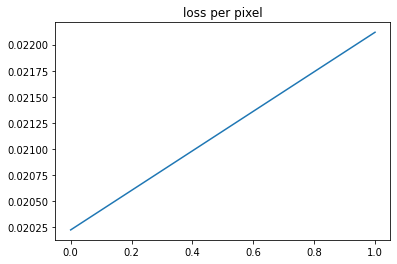

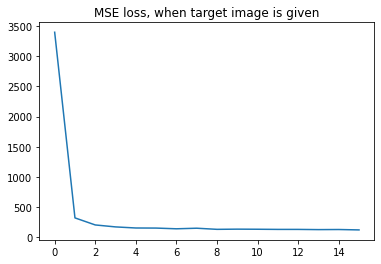

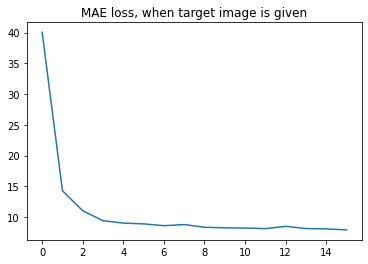

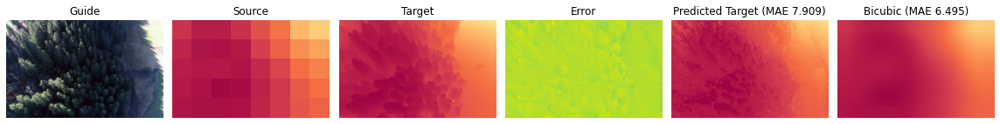

MSE: 124.439  ---  MAE: 7.909  ---  PBP: 0.905



####### image 20/25 - image idx 19 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[7034.8438   463.69403  328.50262  257.6478   247.55193  205.98131
  185.48576  186.63176  184.5265   164.57053  159.35931  163.62111
  169.9996   175.98389  164.56407  159.41173]
----------MAE----------
(16,)
[65.96076   15.5489235 13.176116  11.314457  11.24833   10.429763
  9.410404   9.557903   9.356023   8.625396   8.540324   8.469796
  8.7859535  8.672448   8.822742   8.428715 ]


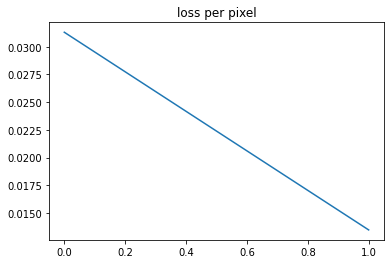

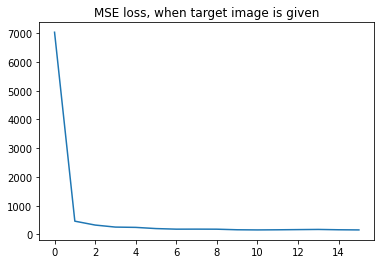

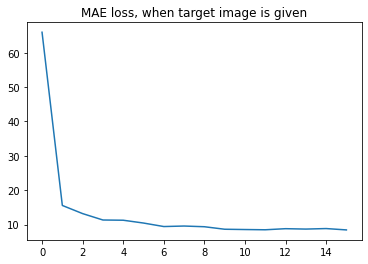

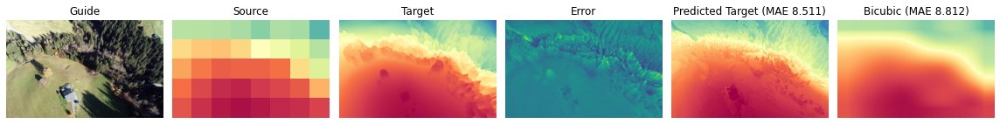

MSE: 158.141  ---  MAE: 8.511  ---  PBP: 0.887



####### image 21/25 - image idx 20 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[745.1622    68.30004   54.15662   51.5476    45.84605   42.510468
  40.602024  42.76953   42.32818   44.62949   37.555687  40.23438
  36.80881   36.31147   35.474796  34.48552 ]
----------MAE----------
(16,)
[21.732592   5.686146   4.9308085  4.756307   4.457832   4.224488
  4.2110877  4.3293657  4.201106   4.727136   4.064236   4.147227
  3.8992748  3.9449372  3.7710814  3.7513237]


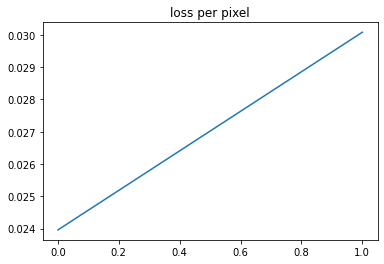

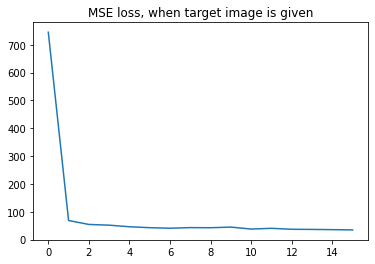

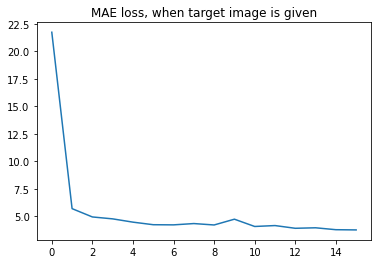

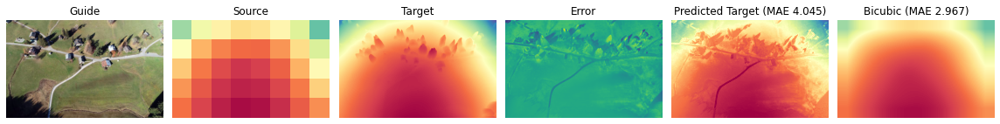

MSE: 39.657  ---  MAE: 4.045  ---  PBP: 0.755



####### image 22/25 - image idx 21 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[629.7284   110.8175    95.57964   76.86595   67.14112   63.015156
  61.782658  54.633896  62.22629   58.302864  53.14286   52.258766
  53.52679   53.321205  52.62265   50.30865 ]
----------MAE----------
(16,)
[20.443512   6.711994   6.153696   5.6945868  5.2903094  4.875988
  4.896196   4.6340294  4.823001   4.6919994  4.5528846  4.3775163
  4.517544   4.472069   4.5781145  4.4219556]


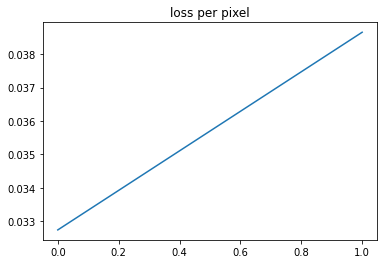

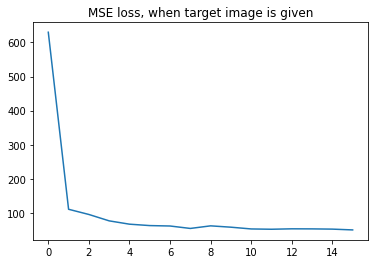

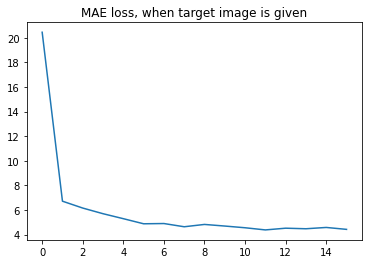

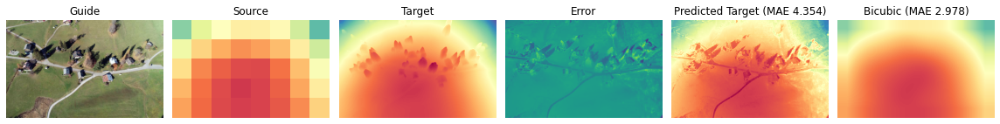

MSE: 50.317  ---  MAE: 4.354  ---  PBP: 0.743



####### image 23/25 - image idx 22 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[541.7348    64.294395  52.854755  54.93121   49.214813  43.717007
  49.142292  42.84627   38.75889   40.7121    37.432934  37.266357
  42.120197  36.37482   36.627716  35.165237]
----------MAE----------
(16,)
[18.4363     5.8493357  4.7606273  5.081423   4.6824536  4.400643
  4.762294   4.2059817  4.0351453  4.317248   3.967126   3.998467
  4.273855   4.0983124  3.9339314  3.9724646]


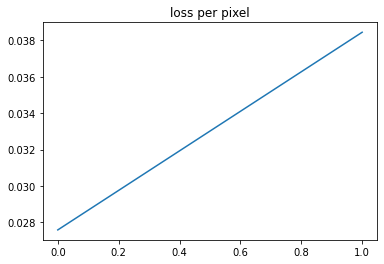

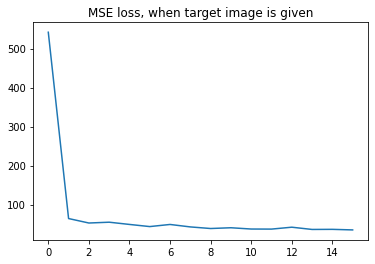

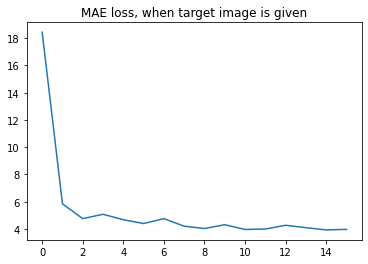

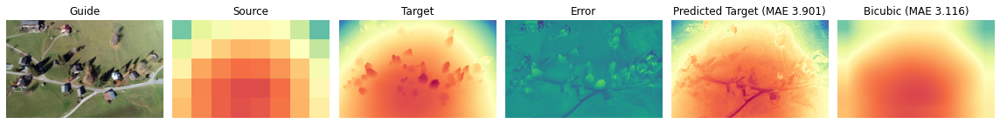

MSE: 33.375  ---  MAE: 3.901  ---  PBP: 0.783



####### image 24/25 - image idx 23 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[520.7384   187.96513   96.06688   93.66313   76.74612   72.846695
  71.9398    66.17282   67.270134  61.895077  61.39257   57.54807
  57.627247  60.501965  58.578754  57.918674]
----------MAE----------
(16,)
[18.116846   9.518286   6.8434124  6.8564277  6.1217785  5.9248734
  5.904564   5.695558   5.710992   5.409497   5.3681083  5.200538
  5.1877584  5.2968     5.233251   5.1907125]


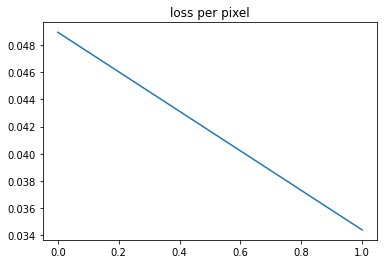

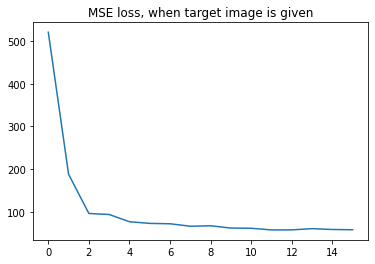

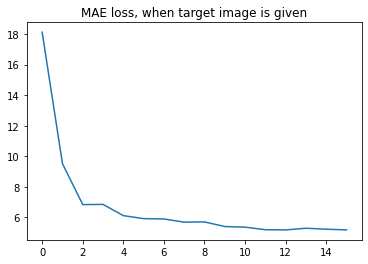

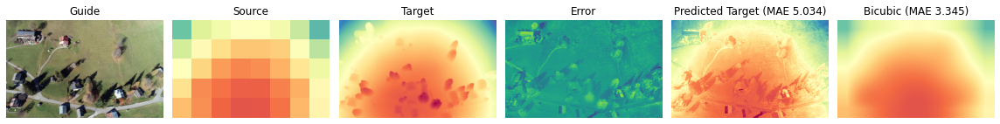

MSE: 53.953  ---  MAE: 5.034  ---  PBP: 0.802



####### image 25/25 - image idx 24 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[303.2602    61.901127  48.087406  46.315525  44.0253    45.403553
  48.56437   42.383366  44.86697   40.21386   39.42826   39.05944
  38.981754  40.094555  39.302868  37.846348]
----------MAE----------
(16,)
[13.498818   5.050123   4.212674   4.0828533  3.8437     3.9309237
  4.0496216  3.6765742  3.7506003  3.5744138  3.427755   3.415271
  3.4182     3.3993397  3.3717315  3.3727393]


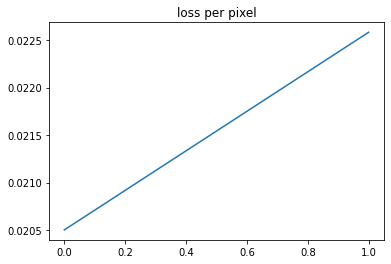

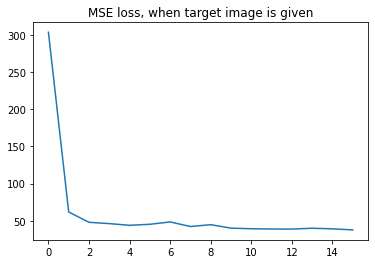

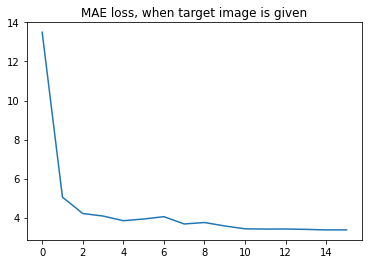

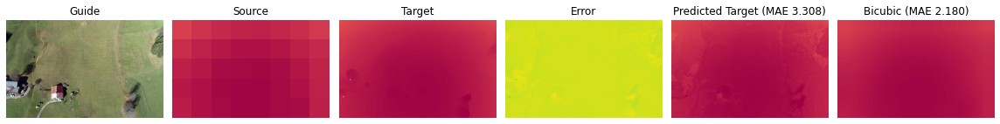

MSE: 38.439  ---  MAE: 3.308  ---  PBP: 0.709





In [13]:
####  define parameters  ########################################################
params = {'img_idxs' : [], # idx images to process, if empty then all of them
            
          'scaling': 90,
          'greyscale': False, # Turn image into grey-scale
          'channels': -1,
          
          'spatial_features_input': True,
          'weights_regularizer': [0.0001, 0.001, 0.0001], # spatial color head
          'loss': 'l1',
 
          'optim': 'adam',
          'lr': 0.001,
                  
          'batch_size': 32,
          'iteration': 1024*5*8//32,
                  
          'logstep': 64,
          
          'final_TGV' : False, # Total Generalized Variation in post-processing
          'align': False, # Move image around for evaluation in case guide image and target image are not perfectly aligned
          'delta_PBP': 1, # Delta for percentage of bad pixels 
         }

if len(params['img_idxs'])==0:
    idxs = np.array(range(0,new_target_imgs.shape[0]))
else:
    idxs = params['img_idxs']

constant = 50
    
for n_image,idx in enumerate(idxs):
    
    print("####### image {}/{} - image idx {} ########".format(n_image+1,len(idxs),idx))
    
    guide_img = new_guide_imgs[idx]
    target_img = new_target_imgs[idx]
    source_img = downsample(target_img,params['scaling'])
    save_path = directory+'/saved_model_comballaz_nadir/model'+str(constant + idx)+'.pt'
    # check if the directory exist
    os.makedirs(os.path.dirname(save_path),exist_ok=True)
    
    bicubic_target_img = bicubic(source_img=source_img, scaling_factor=params['scaling'])
    
    predicted_target_img = PixTransform(guide_img=guide_img,source_img=source_img,params=params,target_img=target_img, path = save_path)
    


    if params['final_TGV'] :
        print("applying TGV...")
        predicted_target_img = tvgen(predicted_target_img,[0.1, 0.1],[1, 2],[1, 1])
        
    if params['align'] :
        print("aligning...")
        target_img,predicted_target_img = align_images(target_img,predicted_target_img)

    f, ax = plot_result(guide_img,source_img,predicted_target_img,bicubic_target_img,target_img)
    plt.show()
    
    if target_img is not None:
        # compute metrics and plot results
        MSE = np.mean((predicted_target_img - target_img) ** 2)
        MAE = np.mean(np.abs(predicted_target_img - target_img))
        PBP = np.mean(np.abs(predicted_target_img - target_img) > params["delta_PBP"])

        print("MSE: {:.3f}  ---  MAE: {:.3f}  ---  PBP: {:.3f}".format(MSE,MAE,PBP))
        print("\n\n")
 

## comballaz Oblique

In [14]:
rgb_dir = directory+'/comballaz_oblique/rgb/'
_files = os.listdir(rgb_dir)
_files.sort()
_rgb_files = [rgb_dir + f for f in _files]
_rgb_files.sort()
print(len(_rgb_files))

dist_dir = directory+'/comballaz_oblique/dist/'
_files = os.listdir(dist_dir)
_files.sort()
_dist_files = [dist_dir + f for f in _files]
_dist_files.sort()
print(len(_dist_files))

25
25


In [15]:
guide_imgs = []
target_imgs= []

for num in range(len(_rgb_files)):
    rgb_img = imageio.imread(_rgb_files[num])
    guide_imgs.append(rgb_img)
    dist_img = torch.load(_dist_files[num])
    dist_img = dist_img.detach().cpu().numpy()
    target_imgs.append(dist_img)
        
guide_imgs = np.asarray(guide_imgs)
guide_imgs = np.einsum('ijkl->iljk', guide_imgs)        
target_imgs = np.asarray(target_imgs)

In [16]:
# for i in range(25):
#     f, axarr = plt.subplots(1, 2)
#     guide_img = np.rollaxis(guide_imgs[i], 0, 3)
#     axarr[0].imshow(guide_img)
#     axarr[1].imshow(target_imgs[i])




## Upsampling 40

In [17]:
torch.cuda.empty_cache()

####### image 1/25 - image idx 0 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1690.3115     41.733074   29.829742   27.65404    30.861406   26.589901
   27.638958   24.563654   28.088701   25.36725    26.030012   25.099983
   29.605492   29.048475   25.756659   27.233099]
----------MAE----------
(16,)
[22.653254   3.9897     3.2784295  2.7325861  2.928393   2.6714616
  2.9517426  2.51534    2.7936454  2.4825735  2.484313   2.5453544
  2.5675297  2.4822874  2.438455   2.7985365]


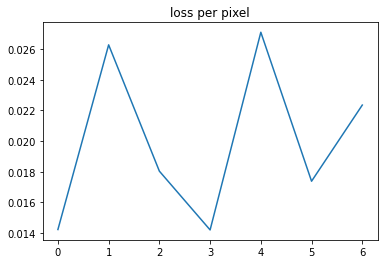

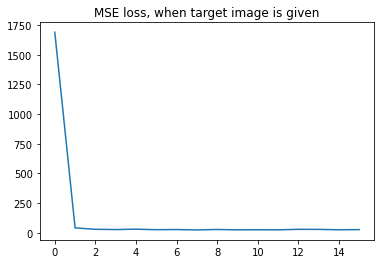

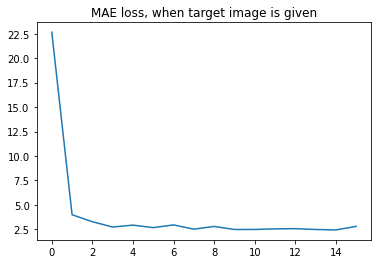

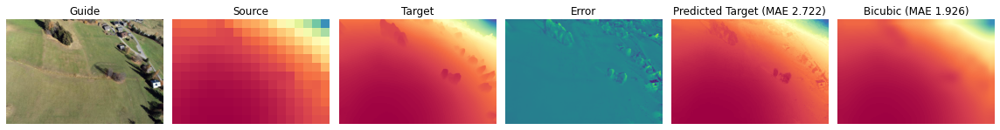

MSE: 25.773  ---  MAE: 2.722  ---  PBP: 0.668



####### image 2/25 - image idx 1 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3061.8547     86.25864    63.625546   75.02839    64.070656   61.389057
   55.760788   55.609932   60.71258    60.23868    61.621735   61.037327
   60.492626   57.86277    59.41067    60.120247]
----------MAE----------
(16,)
[30.195005   5.036867   4.702565   4.6558967  4.212677   3.8720558
  3.59602    3.606383   3.9491074  3.6553733  3.8870957  3.646767
  3.803044   3.5900702  3.623917   3.644588 ]


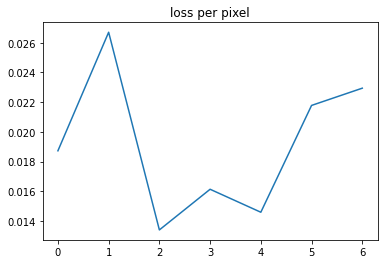

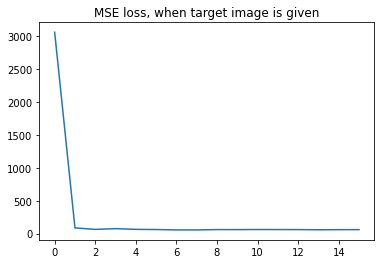

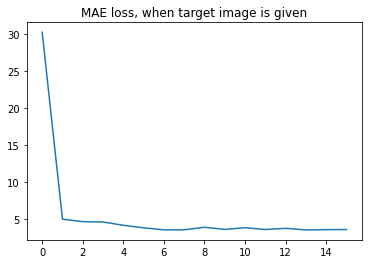

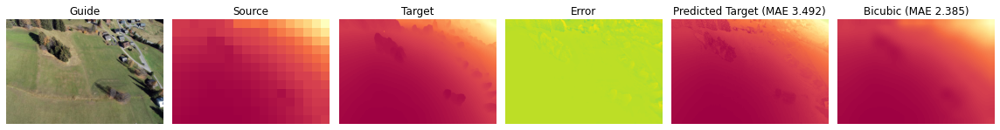

MSE: 58.293  ---  MAE: 3.492  ---  PBP: 0.451



####### image 3/25 - image idx 2 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3030.4053     99.098564   95.975426  102.81975    85.72067    91.6059
   77.695305   78.317184   92.72599    72.11478    74.05321    74.21103
   75.88489    73.82577    71.26919    70.99316 ]
----------MAE----------
(16,)
[40.277657   6.376438   5.647446   6.1667504  5.236107   5.2462115
  4.7612467  4.9208274  5.317102   4.791347   4.5347333  4.6532235
  5.2155333  4.608498   4.326448   4.341847 ]


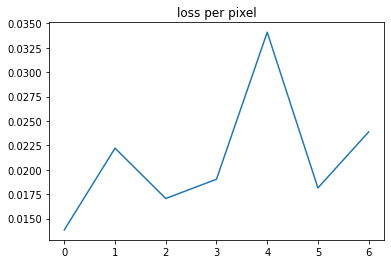

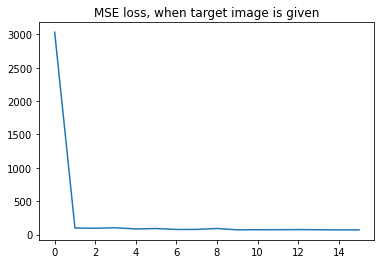

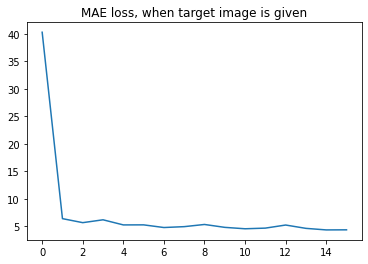

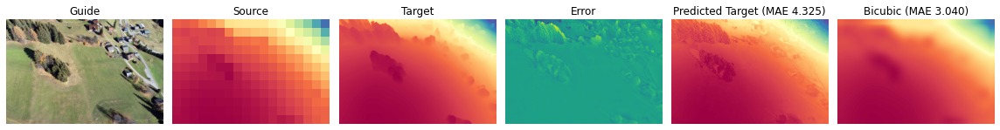

MSE: 68.750  ---  MAE: 4.325  ---  PBP: 0.576



####### image 4/25 - image idx 3 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[4662.2314     83.488335   65.91086    60.083946   60.943535   57.094757
   52.138786   62.366673   49.38374    47.653217   45.031273   41.5253
   43.251522   43.508606   40.655994   40.669388]
----------MAE----------
(16,)
[50.873287   5.9756236  5.0164676  5.2889524  4.946688   4.832597
  4.5674715  5.4759994  4.3553467  4.6424704  4.315715   3.925291
  4.0492134  4.0869627  4.03229    3.9704037]


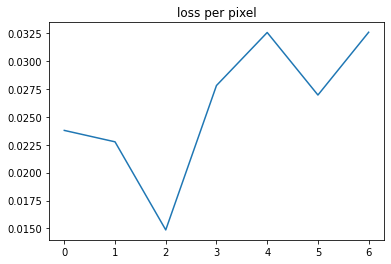

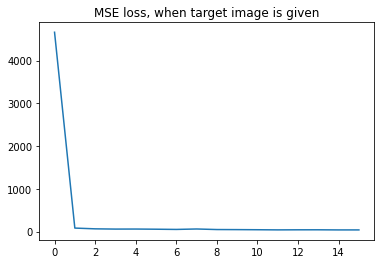

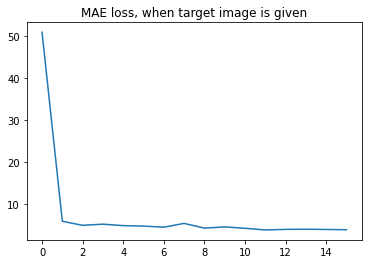

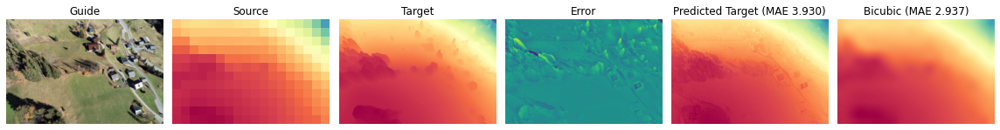

MSE: 42.235  ---  MAE: 3.930  ---  PBP: 0.675



####### image 5/25 - image idx 4 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[876.04553    12.273571    7.3005543   6.7781243   6.2529397   5.8007407
   5.010482    4.506062    4.3667397   4.088252    5.041156    4.454871
   5.282501    4.391502    3.7391095   4.070382 ]
----------MAE----------
(16,)
[21.135857   2.11859    1.6764473  1.9152766  1.5094434  1.5206536
  1.3340116  1.2717702  1.1630867  1.2079568  1.3433332  1.2154797
  1.4721513  1.1665275  1.0775121  1.2140962]


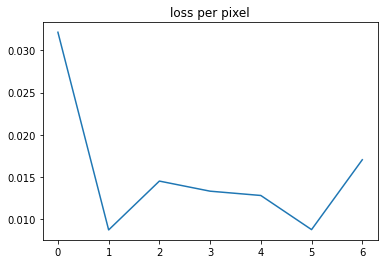

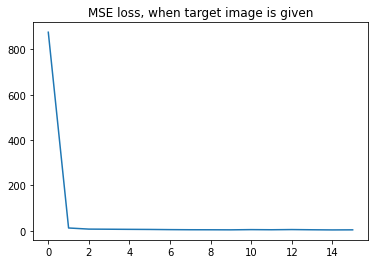

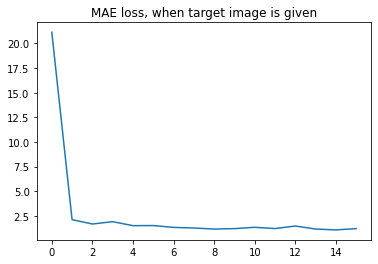

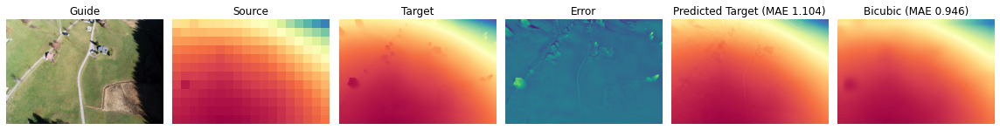

MSE: 3.801  ---  MAE: 1.104  ---  PBP: 0.340



####### image 6/25 - image idx 5 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1879.9177      19.61737     13.396099     9.91075      9.304925
    9.304141     9.608349     8.502685     7.8187776    7.9124756
    8.694808     7.679142     7.1839786    6.727899     6.611797
    6.9896173]
----------MAE----------
(16,)
[29.397974   2.7659204  2.2644956  1.8007183  1.7659975  1.7646111
  1.7912225  1.7136469  1.4555907  1.5382965  1.6481786  1.5247638
  1.4587396  1.3550283  1.3629042  1.4492881]


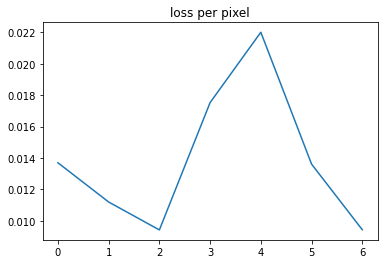

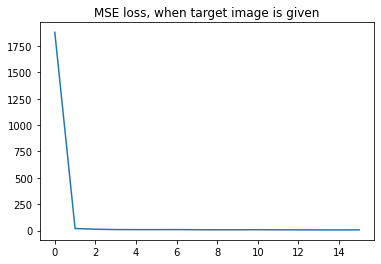

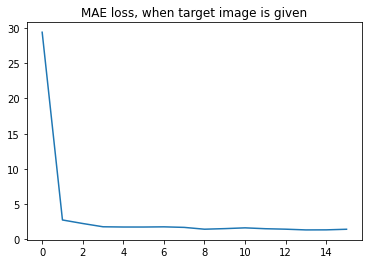

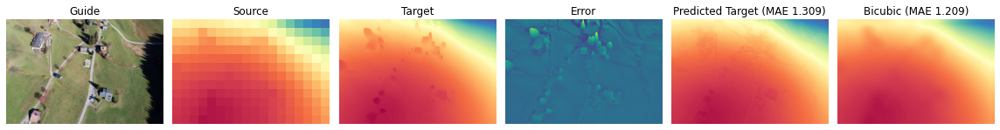

MSE: 6.508  ---  MAE: 1.309  ---  PBP: 0.339



####### image 7/25 - image idx 6 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1501.4626     27.063187   15.892852   19.042145   13.25603    12.460107
   12.72363    13.74486    11.907336   12.012514   11.874949   11.554814
   12.103023   11.686396   11.319654   12.631363]
----------MAE----------
(16,)
[27.60862    3.6216261  2.132206   2.6050525  1.8365471  1.7322658
  1.6997819  2.080816   1.6821405  1.6255891  1.5863876  1.5798776
  1.659673   1.627523   1.53381    1.8185048]


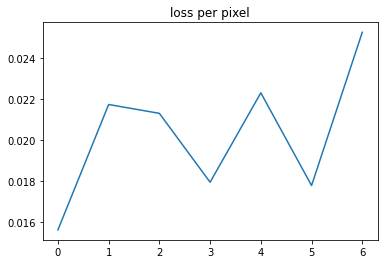

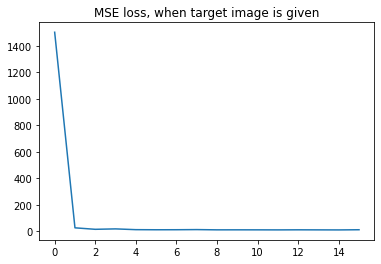

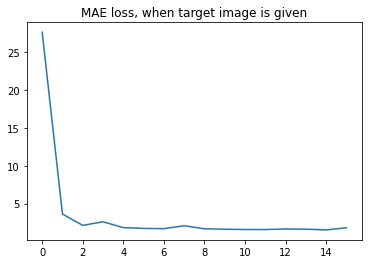

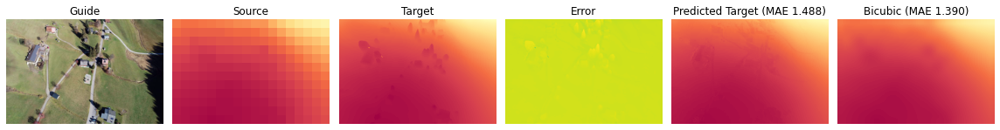

MSE: 11.486  ---  MAE: 1.488  ---  PBP: 0.366



####### image 8/25 - image idx 7 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2397.7087     94.52624    66.55647    47.122982   50.61656    48.5003
   42.728104   48.1341     40.81058    41.251766   45.122368   44.29554
   42.44768    42.900787   41.41481    40.479404]
----------MAE----------
(16,)
[32.969463   4.5848436  4.7039332  3.3684187  2.9702568  3.3226397
  3.1429756  3.5931525  2.9312816  3.2384994  2.940035   3.3336544
  2.8320394  2.8801222  2.7944145  2.9816153]


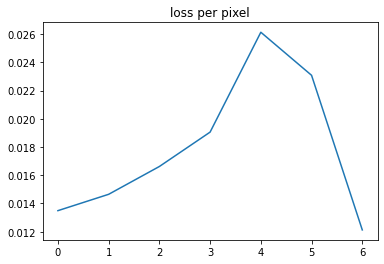

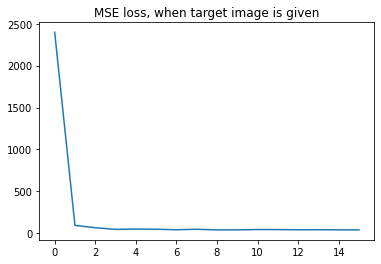

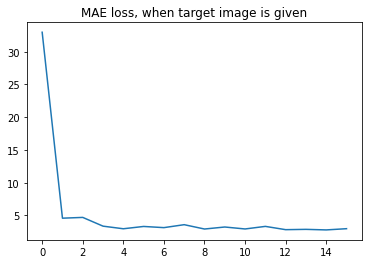

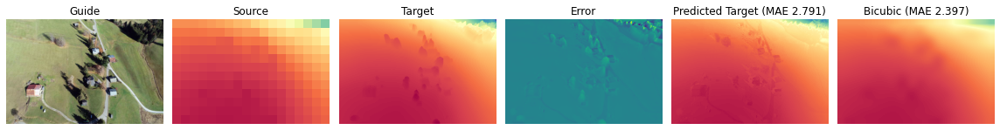

MSE: 41.221  ---  MAE: 2.791  ---  PBP: 0.477



####### image 9/25 - image idx 8 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2999.7942     57.280083   52.737835   46.56059    44.994022   50.278645
   40.12586    37.81925    39.720253   35.982697   43.39782    42.67419
   36.399513   35.131138   33.745274   37.883835]
----------MAE----------
(16,)
[33.181236   4.266535   4.463187   3.6423762  3.2671256  4.2018747
  3.2220707  3.2373717  3.456657   3.1111834  3.5158575  3.466715
  3.0964959  3.3303773  2.8661847  3.2679036]


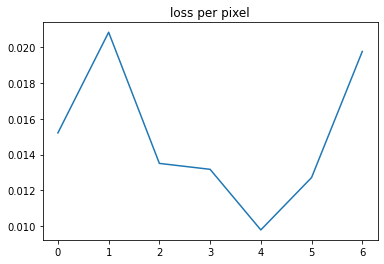

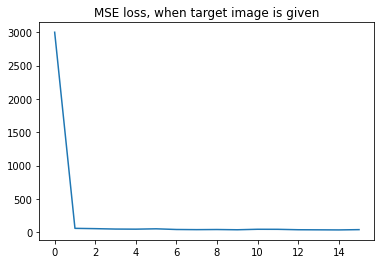

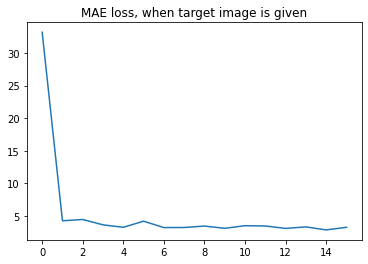

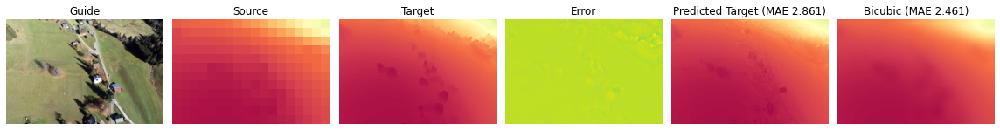

MSE: 32.950  ---  MAE: 2.861  ---  PBP: 0.506



####### image 10/25 - image idx 9 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[4015.7349     47.356873   42.71822    40.868683   45.677048   44.20051
   40.022923   39.759933   44.169518   42.837196   44.33736    41.012455
   42.18517    40.275944   39.42314    41.045574]
----------MAE----------
(16,)
[37.94225    3.9234037  3.9744687  3.5741832  3.7069445  4.135118
  3.4448485  3.4916613  3.6354394  3.688099   3.6937797  3.6668417
  3.5475388  3.4289038  3.449328   3.354111 ]


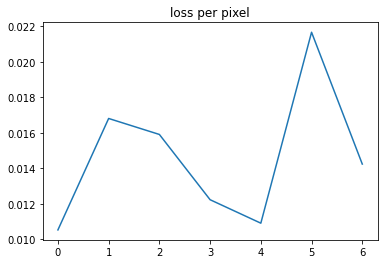

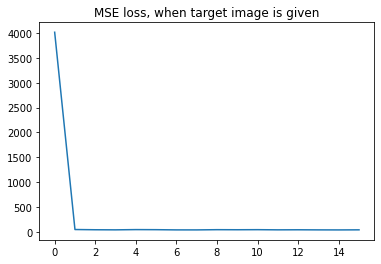

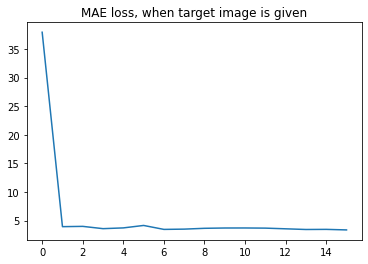

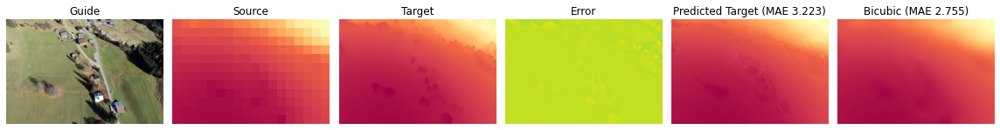

MSE: 39.560  ---  MAE: 3.223  ---  PBP: 0.512



####### image 11/25 - image idx 10 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[4408.319      60.06913    52.439293   47.71478    58.29909    43.429268
   39.84551    56.22718    47.32937    37.34892    38.986904   46.81459
   43.02627    37.606827   35.54614    47.024727]
----------MAE----------
(16,)
[44.364      4.819227   4.7073812  4.310441   5.0805874  3.8142183
  3.689556   5.1898255  4.0708604  3.457132   3.551373   4.3778086
  3.928262   3.8471227  3.3731742  4.1174245]


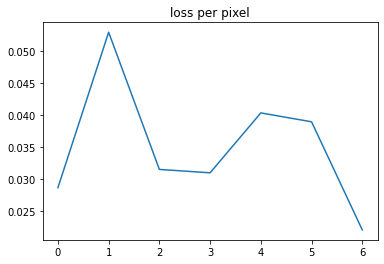

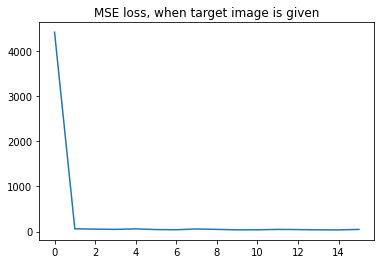

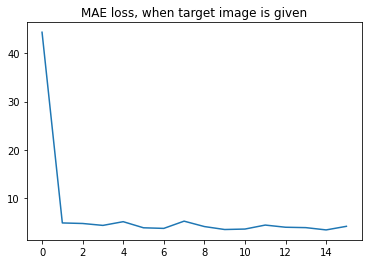

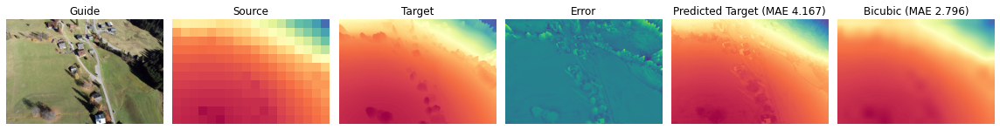

MSE: 40.228  ---  MAE: 4.167  ---  PBP: 0.856



####### image 12/25 - image idx 11 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2933.782      40.241245   53.305786   51.079914   40.592487   50.3464
   40.378086   34.73589    47.03816    36.3053     37.680305   42.601257
   34.486427   36.37199    35.155334   37.23147 ]
----------MAE----------
(16,)
[38.75611    3.9117968  4.92454    4.4530134  3.8796196  4.59296
  3.6978052  3.4729493  4.7917323  3.717039   3.581654   4.1390285
  3.499001   3.648781   3.3590434  3.4954927]


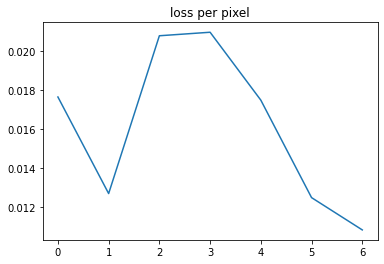

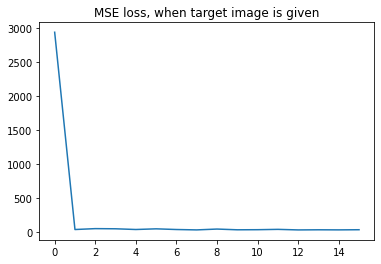

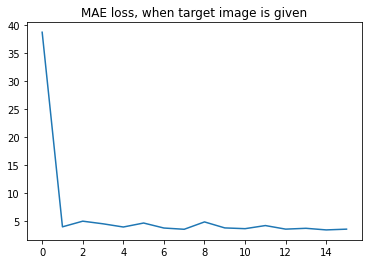

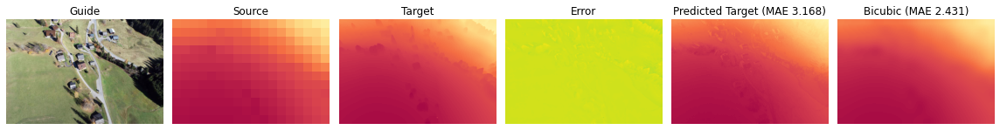

MSE: 32.234  ---  MAE: 3.168  ---  PBP: 0.573



####### image 13/25 - image idx 12 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3527.3774     43.076637   39.91898    31.966019   31.432709   30.631872
   32.735565   33.021515   28.120373   30.525833   27.742214   29.64457
   27.247114   27.920364   26.793905   34.495766]
----------MAE----------
(16,)
[40.276463   4.2135954  4.2190003  3.5201848  3.453465   3.518438
  3.8038368  3.465325   3.1438575  3.629982   3.1787748  3.2880957
  3.3079035  3.1688724  3.099385   3.8905556]


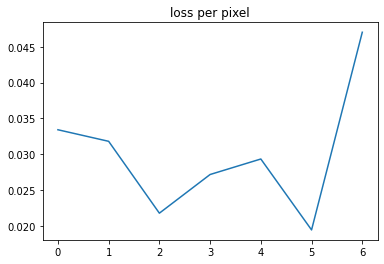

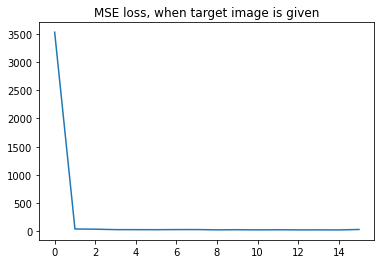

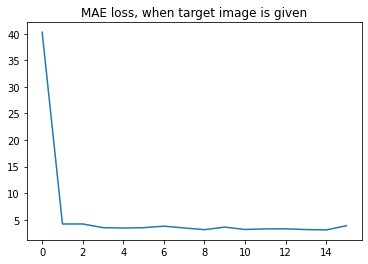

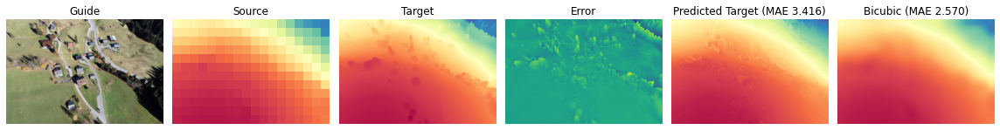

MSE: 28.872  ---  MAE: 3.416  ---  PBP: 0.695



####### image 14/25 - image idx 13 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[928.6736   150.59439   96.17177   78.5112    77.175896  74.17206
  66.203636  72.57164   77.19655   64.38101   66.856674  65.28341
  70.93206   63.885155  73.331314  60.202442]
----------MAE----------
(16,)
[18.132185   7.3683534  5.9273415  5.419074   5.252345   5.5052953
  4.887302   5.204464   5.0860777  4.707393   4.887475   4.666864
  4.9675546  4.586926   4.8558197  4.5060835]


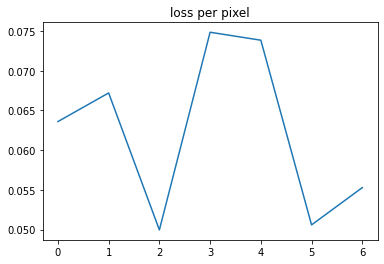

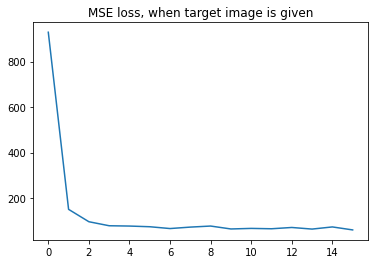

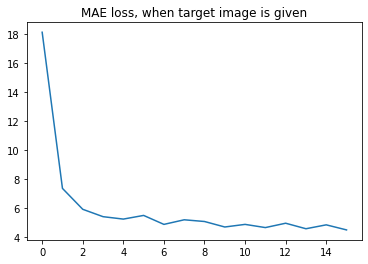

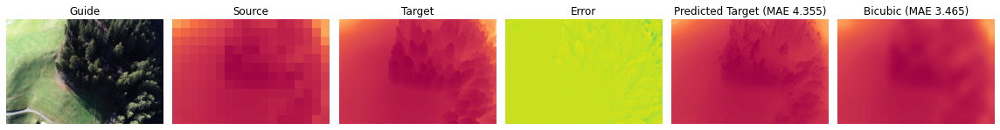

MSE: 63.894  ---  MAE: 4.355  ---  PBP: 0.677



####### image 15/25 - image idx 14 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2903.6147    182.19641   152.01466   134.98509   123.08359   111.78228
  122.43801   106.83083   101.22916   107.00399    99.623184  104.873955
   96.9961     99.040855   95.71527    96.86876 ]
----------MAE----------
(16,)
[34.612095   9.6681185  8.607732   8.151065   7.873258   7.351404
  7.6914973  6.999748   6.834406   6.9655757  6.629155   6.8332047
  6.5018954  6.6744385  6.407066   6.639706 ]


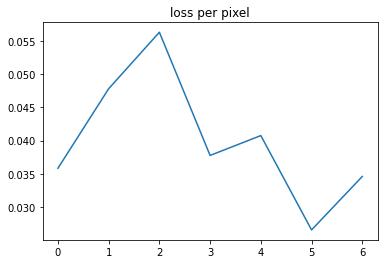

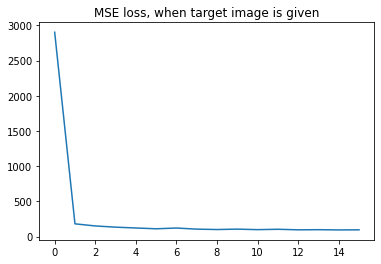

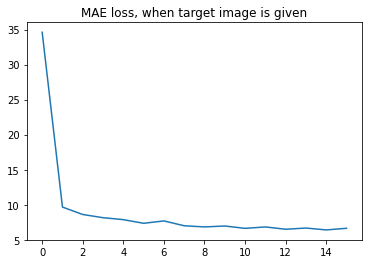

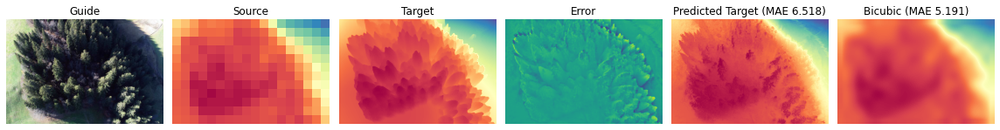

MSE: 95.637  ---  MAE: 6.518  ---  PBP: 0.850



####### image 16/25 - image idx 15 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2163.291      91.72817    98.46591    84.24597    79.900406   80.75521
   73.610275   73.7286     75.074875   75.69319    72.05104    74.25562
   76.01934    69.20149    71.26451    69.14778 ]
----------MAE----------
(16,)
[34.379814   6.968011   7.1605983  6.092268   5.89904    5.818622
  5.5873094  5.493436   5.563071   5.9460096  5.390303   5.6839223
  6.0416436  5.2305145  5.2433424  5.1976585]


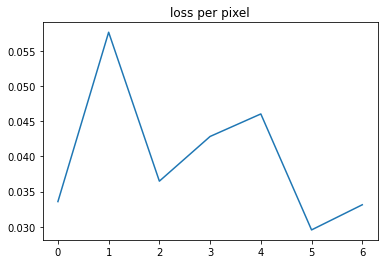

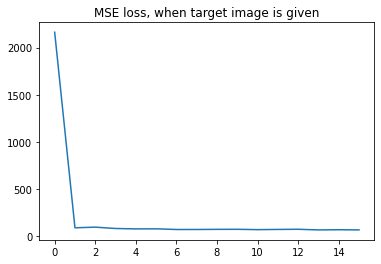

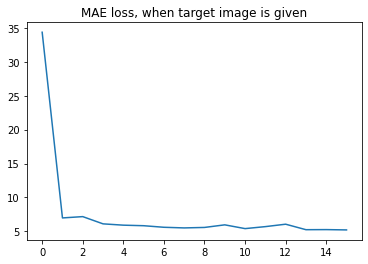

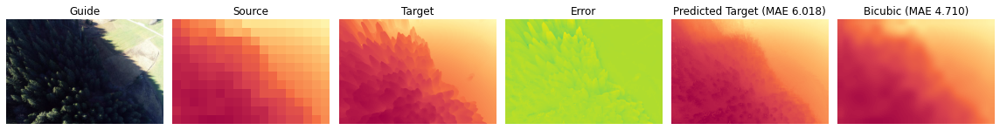

MSE: 80.272  ---  MAE: 6.018  ---  PBP: 0.896



####### image 17/25 - image idx 16 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[459.0077     20.981285   14.24907    12.611661   13.777627   14.977337
  12.08773    13.4295845  12.837964   12.816938   12.3616495  12.111788
  12.367815   12.171951   11.959595   12.188922 ]
----------MAE----------
(16,)
[15.233241   2.8420475  1.9179281  1.6974002  2.002574   2.1738892
  1.5844264  1.7617157  1.6536661  1.7789832  1.6349096  1.5439099
  1.6092743  1.5474975  1.5188205  1.5742568]


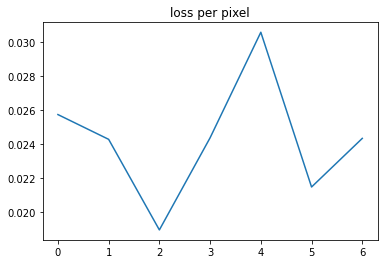

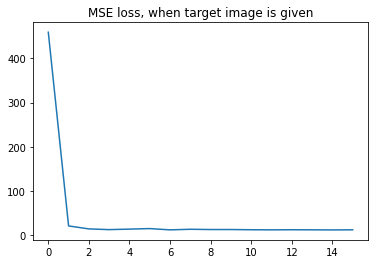

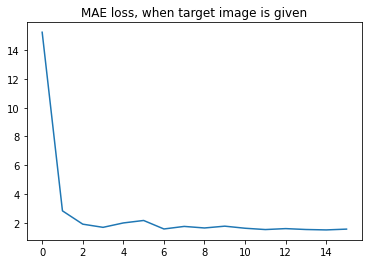

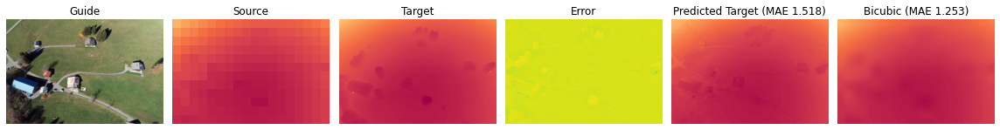

MSE: 12.213  ---  MAE: 1.518  ---  PBP: 0.375



####### image 18/25 - image idx 17 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[445.10834    11.378778    9.268031    7.673673    8.130954    8.303577
   6.7254953   6.73413     6.5189047   6.418481    6.772486    6.285667
   6.482565    6.2867904   6.2276635   6.8670716]
----------MAE----------
(16,)
[14.731812   2.0884485  1.8389535  1.5554612  1.5872586  1.8013543
  1.3844635  1.3399203  1.2852849  1.2547648  1.3718042  1.2029291
  1.1897177  1.1942097  1.1818051  1.3826501]


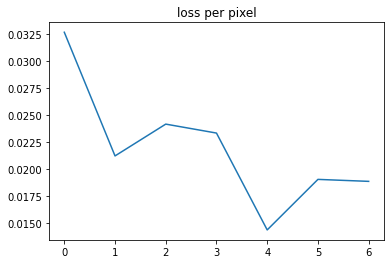

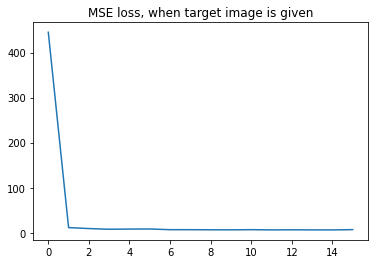

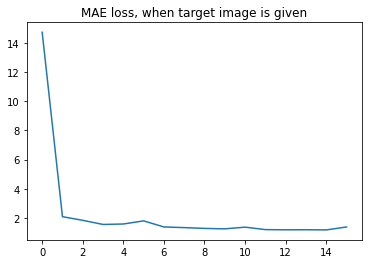

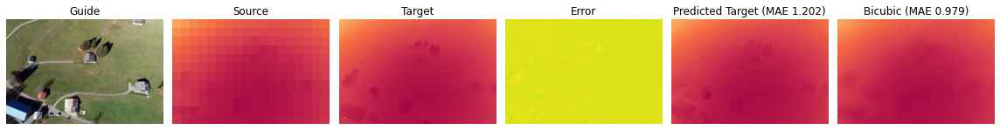

MSE: 6.274  ---  MAE: 1.202  ---  PBP: 0.328



####### image 19/25 - image idx 18 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[388.29904    12.269462    8.200891    7.463782    7.325384    7.309983
   6.65407     7.0837994   6.232846    6.0539527   5.8023863   6.0720587
   5.867888    5.6829247   5.6387186   5.719954 ]
----------MAE----------
(16,)
[14.10672    2.1634314  1.6101336  1.5465053  1.5056769  1.6098709
  1.4068197  1.4321485  1.3812569  1.3186512  1.2389491  1.3279628
  1.3167995  1.1962636  1.2109971  1.3076615]


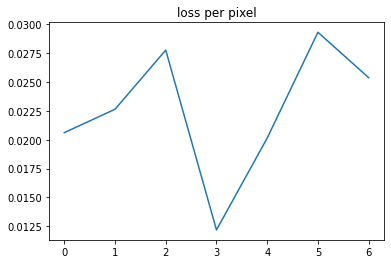

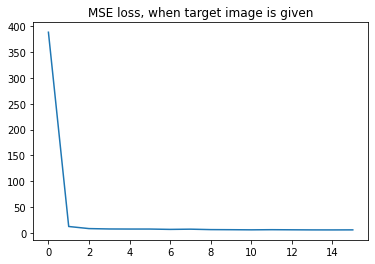

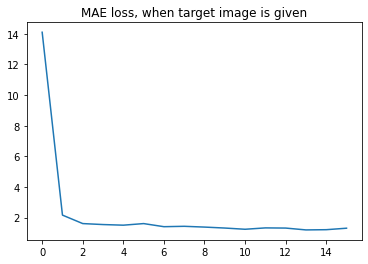

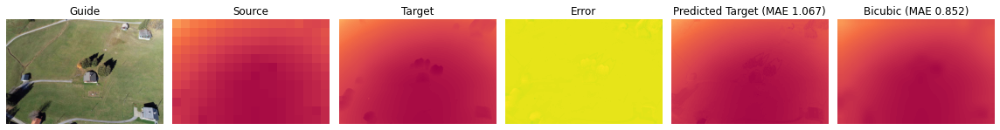

MSE: 5.125  ---  MAE: 1.067  ---  PBP: 0.237



####### image 20/25 - image idx 19 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[150.11588     5.031345    4.5164785   3.8146286   4.0574865   3.9441872
   3.7887826   3.7813528   3.9497845   4.9014845   3.8672981   3.6772664
   3.595596    3.8858857   3.613648    3.612152 ]
----------MAE----------
(16,)
[10.103059    1.3075731   1.2988211   1.0543784   1.1011716   1.0840219
  1.0828017   1.035516    1.0314583   1.255986    1.0456803   0.99126357
  0.9655132   1.0541204   1.0153966   0.99924463]


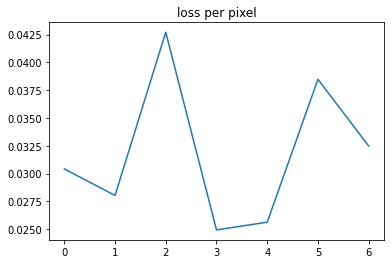

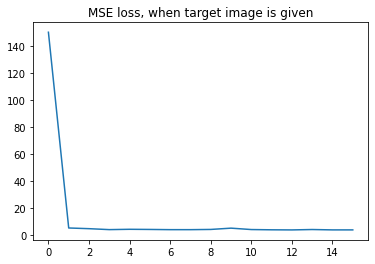

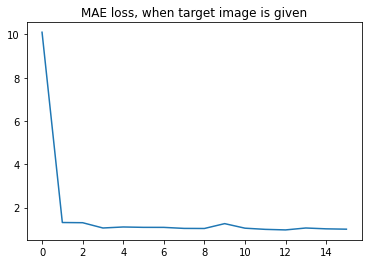

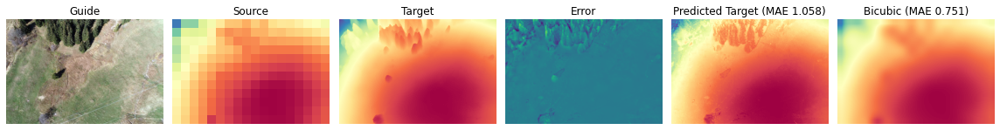

MSE: 3.737  ---  MAE: 1.058  ---  PBP: 0.249



####### image 21/25 - image idx 20 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[4129.1675    135.96321    75.39073    56.89263    46.381237   45.14674
   41.242912   38.910316   42.976326   37.592415   35.21471    31.80564
   33.891216   33.69825    33.758076   31.933817]
----------MAE----------
(16,)
[37.18704    5.8878264  4.5945225  3.7991624  3.351014   3.8095124
  3.4846528  3.0269217  3.5337124  2.7755647  3.0721586  2.6063516
  2.8233316  2.7992723  3.0612974  2.6143975]


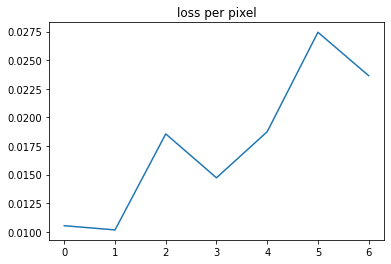

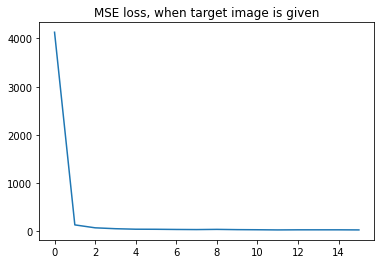

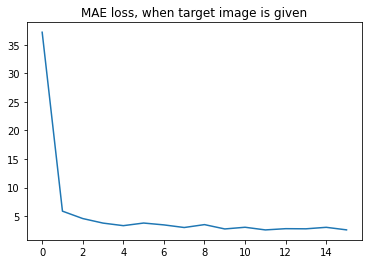

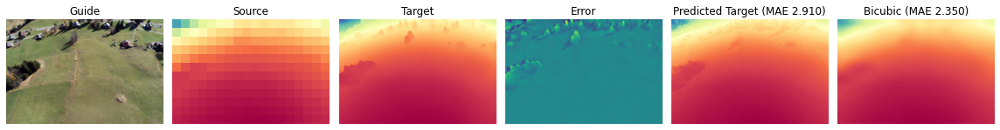

MSE: 35.133  ---  MAE: 2.910  ---  PBP: 0.616



####### image 22/25 - image idx 21 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[4375.8696     67.23748    45.895466   36.5565     38.004738   34.4628
   42.618916   32.71179    32.307247   38.955456   32.699165   43.14434
   31.356348   33.736935   30.452309   41.01624 ]
----------MAE----------
(16,)
[45.636047   4.757839   4.006277   3.1615274  3.4591727  2.8397708
  3.884699   2.9035034  2.8067317  3.2578616  2.775029   3.7760973
  2.8901167  3.0146053  2.5884545  4.07915  ]


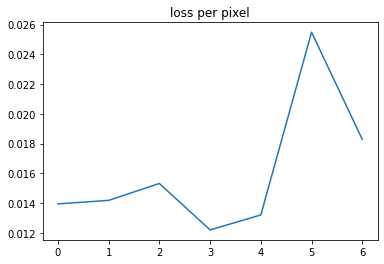

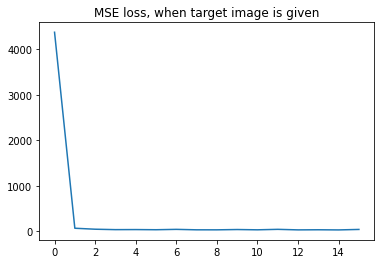

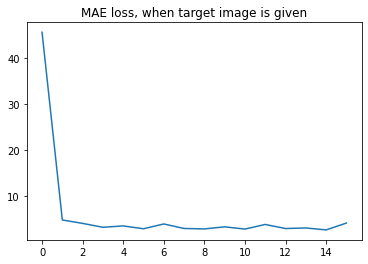

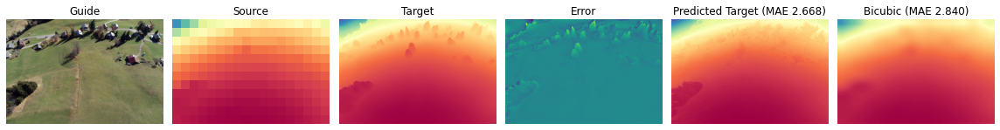

MSE: 30.349  ---  MAE: 2.668  ---  PBP: 0.479



####### image 23/25 - image idx 22 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[4291.75       73.6228     67.87427    56.874752   50.546307   43.26061
   43.76256    48.309162   44.503162   41.00488    40.80495    44.841755
   39.059025   44.22953    45.907494   36.143112]
----------MAE----------
(16,)
[43.786613   4.7125244  4.5400996  4.383863   3.773232   3.2523458
  3.4409502  3.3907726  3.456592   3.2758672  3.3638613  3.34206
  3.1483195  3.5509794  3.5304286  2.9447038]


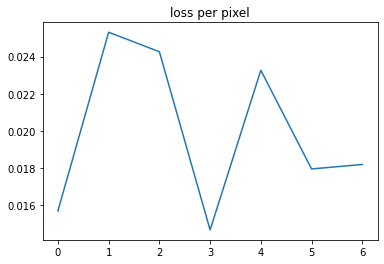

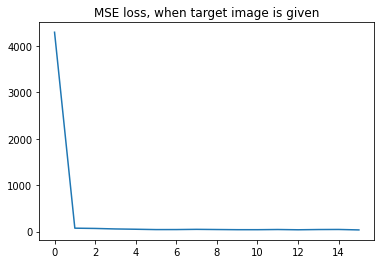

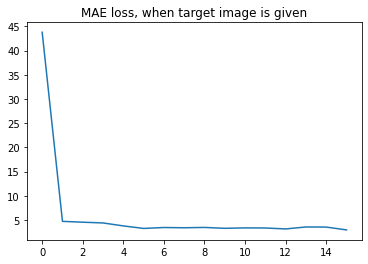

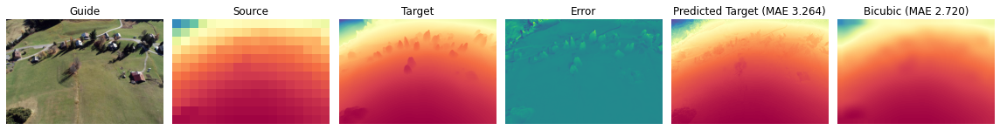

MSE: 39.724  ---  MAE: 3.264  ---  PBP: 0.654



####### image 24/25 - image idx 23 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[4172.8574    110.7003     56.803867   38.588585   48.062725   34.9307
   40.593258   36.566822   34.12622    33.803387   32.398407   32.287365
   34.298775   31.402262   30.585747   36.419044]
----------MAE----------
(16,)
[44.123318   5.460141   4.68488    3.730389   3.6593583  3.5007799
  3.572616   3.7158327  3.4004347  3.3885272  2.891596   2.991677
  3.3191016  3.1912153  3.0157783  3.4220955]


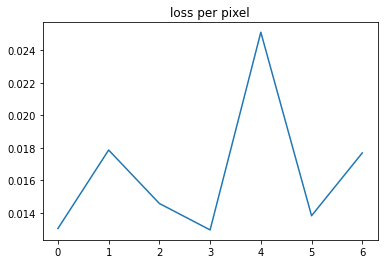

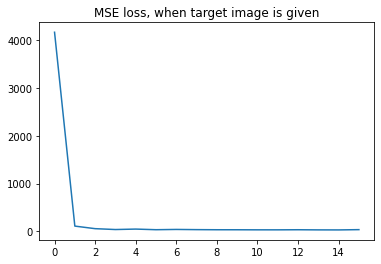

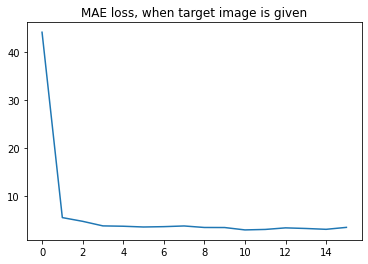

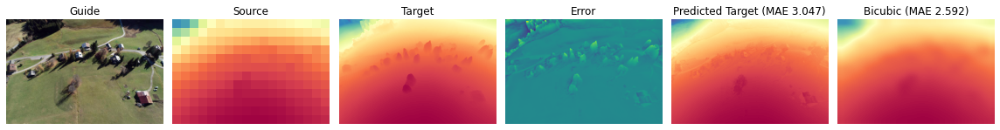

MSE: 32.203  ---  MAE: 3.047  ---  PBP: 0.561



####### image 25/25 - image idx 24 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3470.4282     91.43464    55.15641    45.29044    44.039154   43.7579
   45.91414    44.934086   46.359463   48.151524   44.184658   47.16252
   41.929024   41.352455   40.70375    47.372154]
----------MAE----------
(16,)
[41.142014   5.032375   4.176739   3.8398561  3.525642   3.4879222
  3.407279   3.451943   3.906446   3.936096   3.6029565  3.741907
  3.3630023  3.5952542  3.2038643  3.4183652]


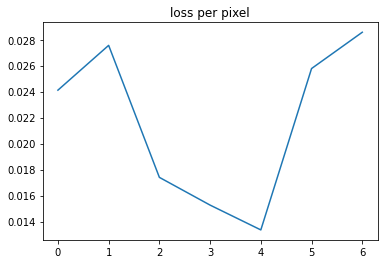

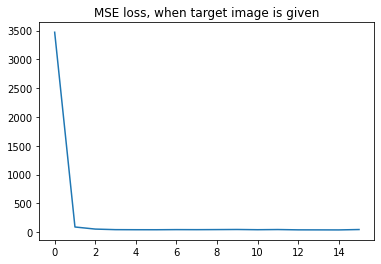

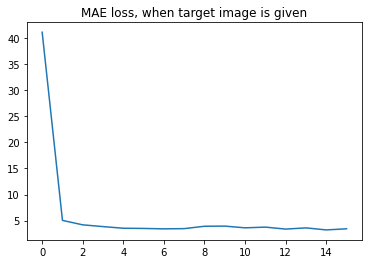

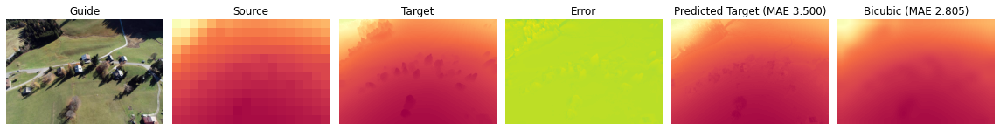

MSE: 46.245  ---  MAE: 3.500  ---  PBP: 0.620





In [18]:
####  define parameters  ########################################################
params = {'img_idxs' : [], # idx images to process, if empty then all of them
            
          'scaling': 40,
          'greyscale': False, # Turn image into grey-scale
          'channels': -1,
          
          'spatial_features_input': True,
          'weights_regularizer': [0.0001, 0.001, 0.0001], # spatial color head
          'loss': 'l1',
 
          'optim': 'adam',
          'lr': 0.001,
                  
          'batch_size': 32,
          'iteration': 1024*12*18//32,
                  
          'logstep': 64,
          
          'final_TGV' : False, # Total Generalized Variation in post-processing
          'align': False, # Move image around for evaluation in case guide image and target image are not perfectly aligned
          'delta_PBP': 1, # Delta for percentage of bad pixels 
         }

#### train and plot the results ################################################
if len(params['img_idxs'])==0:
    idxs = np.array(range(0,target_imgs.shape[0]))
else:
    idxs = params['img_idxs']

constant = 0
    
for n_image,idx in enumerate(idxs):
    
    print("####### image {}/{} - image idx {} ########".format(n_image+1,len(idxs),idx))
    
    guide_img = guide_imgs[idx]
    target_img = target_imgs[idx]
    source_img = downsample(target_img,params['scaling'])
    save_path = directory+'/saved_model_comballaz_oblique/model'+str(constant + idx)+'.pt'
    # check if the directory exist
    os.makedirs(os.path.dirname(save_path),exist_ok=True)
    
    bicubic_target_img = bicubic(source_img=source_img, scaling_factor=params['scaling'])
    
    predicted_target_img = PixTransform(guide_img=guide_img,source_img=source_img,params=params,target_img=target_img, path = save_path)
    


    if params['final_TGV'] :
        print("applying TGV...")
        predicted_target_img = tvgen(predicted_target_img,[0.1, 0.1],[1, 2],[1, 1])
        
    if params['align'] :
        print("aligning...")
        target_img,predicted_target_img = align_images(target_img,predicted_target_img)

    f, ax = plot_result(guide_img,source_img,predicted_target_img,bicubic_target_img,target_img)
    plt.show()
    
    if target_img is not None:
        # compute metrics and plot results
        MSE = np.mean((predicted_target_img - target_img) ** 2)
        MAE = np.mean(np.abs(predicted_target_img - target_img))
        PBP = np.mean(np.abs(predicted_target_img - target_img) > params["delta_PBP"])

        print("MSE: {:.3f}  ---  MAE: {:.3f}  ---  PBP: {:.3f}".format(MSE,MAE,PBP))
        print("\n\n")
 


## upsampling 90

In [19]:
torch.cuda.empty_cache()

In [20]:
guide_imgs = []
target_imgs= []

for num in range(len(_rgb_files)):
    rgb_img = imageio.imread(_rgb_files[num])
    guide_imgs.append(rgb_img)
    dist_img = torch.load(_dist_files[num])
    dist_img = dist_img.detach().cpu().numpy()
    target_imgs.append(dist_img)
        
guide_imgs = np.asarray(guide_imgs)
guide_imgs = np.einsum('ijkl->iljk', guide_imgs)        
target_imgs = np.asarray(target_imgs)

In [21]:
## crop images
new_guide_imgs = guide_imgs[:,:,15:465,:]
new_target_imgs = target_imgs[:,15:465,:]
print(new_guide_imgs.shape)
print(new_target_imgs.shape)

(25, 3, 450, 720)
(25, 450, 720)


####### image 1/25 - image idx 0 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2688.5847     42.91196    45.73384    28.48394    27.613619   32.320683
   31.707363   31.182726   27.862228   28.521936   30.024284   28.29664
   29.903015   28.692554   30.704473   29.217705]
----------MAE----------
(16,)
[28.965387   3.3878877  4.2911525  2.9150653  2.7316127  2.7741778
  3.0367625  3.1548173  2.6231976  2.4753308  2.5663307  2.4192715
  2.582206   2.707832   2.8957827  2.6300883]


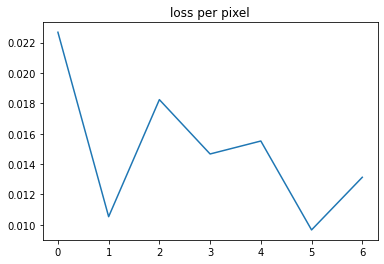

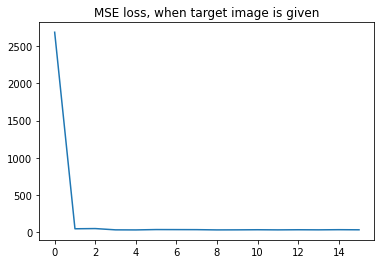

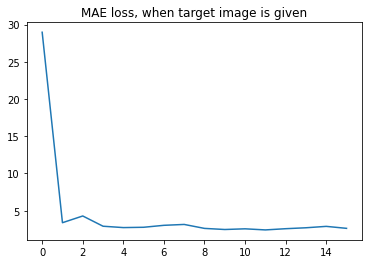

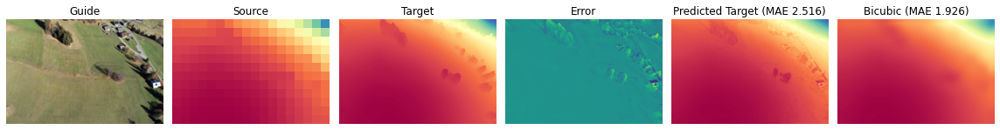

MSE: 29.335  ---  MAE: 2.516  ---  PBP: 0.409



####### image 2/25 - image idx 1 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3210.4707    114.39953    82.20387    72.08956    74.05174    66.73274
   70.694786   65.38594    72.753716   69.5217     78.952415   63.77125
   58.789165   59.268784   59.58456    63.264057]
----------MAE----------
(16,)
[32.850002   5.911758   4.495987   4.3337502  4.450976   4.107932
  4.8088894  3.937212   4.252124   4.5455084  5.019803   4.018373
  3.6219928  3.5877206  3.69003    3.7246997]


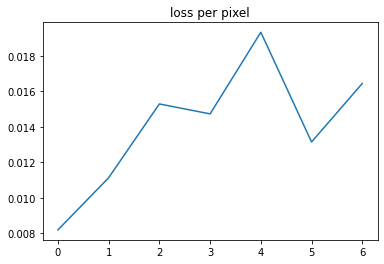

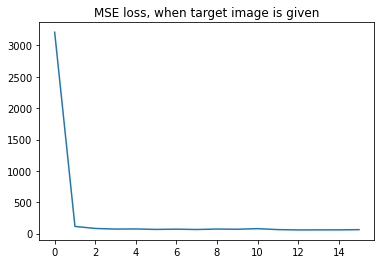

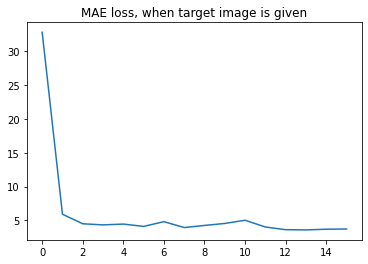

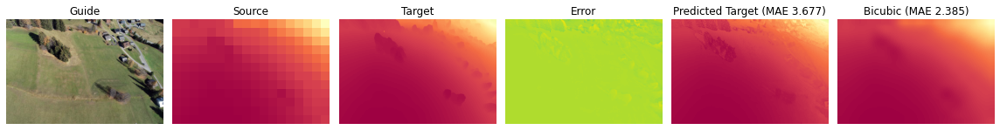

MSE: 61.940  ---  MAE: 3.677  ---  PBP: 0.471



####### image 3/25 - image idx 2 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2549.097     129.40526   107.73052   114.68667   101.61528    97.154396
  102.52941    85.868904   83.58265    81.45908    76.42742    75.054436
   76.736885   77.35065    71.79381    71.02729 ]
----------MAE----------
(16,)
[29.233288   6.3844547  5.540868   5.9698668  5.445669   5.239148
  5.4434342  5.189289   4.7326727  4.91621    4.5799513  4.477661
  4.6351304  4.756955   4.356041   4.3748174]


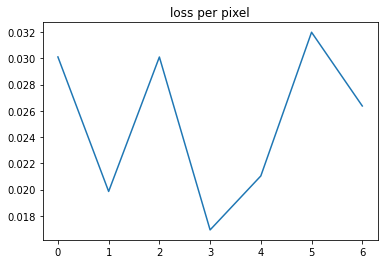

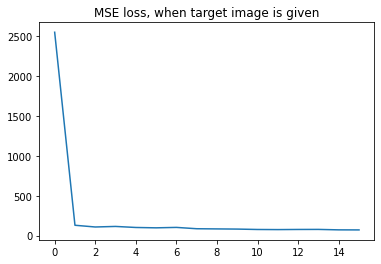

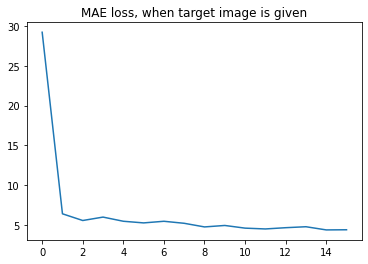

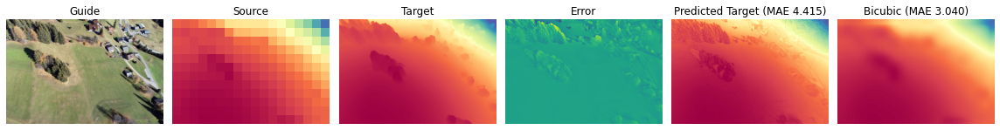

MSE: 71.072  ---  MAE: 4.415  ---  PBP: 0.615



####### image 4/25 - image idx 3 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[4527.164      77.956825   69.50437    61.7866     52.461903   52.350163
   48.286465   50.29422    55.04806    44.841515   40.005596   38.97566
   40.45526    37.50139    38.8562     38.762264]
----------MAE----------
(16,)
[48.14793    5.581812   5.1028876  4.8889847  4.5208726  4.444662
  4.201485   4.7099824  5.1018195  4.363908   3.87866    3.6889489
  3.8328946  3.649076   3.9406605  3.7611003]


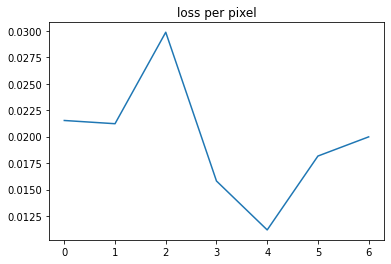

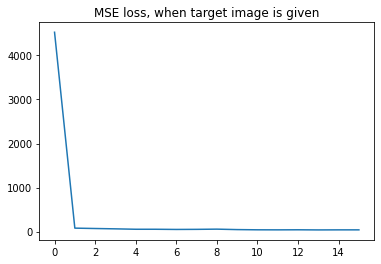

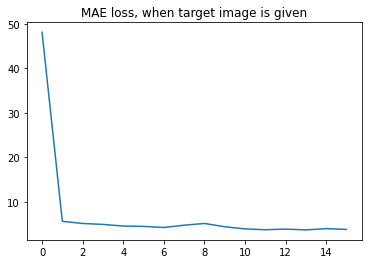

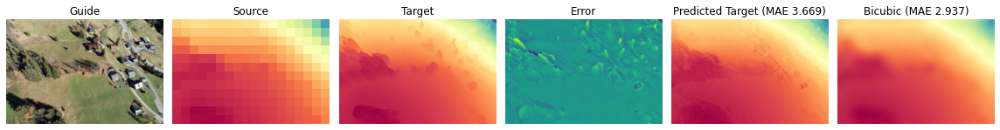

MSE: 36.021  ---  MAE: 3.669  ---  PBP: 0.681



####### image 5/25 - image idx 4 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[846.0756      8.729311    4.929417   10.890094    9.914575    5.1153293
   4.2029934   4.386721    4.3392715   4.312408    4.726486    3.9946113
   5.350235    4.106342    4.199194    5.557616 ]
----------MAE----------
(16,)
[19.175323   2.104551   1.3522453  2.2981522  2.198235   1.3851504
  1.1704043  1.2050397  1.2276925  1.2033031  1.2751018  1.0778242
  1.4978596  1.097175   1.1160119  1.5180478]


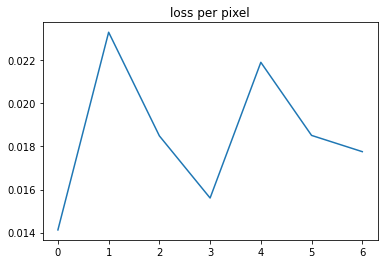

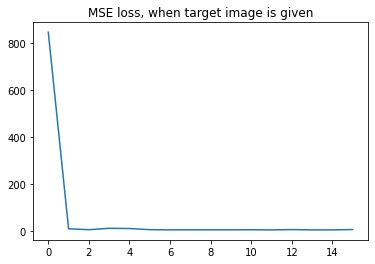

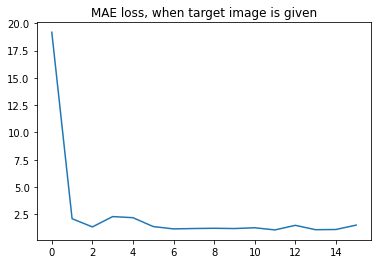

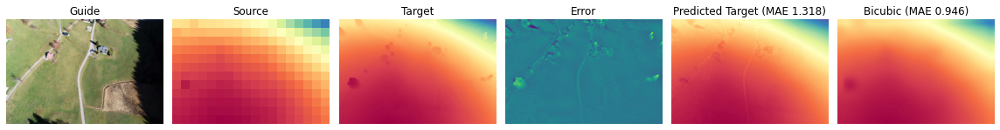

MSE: 4.862  ---  MAE: 1.318  ---  PBP: 0.442



####### image 6/25 - image idx 5 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1738.6761      14.311423    17.764242    20.719172    11.259887
    9.138335     7.390909     9.340912     7.772352     9.951086
    7.381759     7.034363     7.073486     7.0298133    6.9738164
    6.9645457]
----------MAE----------
(16,)
[30.100433   2.49636    2.9798346  3.3254137  2.4941058  1.8344268
  1.4581406  1.7348024  1.6051749  1.9118531  1.5512401  1.3894958
  1.5104747  1.3972518  1.4235811  1.4080803]


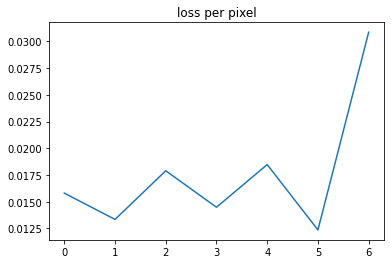

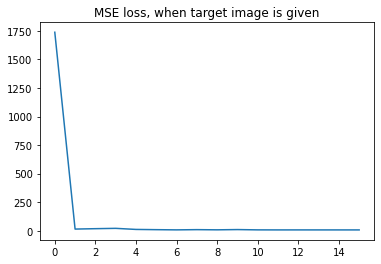

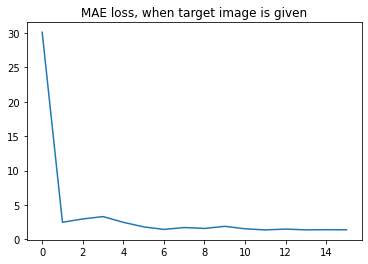

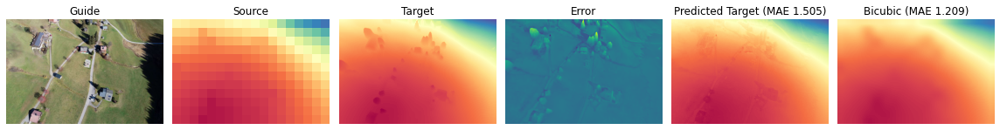

MSE: 7.674  ---  MAE: 1.505  ---  PBP: 0.401



####### image 7/25 - image idx 6 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1740.0001     20.308159   16.190119   13.866045   15.659265   14.076253
   12.501583   12.628747   15.643073   12.0143     12.103654   13.876223
   15.003906   11.857448   11.635333   11.327199]
----------MAE----------
(16,)
[26.922987   2.6920083  2.301962   1.8994951  2.2613363  2.0475118
  1.6599703  1.7888339  2.1502929  1.6631514  1.6219307  2.2380705
  2.2302258  1.5810697  1.5618689  1.4832499]


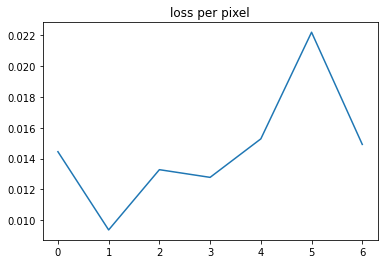

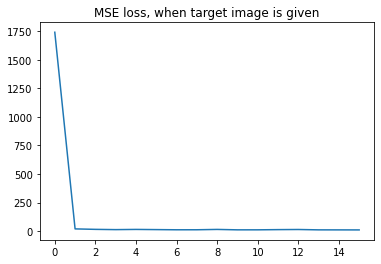

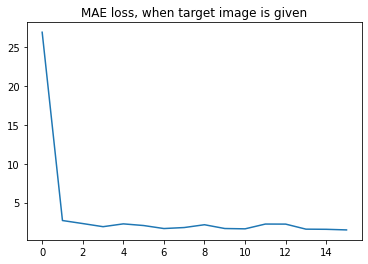

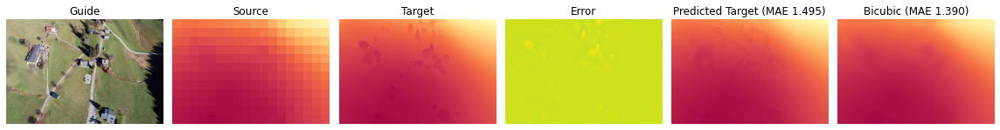

MSE: 11.217  ---  MAE: 1.495  ---  PBP: 0.405



####### image 8/25 - image idx 7 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2307.2573     64.886734   49.58386    50.2643     56.608      49.23395
   44.16542    40.338917   43.821552   40.716476   45.966545   40.895416
   37.920612   40.56078    38.6202     40.82305 ]
----------MAE----------
(16,)
[30.37922    4.4926996  3.2578175  3.3494878  3.3848271  3.1454232
  2.9786215  2.64682    2.9255764  2.6315577  3.2009296  2.7760005
  2.6160688  2.721423   2.8584325  2.816769 ]


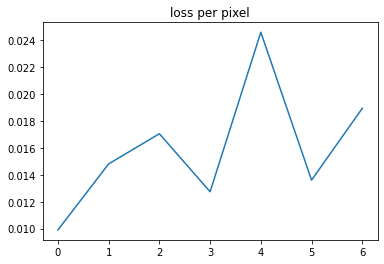

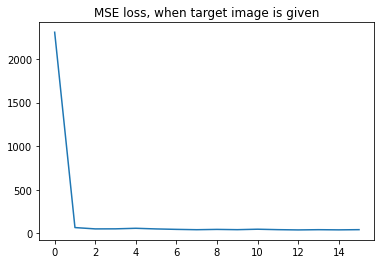

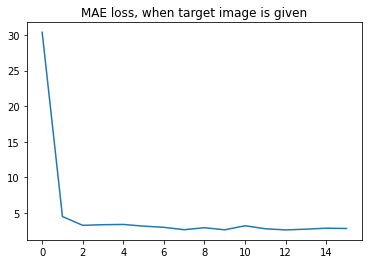

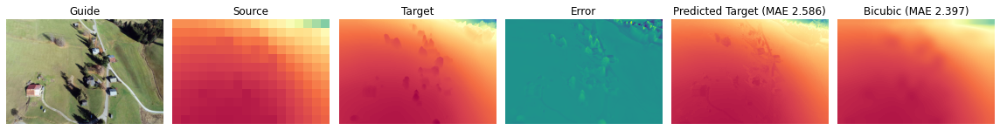

MSE: 39.543  ---  MAE: 2.586  ---  PBP: 0.452



####### image 9/25 - image idx 8 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3653.2856     58.16059    56.058407   44.034824   50.431824   36.651604
   36.67199    35.304718   37.438454   35.571487   35.932217   33.63151
   32.77494    33.02337    31.938604   31.25463 ]
----------MAE----------
(16,)
[36.19585    4.281763   4.113717   3.4627292  4.1867614  3.1793272
  3.0789843  2.967438   3.4173408  3.165645   3.2598937  2.8698397
  2.9203198  2.9490266  2.8329973  2.769427 ]


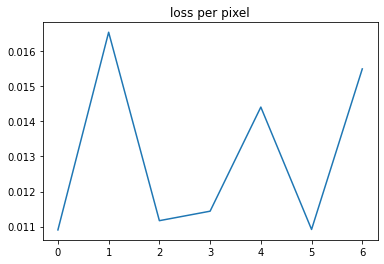

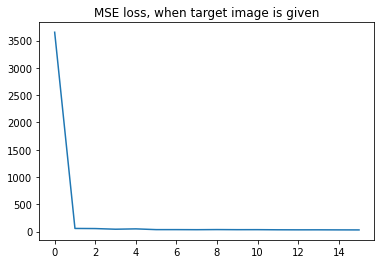

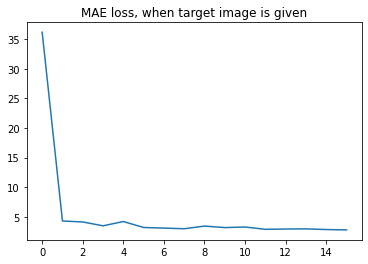

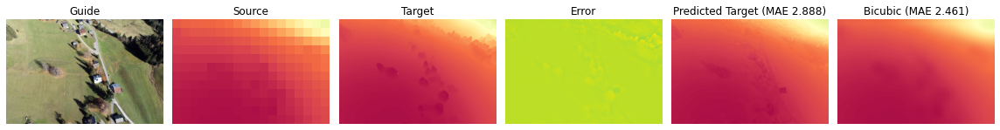

MSE: 32.734  ---  MAE: 2.888  ---  PBP: 0.522



####### image 10/25 - image idx 9 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3977.1196     54.849712   52.8656     57.000797   57.938183   50.540417
   45.431957   45.799572   45.869625   43.287933   46.930794   45.491318
   47.45911    42.071487   42.91617    42.365356]
----------MAE----------
(16,)
[41.492447   3.99983    4.4319906  4.074213   4.809165   3.7138183
  3.637346   3.577172   3.7587163  3.6750426  3.5267253  3.4583318
  3.524156   3.4216716  3.273364   3.3611052]


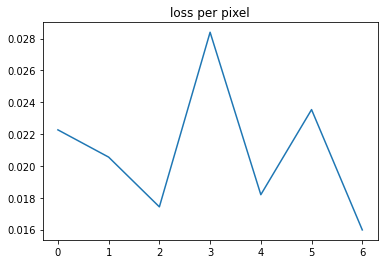

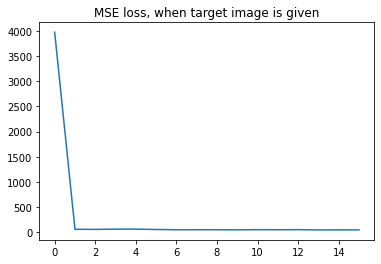

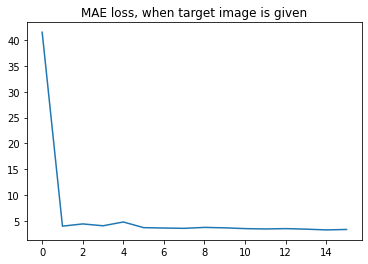

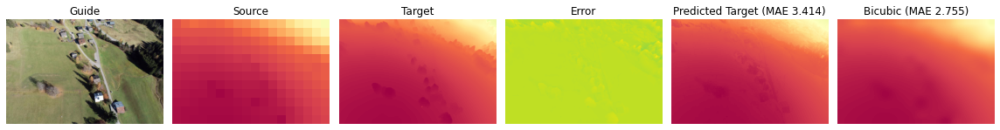

MSE: 43.460  ---  MAE: 3.414  ---  PBP: 0.592



####### image 11/25 - image idx 10 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2588.1929     67.84753    40.84038    48.857933   48.77139    38.860962
   39.352673   42.07969    36.423798   49.39817    37.191555   37.736717
   35.752174   38.51774    34.51442    35.402786]
----------MAE----------
(16,)
[36.04122    5.8476605  3.863466   4.321198   4.199054   3.5819361
  3.7753828  3.8184114  3.5193648  4.8342123  3.4484208  3.4098706
  3.5859041  3.7835145  3.4418635  3.5933144]


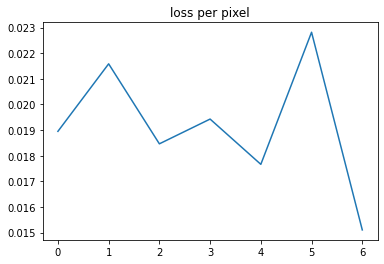

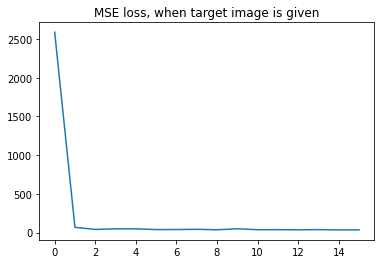

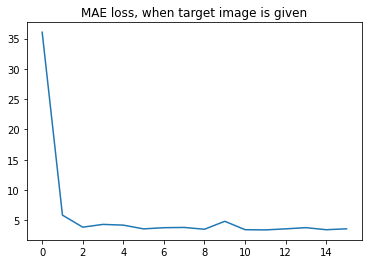

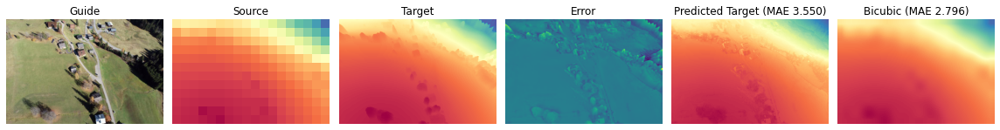

MSE: 36.730  ---  MAE: 3.550  ---  PBP: 0.697



####### image 12/25 - image idx 11 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3270.6216     49.105186   47.82648    47.54082    40.92217    39.263596
   38.303947   35.269455   36.49013    33.8893     37.73865    34.19654
   36.819298   40.00856    35.357903   35.31816 ]
----------MAE----------
(16,)
[37.56269    4.383808   4.8436007  4.22457    4.1575766  3.7441328
  3.9395642  3.4476497  3.4920387  3.2815537  3.620437   3.3891826
  4.0020876  4.061397   3.3191428  3.5941508]


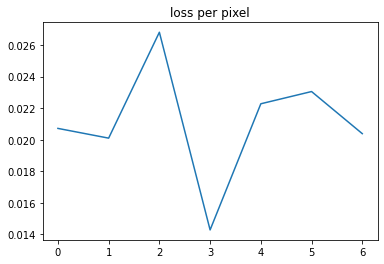

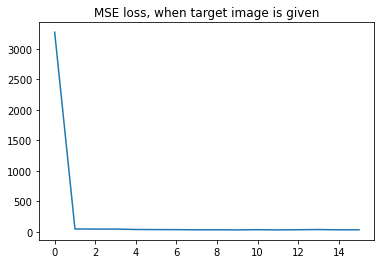

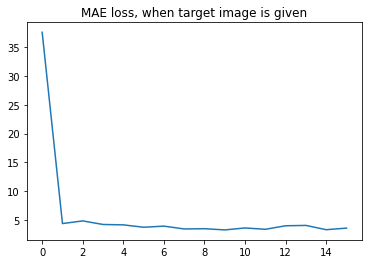

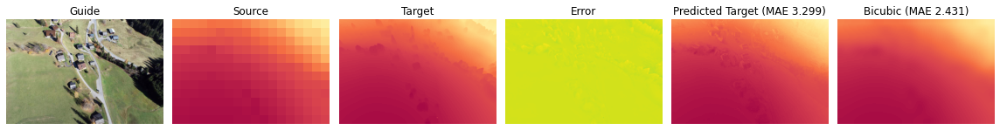

MSE: 33.171  ---  MAE: 3.299  ---  PBP: 0.624



####### image 13/25 - image idx 12 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3870.3696     59.672176   40.467472   40.060455   34.136772   33.767212
   34.691452   36.898705   31.956556   34.648636   33.59902    31.000471
   29.238304   33.69828    43.21643    36.14231 ]
----------MAE----------
(16,)
[44.365948   5.7517786  4.4569907  4.4046392  3.630495   3.5141098
  3.7189052  4.0527062  3.450908   3.9378903  3.622288   3.6559136
  3.3037825  3.6900673  4.3460436  4.4414587]


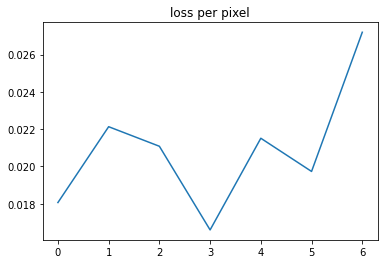

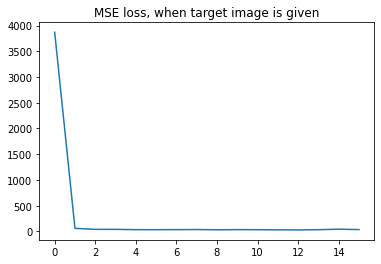

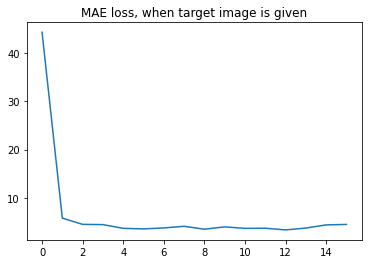

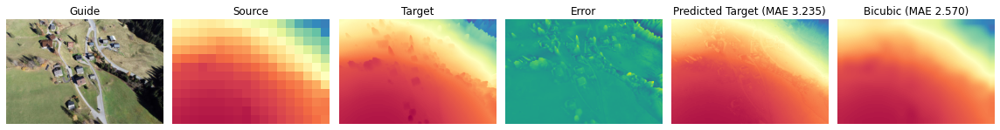

MSE: 28.068  ---  MAE: 3.235  ---  PBP: 0.630



####### image 14/25 - image idx 13 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[791.11145  148.44266   87.238365  79.85409   75.39135   74.74256
  76.761475  88.49474   66.36968   67.966965  72.82993   64.11902
  61.928814  64.221725  62.178646  62.911457]
----------MAE----------
(16,)
[17.91437    7.433139   5.726867   5.445605   5.2662134  5.332672
  5.315265   6.2019186  4.7648582  4.9383917  4.9618607  4.6199803
  4.588842   4.578631   4.492761   4.5753636]


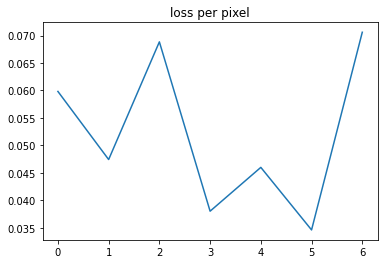

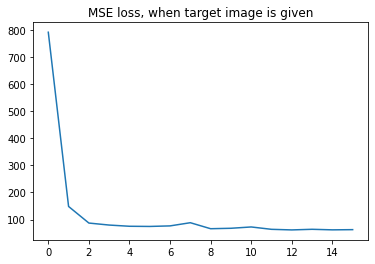

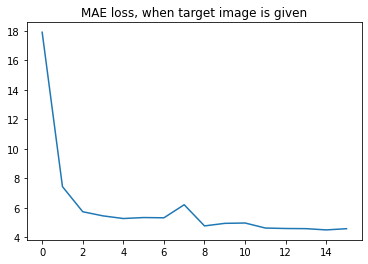

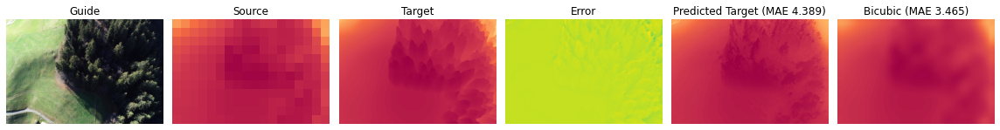

MSE: 61.975  ---  MAE: 4.389  ---  PBP: 0.632



####### image 15/25 - image idx 14 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[2790.9736    163.89497   142.90282   121.32822   121.00229   112.69005
  106.10809   101.743935  102.097015   98.56234   102.48764   101.28148
  100.54128    97.53241    99.27641   102.89407 ]
----------MAE----------
(16,)
[32.352703   9.486976   8.814817   7.9410133  7.738679   7.3038397
  7.0132365  6.8627176  6.902754   6.733589   7.2070575  6.821582
  6.8880424  6.8032436  6.9927487  6.8832507]


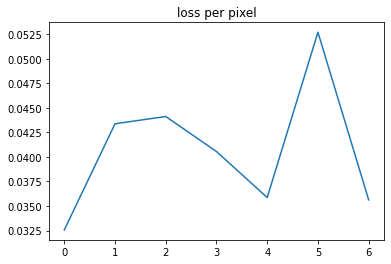

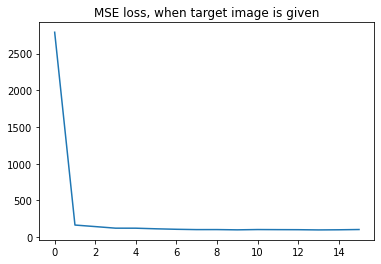

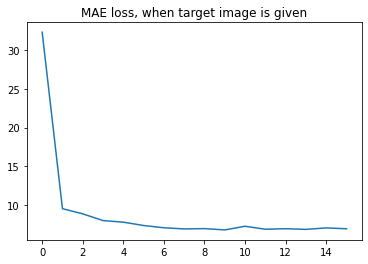

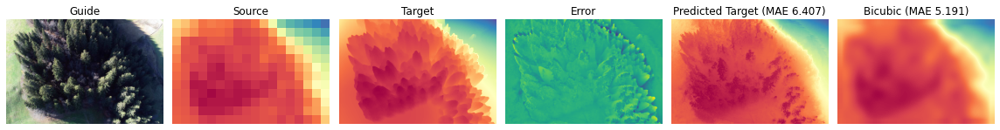

MSE: 94.735  ---  MAE: 6.407  ---  PBP: 0.853



####### image 16/25 - image idx 15 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[1508.3088    102.62228    85.31259    81.46131    81.29768    79.007904
   83.95214    75.55641    76.44643    74.95731    78.731346   83.22763
   75.91494    76.74256    75.24364    73.86168 ]
----------MAE----------
(16,)
[29.01009    6.6834707  6.235978   6.0673556  5.886131   5.888529
  6.145109   5.6769295  5.7407503  5.521901   5.87346    6.324577
  5.4612393  5.4996624  5.47092    5.415294 ]


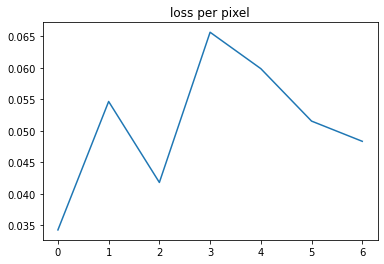

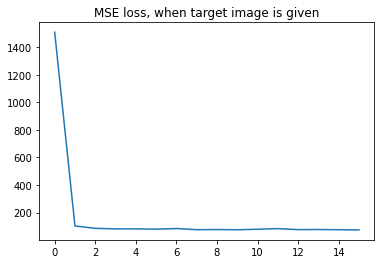

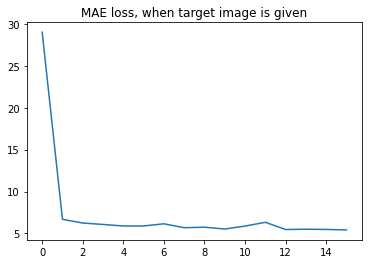

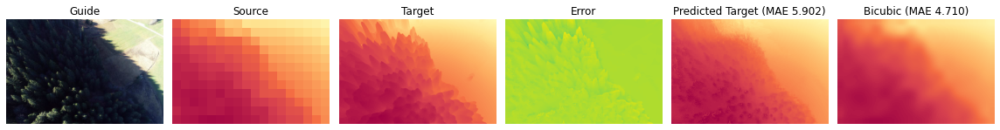

MSE: 79.630  ---  MAE: 5.902  ---  PBP: 0.823



####### image 17/25 - image idx 16 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[322.9754    17.535488  14.807553  12.741003  12.279143  12.204097
  13.79134   13.206712  13.685174  12.713652  12.036044  11.93193
  11.810491  12.024718  11.625792  11.873952]
----------MAE----------
(16,)
[12.500134   2.3371973  2.1760898  1.7884157  1.6934437  1.6863664
  1.9101251  1.7698058  1.9031402  1.842368   1.5707557  1.5263878
  1.5596358  1.6077259  1.4663345  1.5504528]


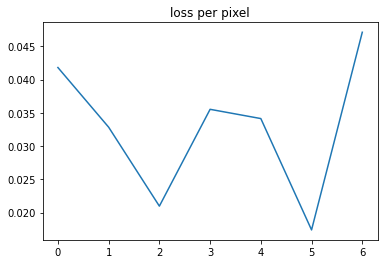

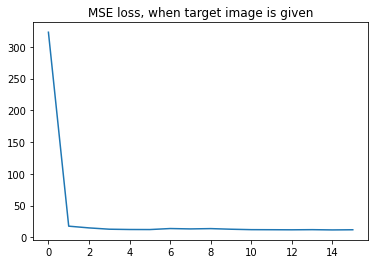

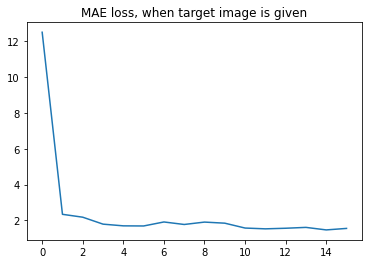

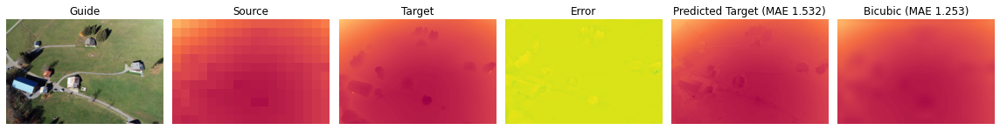

MSE: 12.059  ---  MAE: 1.532  ---  PBP: 0.393



####### image 18/25 - image idx 17 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[352.68115    10.206734    7.4442897   8.016743    8.3982      6.9421825
   8.435494    7.376952    6.213488    6.487581    6.2532177   6.219087
   6.303598    7.3944488   6.3239555   6.1525507]
----------MAE----------
(16,)
[13.279767   1.9862334  1.4097033  1.567239   1.5495057  1.3609768
  1.7403208  1.4124794  1.1616414  1.2736439  1.1503905  1.1281786
  1.1786427  1.6053536  1.1946313  1.223072 ]


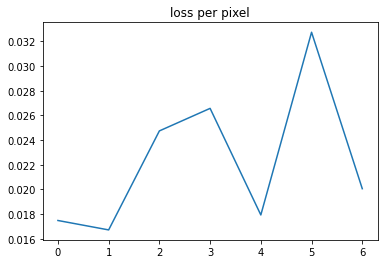

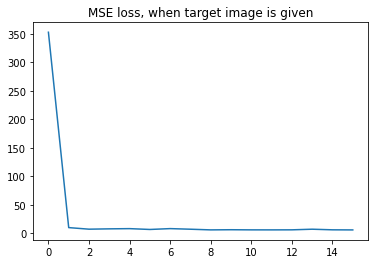

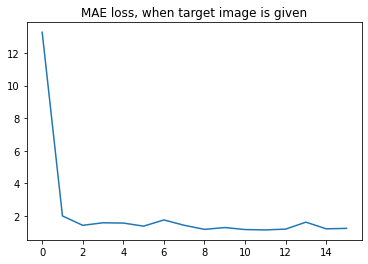

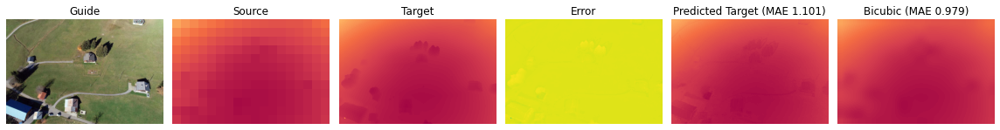

MSE: 5.969  ---  MAE: 1.101  ---  PBP: 0.276



####### image 19/25 - image idx 18 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[469.1113     12.235338    8.4642315   7.981686    7.0988584   7.2381287
   7.866586    7.009181    6.9287486   6.474667    6.5571165   6.9593534
   6.286592    6.2322164   6.060367    5.9348674]
----------MAE----------
(16,)
[16.614714   2.164868   1.7631819  1.616214   1.371724   1.4084384
  1.6047497  1.2952359  1.2760439  1.2051742  1.2442398  1.5242603
  1.2976698  1.1865869  1.1700014  1.1199826]


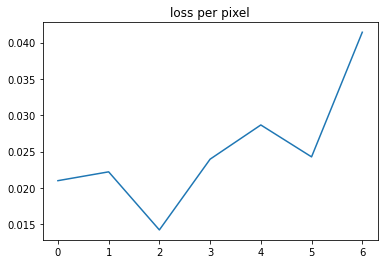

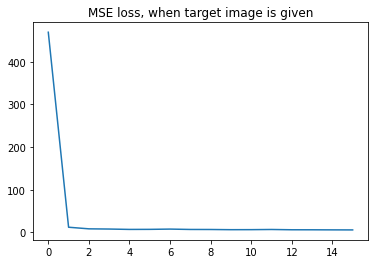

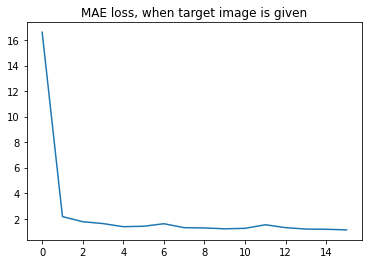

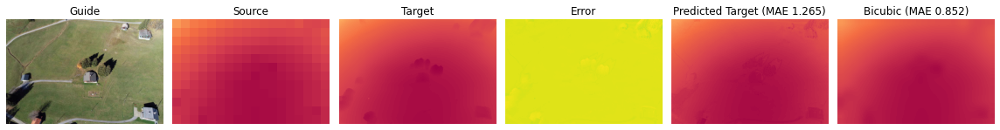

MSE: 6.156  ---  MAE: 1.265  ---  PBP: 0.333



####### image 20/25 - image idx 19 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[119.92978     5.657178    4.2906723   4.111188    4.117982    4.356533
   4.149905    3.8381152   3.7142043   3.9718597   3.6757317   3.965318
   3.9279778   3.9984612   3.8621676   4.0691257]
----------MAE----------
(16,)
[8.265999  1.4025339 1.1226857 1.1074405 1.1246996 1.3873699 1.2467334
 1.0752858 1.0306121 1.037705  1.036094  1.0653356 1.0938902 1.0550425
 1.0122705 1.2177157]


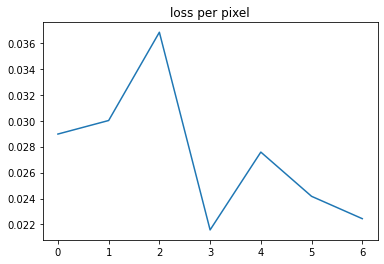

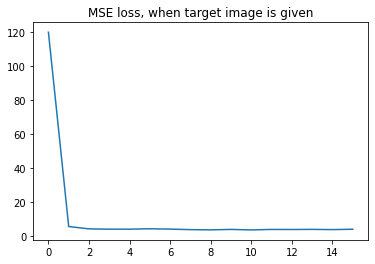

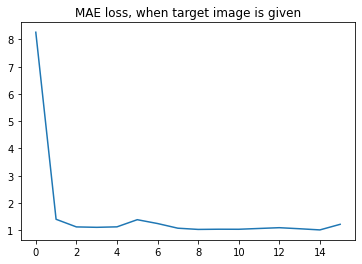

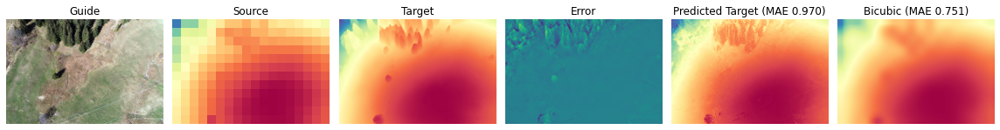

MSE: 3.657  ---  MAE: 0.970  ---  PBP: 0.224



####### image 21/25 - image idx 20 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3923.228     158.30588    88.65974    65.45955    56.189026   47.637493
   47.125446   43.39261    39.2471     38.78084    37.835415   37.28658
   42.829067   36.113605   39.36454    34.739162]
----------MAE----------
(16,)
[38.066803   5.910039   4.8840547  4.4255266  3.5855067  3.250455
  3.45293    3.2726786  2.8633611  2.8513038  2.924394   2.7914739
  3.0543897  3.058666   3.104781   2.9394746]


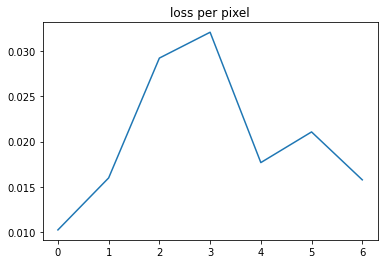

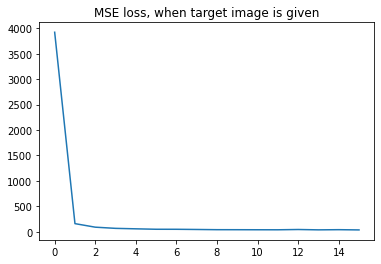

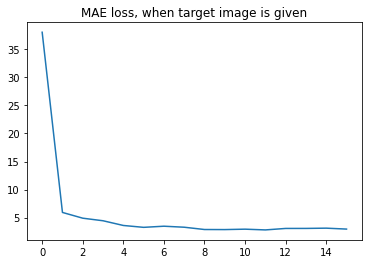

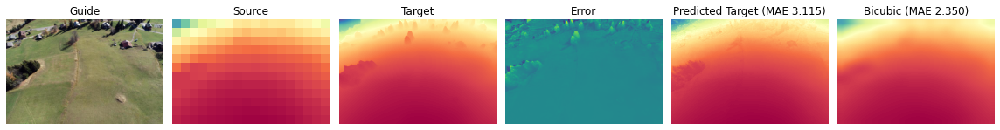

MSE: 35.122  ---  MAE: 3.115  ---  PBP: 0.674



####### image 22/25 - image idx 21 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3492.7244     54.393993   47.154545   39.038845   49.85321    50.28845
   36.431408   35.909054   32.70203    52.69007    35.470467   35.848633
   57.601643   33.832996   31.241512   32.939423]
----------MAE----------
(16,)
[39.87154    4.1037016  3.4079623  3.1220508  4.088413   4.3707085
  2.93295    2.9165268  2.8469503  4.262197   2.9824512  3.2995207
  4.093644   2.7457242  2.6570606  2.9547613]


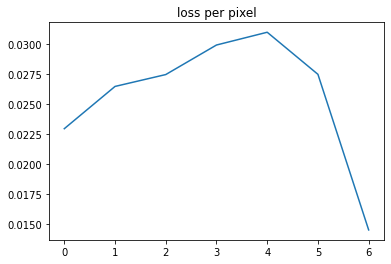

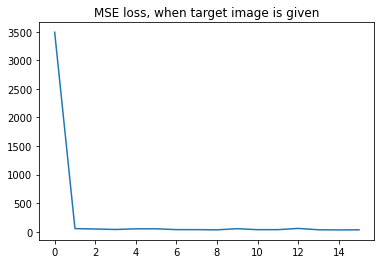

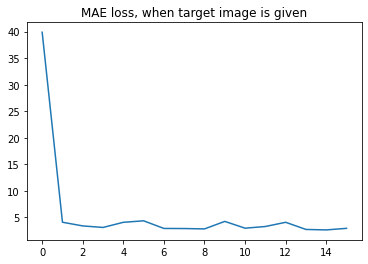

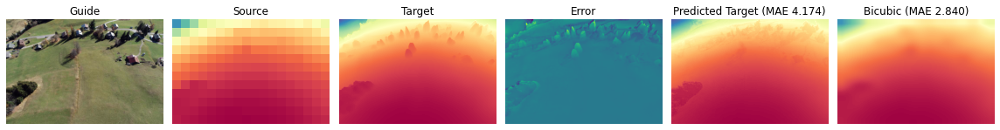

MSE: 46.222  ---  MAE: 4.174  ---  PBP: 0.897



####### image 23/25 - image idx 22 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3993.8633     76.18718    53.298466   43.1063     57.307545   44.591442
   44.297585   39.32075    40.411545   41.14782    35.843647   39.04105
   39.268757   38.46004    38.135418   35.25038 ]
----------MAE----------
(16,)
[41.34729    5.899073   3.8421817  3.3723915  4.7404275  3.9901168
  4.4095683  3.3866937  3.2618663  3.4372342  3.1258576  3.4244654
  3.5063405  3.2558355  3.4603114  3.3573909]


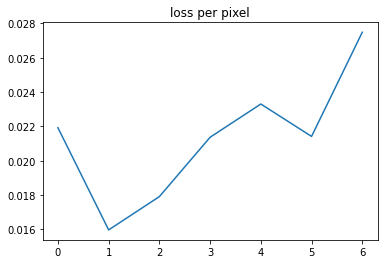

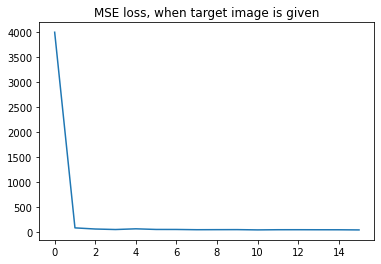

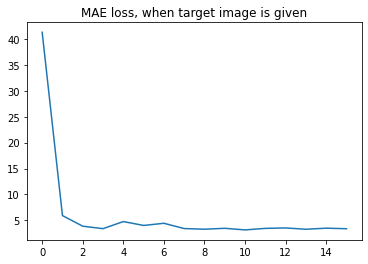

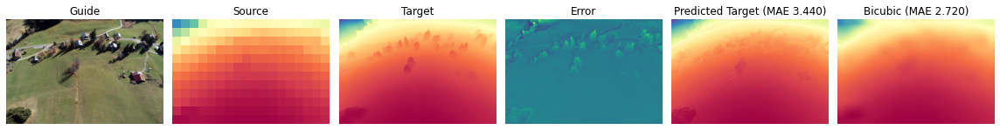

MSE: 34.599  ---  MAE: 3.440  ---  PBP: 0.800



####### image 24/25 - image idx 23 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[3429.344     108.27183    70.15243    44.51877    40.50544    37.51072
   39.163517   36.024162   34.864357   32.867924   45.970226   32.862602
   32.16814    30.64022    32.322174   29.695076]
----------MAE----------
(16,)
[39.51659    6.1984634  4.718516   4.102658   3.6156812  3.4351678
  3.6288347  3.6353037  3.5550344  3.07076    4.2050996  3.325871
  3.2313628  3.0451305  2.990342   2.9365613]


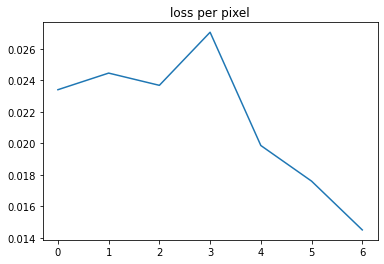

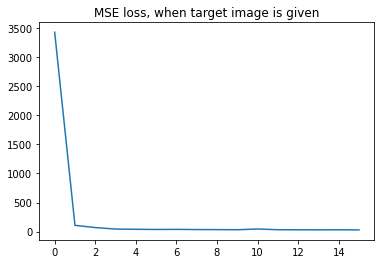

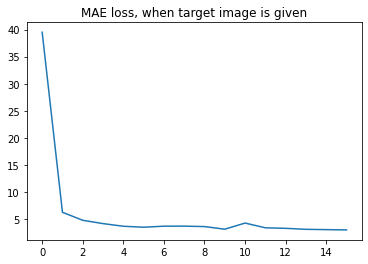

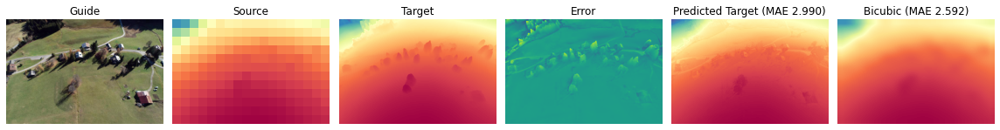

MSE: 30.668  ---  MAE: 2.990  ---  PBP: 0.538



####### image 25/25 - image idx 24 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[4299.0713     75.67837    55.497616   46.74049    46.21567    41.57691
   42.536728   64.61828    41.757164   40.28304    39.229958   38.74731
   38.46536    39.168392   39.15975    37.557026]
----------MAE----------
(16,)
[46.69268    5.595264   5.2180853  4.065305   3.9452798  3.425557
  3.3302112  4.905886   3.5075724  3.3643117  3.3667498  3.382568
  3.3476243  3.3562405  3.1661499  3.3798778]


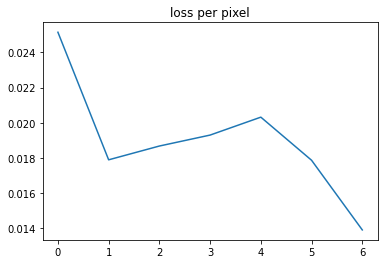

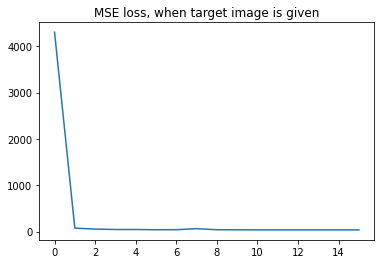

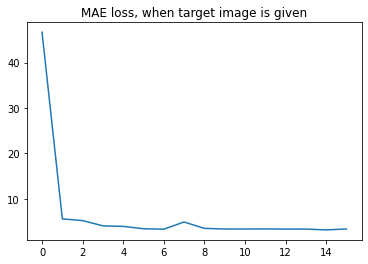

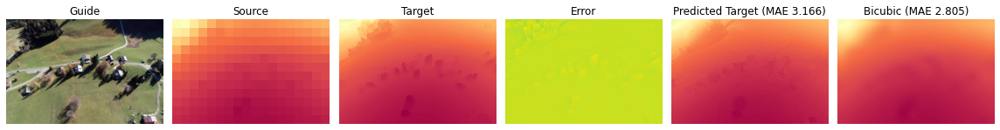

MSE: 38.396  ---  MAE: 3.166  ---  PBP: 0.575





In [22]:
####  define parameters  ########################################################
params = {'img_idxs' : [], # idx images to process, if empty then all of them
            
          'scaling': 40,
          'greyscale': False, # Turn image into grey-scale
          'channels': -1,
          
          'spatial_features_input': True,
          'weights_regularizer': [0.0001, 0.001, 0.0001], # spatial color head
          'loss': 'l1',
 
          'optim': 'adam',
          'lr': 0.001,
                  
          'batch_size': 32,
          'iteration': 1024*12*18//32,
                  
          'logstep': 64,
          
          'final_TGV' : False, # Total Generalized Variation in post-processing
          'align': False, # Move image around for evaluation in case guide image and target image are not perfectly aligned
          'delta_PBP': 1, # Delta for percentage of bad pixels 
         }

#### train and plot the results ################################################
if len(params['img_idxs'])==0:
    idxs = np.array(range(0,target_imgs.shape[0]))
else:
    idxs = params['img_idxs']

constant = 0
    
for n_image,idx in enumerate(idxs):
    
    print("####### image {}/{} - image idx {} ########".format(n_image+1,len(idxs),idx))
    
    guide_img = guide_imgs[idx]
    target_img = target_imgs[idx]
    source_img = downsample(target_img,params['scaling'])
    save_path = directory+'/saved_model_comballaz_nadir/model'+str(constant + idx)+'.pt'
    # check if the directory exist
    os.makedirs(os.path.dirname(save_path),exist_ok=True)
    
    bicubic_target_img = bicubic(source_img=source_img, scaling_factor=params['scaling'])
    
    predicted_target_img = PixTransform(guide_img=guide_img,source_img=source_img,params=params,target_img=target_img, path = save_path)
    


    if params['final_TGV'] :
        print("applying TGV...")
        predicted_target_img = tvgen(predicted_target_img,[0.1, 0.1],[1, 2],[1, 1])
        
    if params['align'] :
        print("aligning...")
        target_img,predicted_target_img = align_images(target_img,predicted_target_img)

    f, ax = plot_result(guide_img,source_img,predicted_target_img,bicubic_target_img,target_img)
    plt.show()
    
    if target_img is not None:
        # compute metrics and plot results
        MSE = np.mean((predicted_target_img - target_img) ** 2)
        MAE = np.mean(np.abs(predicted_target_img - target_img))
        PBP = np.mean(np.abs(predicted_target_img - target_img) > params["delta_PBP"])

        print("MSE: {:.3f}  ---  MAE: {:.3f}  ---  PBP: {:.3f}".format(MSE,MAE,PBP))
        print("\n\n")
 
